In [1]:
# import important libraries/modules
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
# suppress warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# read data from file and have a feel for it
df = pd.read_csv('loan.csv')
print(df.shape)
print(df.head(5))
print(df.info())

(39717, 111)
        id  member_id  loan_amnt  funded_amnt  funded_amnt_inv        term  \
0  1077501    1296599       5000         5000           4975.0   36 months   
1  1077430    1314167       2500         2500           2500.0   60 months   
2  1077175    1313524       2400         2400           2400.0   36 months   
3  1076863    1277178      10000        10000          10000.0   36 months   
4  1075358    1311748       3000         3000           3000.0   60 months   

  int_rate  installment grade sub_grade  ... num_tl_90g_dpd_24m  \
0   10.65%       162.87     B        B2  ...                NaN   
1   15.27%        59.83     C        C4  ...                NaN   
2   15.96%        84.33     C        C5  ...                NaN   
3   13.49%       339.31     C        C1  ...                NaN   
4   12.69%        67.79     B        B5  ...                NaN   

  num_tl_op_past_12m pct_tl_nvr_dlq  percent_bc_gt_75 pub_rec_bankruptcies  \
0                NaN            NaN  

In [3]:
# remove columns having null values > 35%
# 54 of 110 columns have more than 99% missing values. We will drop these columns.
missing_cols = df.isnull().mean()*100
for col in missing_cols.index:
    if missing_cols[col] > 35:
        print(col, missing_cols[col])
        df = df.drop(col, axis=1)

mths_since_last_delinq 64.66248709620565
mths_since_last_record 92.98537150338646
next_pymnt_d 97.12969257496789
mths_since_last_major_derog 100.0
annual_inc_joint 100.0
dti_joint 100.0
verification_status_joint 100.0
tot_coll_amt 100.0
tot_cur_bal 100.0
open_acc_6m 100.0
open_il_6m 100.0
open_il_12m 100.0
open_il_24m 100.0
mths_since_rcnt_il 100.0
total_bal_il 100.0
il_util 100.0
open_rv_12m 100.0
open_rv_24m 100.0
max_bal_bc 100.0
all_util 100.0
total_rev_hi_lim 100.0
inq_fi 100.0
total_cu_tl 100.0
inq_last_12m 100.0
acc_open_past_24mths 100.0
avg_cur_bal 100.0
bc_open_to_buy 100.0
bc_util 100.0
mo_sin_old_il_acct 100.0
mo_sin_old_rev_tl_op 100.0
mo_sin_rcnt_rev_tl_op 100.0
mo_sin_rcnt_tl 100.0
mort_acc 100.0
mths_since_recent_bc 100.0
mths_since_recent_bc_dlq 100.0
mths_since_recent_inq 100.0
mths_since_recent_revol_delinq 100.0
num_accts_ever_120_pd 100.0
num_actv_bc_tl 100.0
num_actv_rev_tl 100.0
num_bc_sats 100.0
num_bc_tl 100.0
num_il_tl 100.0
num_op_rev_tl 100.0
num_rev_accts 1

In [4]:
# remove columns with 100% same/duplicate values
for col in df.columns:
    if df[col].nunique() == 1:
        print(col)
        df = df.drop(col, axis=1)
print(df.nunique())
print(df.shape)

pymnt_plan
initial_list_status
collections_12_mths_ex_med
policy_code
application_type
acc_now_delinq
chargeoff_within_12_mths
delinq_amnt
tax_liens
id                         39717
member_id                  39717
loan_amnt                    885
funded_amnt                 1041
funded_amnt_inv             8205
term                           2
int_rate                     371
installment                15383
grade                          7
sub_grade                     35
emp_title                  28820
emp_length                    11
home_ownership                 5
annual_inc                  5318
verification_status            3
issue_d                       55
loan_status                    3
url                        39717
desc                       26526
purpose                       14
title                      19615
zip_code                     823
addr_state                    50
dti                         2868
delinq_2yrs                   11
earliest_cr_line          

In [5]:
# massage data to make it ready for analysis
df['emp_length'] = df['emp_length'].fillna('10+ years')
df = df[(df['annual_inc'] > 5000) & (df['annual_inc'] < 200000)]
# correct types
df['revol_util'] = df['revol_util'].str.replace('%', '').astype(float)
df['int_rate'] = df['int_rate'].str.replace('%', '').astype(float)
df['grade'] = df['grade'].astype('category')
df['sub_grade'] = df['sub_grade'].astype('category')
df['emp_length'] = df['emp_length'].str.extract('(\d+)').astype(float)
# ignore 'Current' loans
df = df[(df['loan_status'] == 'Fully Paid') | (df['loan_status'] == 'Charged Off')]
#df['loan_status'] = df['loan_status'].apply(lambda x: 1 if x == 'Charged Off' else 0)
custom_home_ownership_mapping = {
    'NONE': 1,
    'OTHER': 2,
    'RENT': 3,
    'MORTGAGE': 4,
    'OWN': 5
}
df['home_ownership'] = df['home_ownership'].map(custom_home_ownership_mapping)
df = df[(df['pub_rec'] == 0) | (df['pub_rec'] == 1)]
df = df.loc[df['delinq_2yrs'].between(0, 8)]

In [6]:
# numerical colums
num_cols = ['loan_amnt', 'int_rate', 'installment', 'annual_inc', 'dti', 'open_acc', 'revol_bal', 'revol_util', 
            'total_acc', 'out_prncp', 'total_pymnt', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 
            'recoveries', 'collection_recovery_fee', 'last_pymnt_amnt']

Median: 9600.00
q1: 5200.00
q3: 15000.00


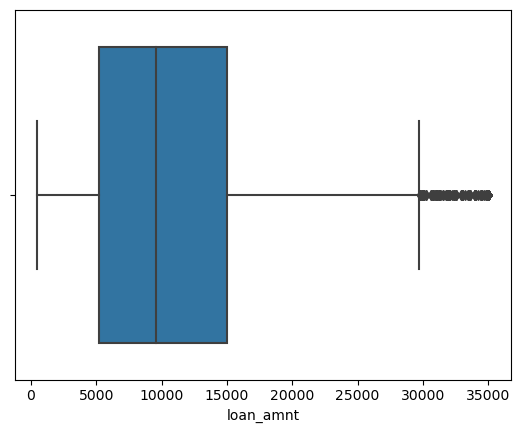

Median: 11.71
q1: 8.94
q3: 14.35


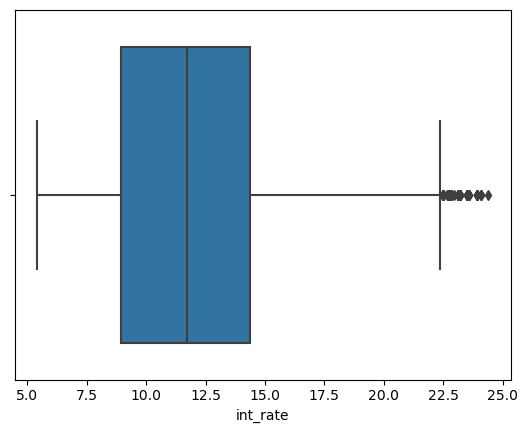

Median: 275.59
q1: 164.87
q3: 418.76


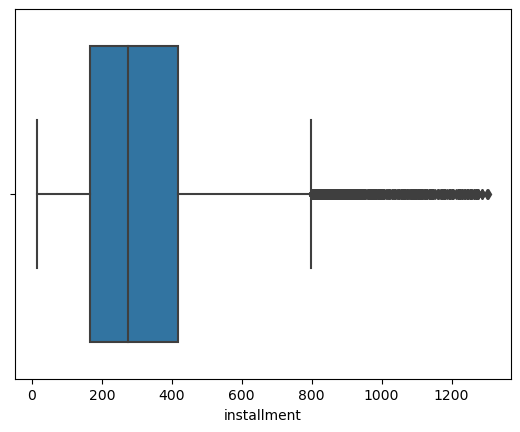

Median: 57936.00
q1: 40000.00
q3: 80000.00


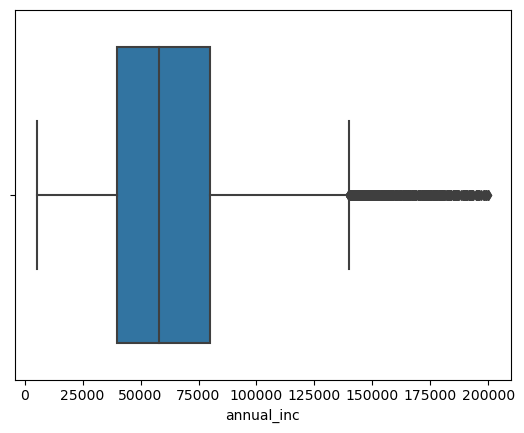

Median: 13.48
q1: 8.25
q3: 18.63


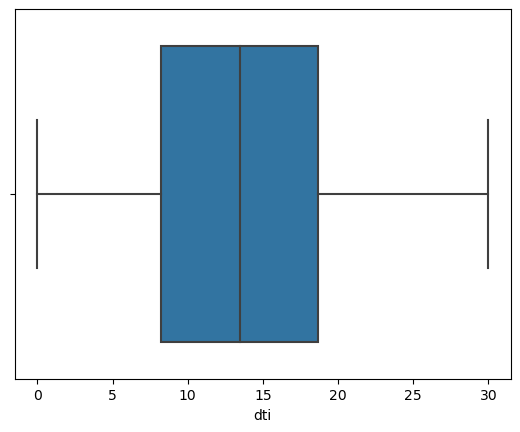

Median: 9.00
q1: 6.00
q3: 12.00


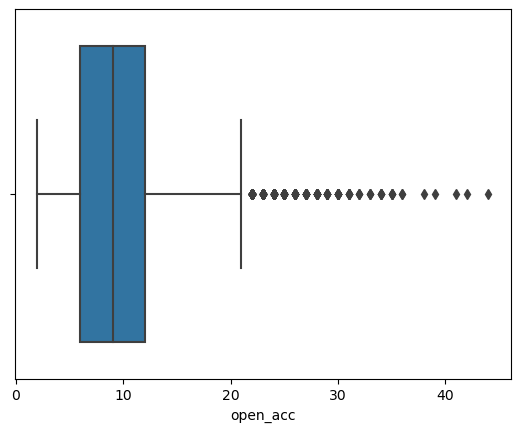

Median: 8674.00
q1: 3629.00
q3: 16631.75


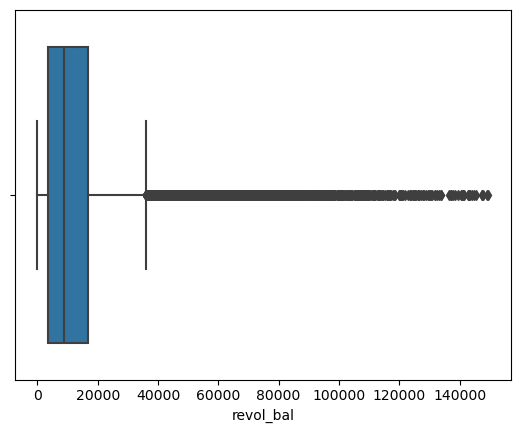

Median: 49.10
q1: 25.20
q3: 72.20


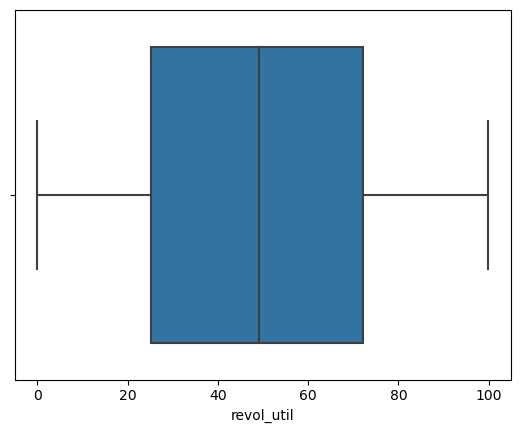

Median: 20.00
q1: 13.00
q3: 29.00


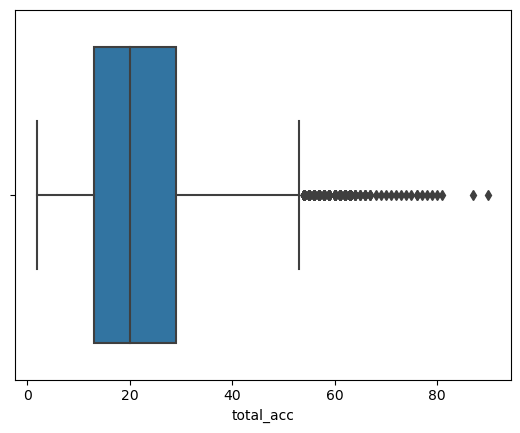

Median: 0.00
q1: 0.00
q3: 0.00


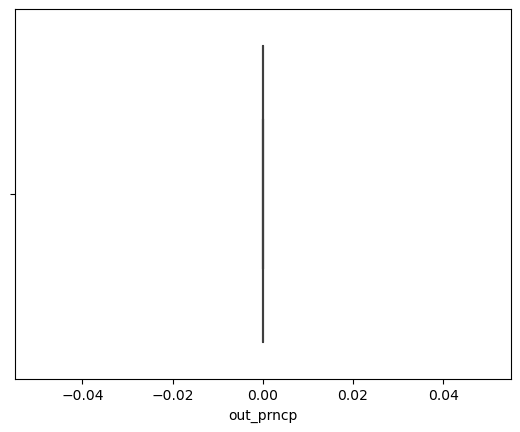

Median: 9557.57
q1: 5479.59
q3: 15842.46


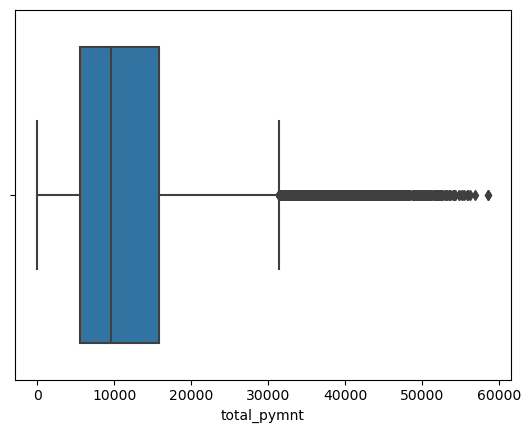

Median: 8000.00
q1: 4500.00
q3: 13000.00


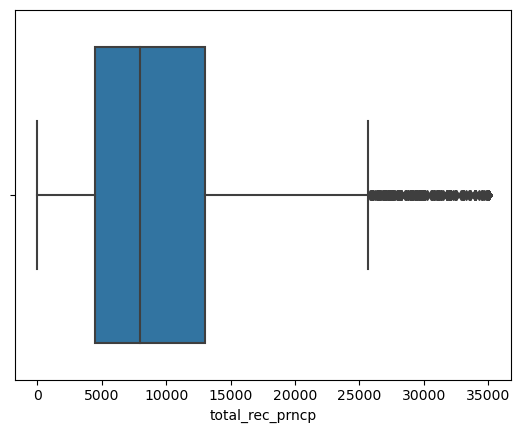

Median: 1284.57
q1: 638.34
q3: 2630.74


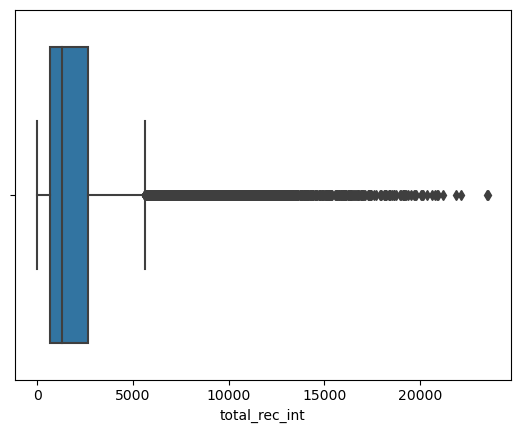

Median: 0.00
q1: 0.00
q3: 0.00


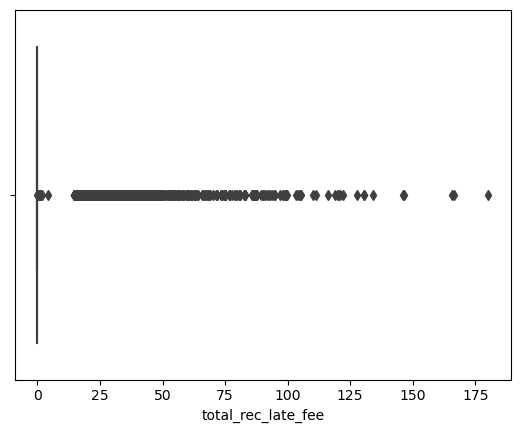

Median: 0.00
q1: 0.00
q3: 0.00


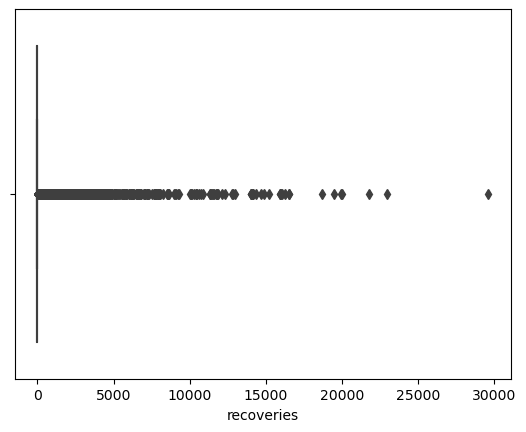

Median: 0.00
q1: 0.00
q3: 0.00


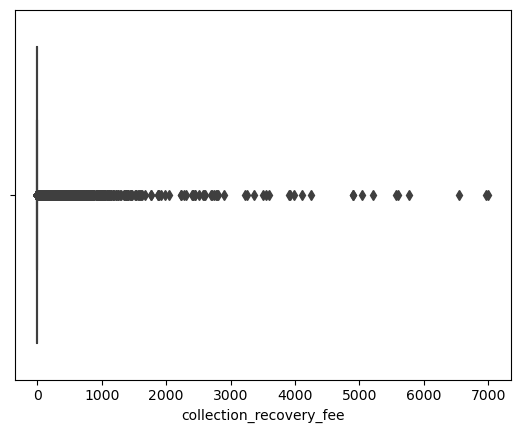

Median: 560.09
q1: 215.81
q3: 3391.65


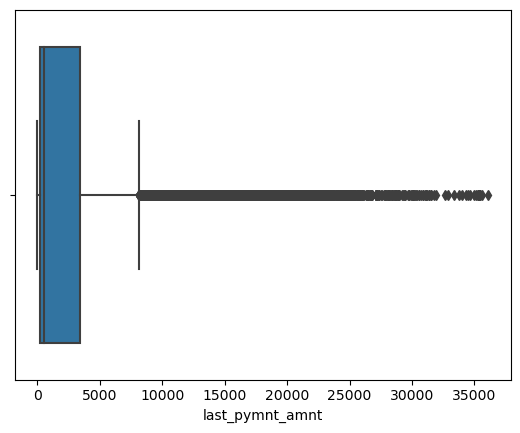

In [7]:
# univariate analysis of numerical columns
for col in num_cols:
    #sns.histplot(x=df[col])
    #plt.show()

    # Create boxplot
    sns.boxplot(data=df, x=col)

    # Calculate median and IQR
    median = df[col].median()
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    
    # Annotate plot with median and IQR values
    #plt.text(0, median + 0.5, f'Median: {median:.2f}\nq1: {q1:.2f}\nq3: {q3:.2f}', horizontalalignment='center', size='medium', color='black', weight='semibold')
    print(f'Median: {median:.2f}\nq1: {q1:.2f}\nq3: {q3:.2f}')
    plt.show()

In [8]:
# categorical columns
cat_cols = ['term', 'grade', 'sub_grade', 'emp_length', 'home_ownership', 'verification_status', 'loan_status', 'purpose', 
            'delinq_2yrs', 'inq_last_6mths', 'pub_rec', 'pub_rec_bankruptcies']

In [9]:
def perc_abv_bar_rel_to_x(ax):
    all_heights=[p.get_height() for p in ax.patches]
    #print('ht:', all_heights)
    for i, p in enumerate(ax.patches):
        #print('i=', i, "p=", p)
        total = sum(x for x in all_heights)
        print('tot=', total)
        perc = f'{(100 * p.get_height() / total) : .2f}%'
        ax.annotate(text=perc, xy=(p.get_x() + p.get_width() / 2, p.get_height()), size=11, ha='center', va='bottom')
        #print('----------------')

tot= 37820.0
tot= 37820.0


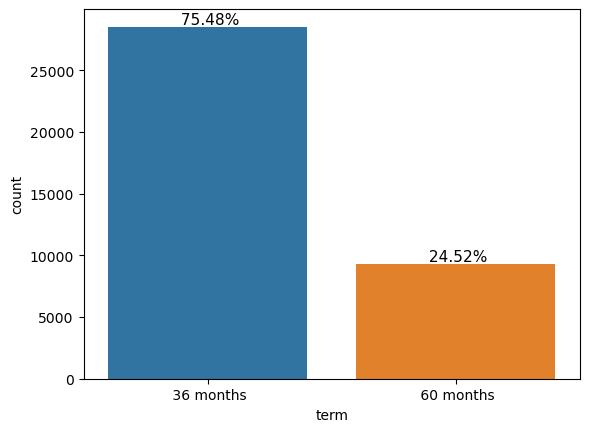

tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0


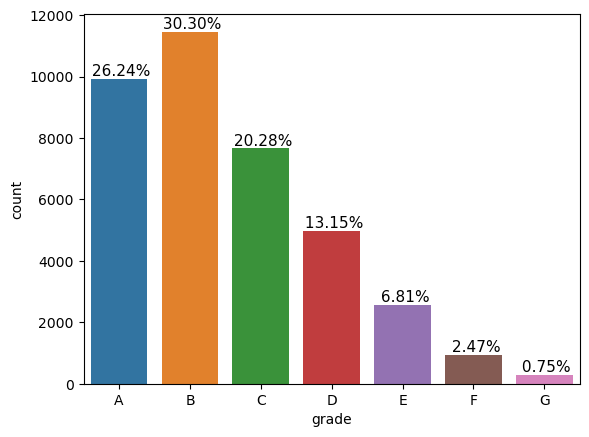

tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0


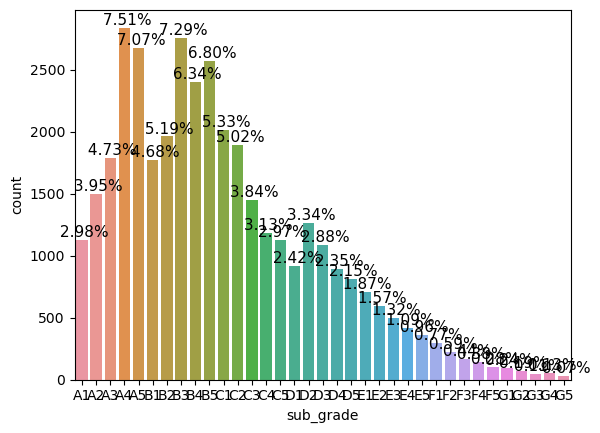

tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0


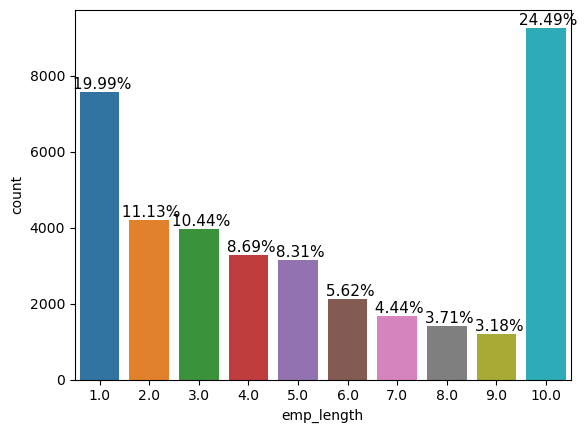

tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0


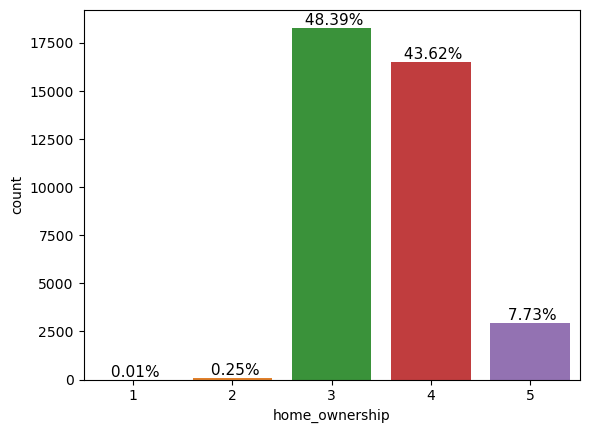

tot= 37820.0
tot= 37820.0
tot= 37820.0


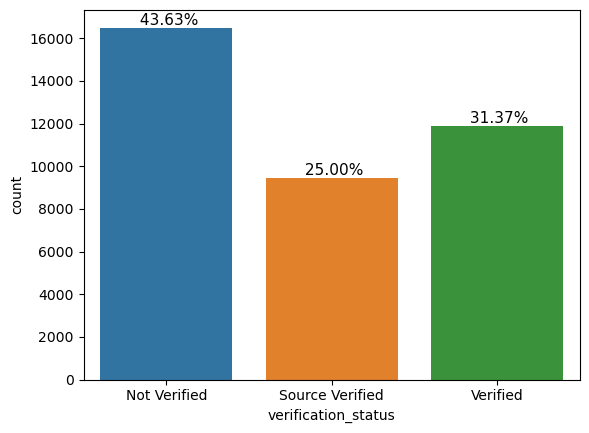

tot= 37820.0
tot= 37820.0


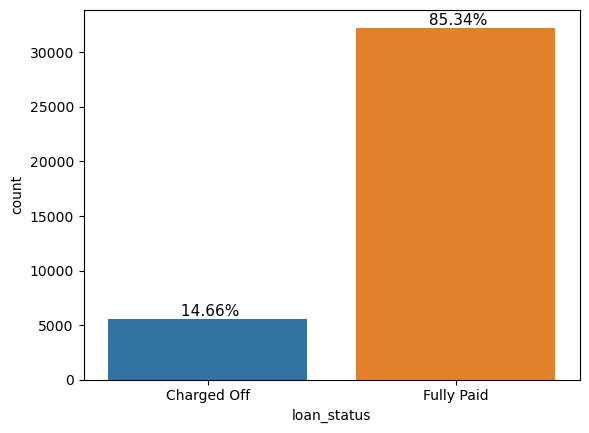

tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0


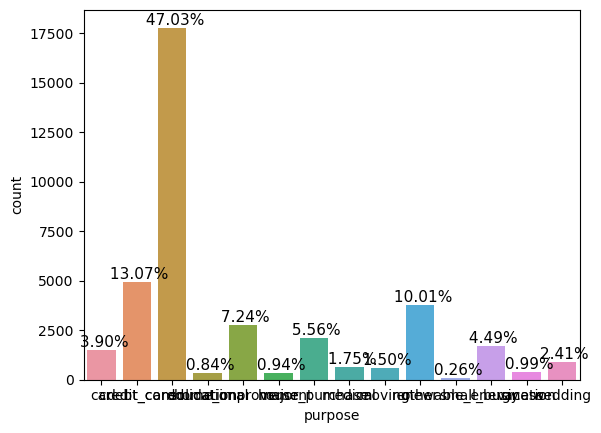

tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0


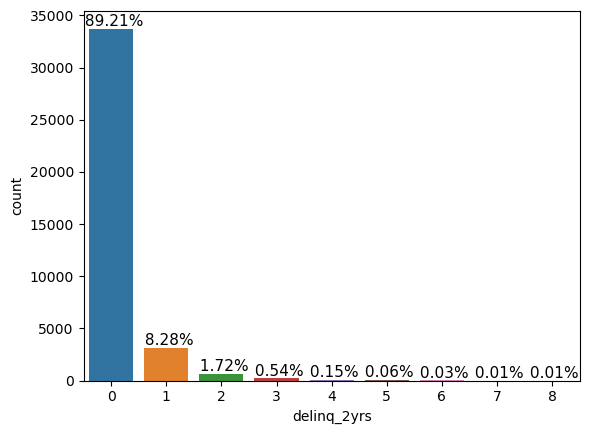

tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0
tot= 37820.0


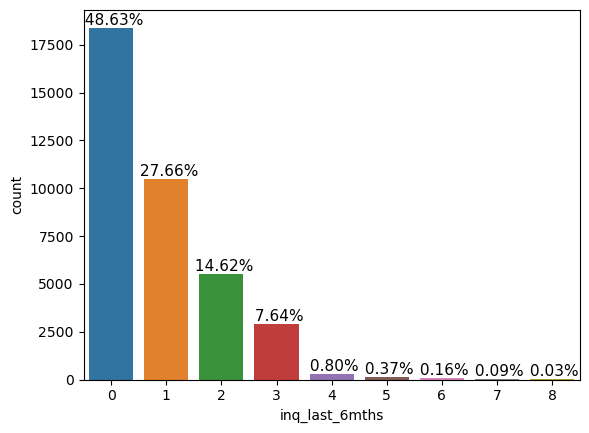

tot= 37820.0
tot= 37820.0


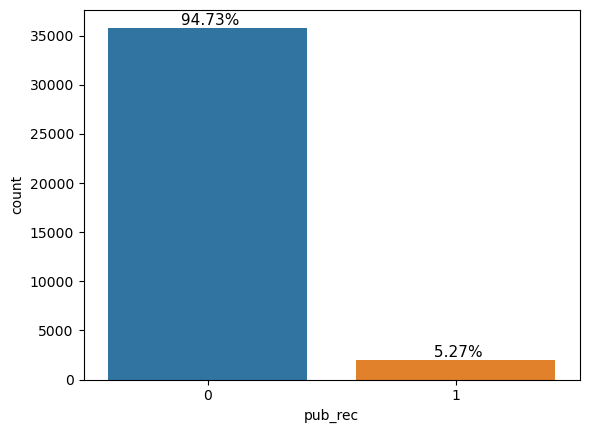

tot= 37146.0
tot= 37146.0


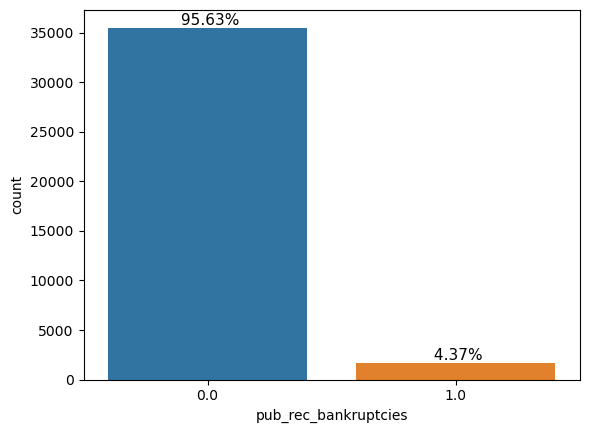

In [10]:
# univariate analysis of categorical columns in percentage terms
for col in cat_cols:
    df[col] = df[col].astype('category')
    #plt.figure(figsize=(22, 12))
    ax = sns.countplot(x=df[col])
    
    # Add count values on top of each bar
    perc_abv_bar_rel_to_x(ax)
    plt.show()

Median: 8000.00
q1: 5000.00
q3: 12000.00
Median: 14400.00
q1: 9000.00
q3: 20000.00


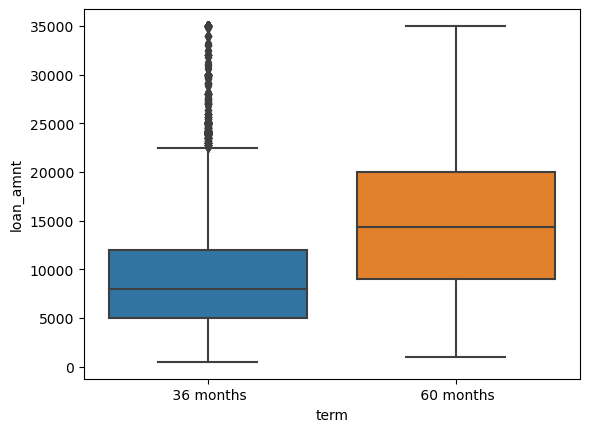

Median: 10.99
q1: 7.90
q3: 13.47
Median: 14.83
q1: 11.86
q3: 17.43


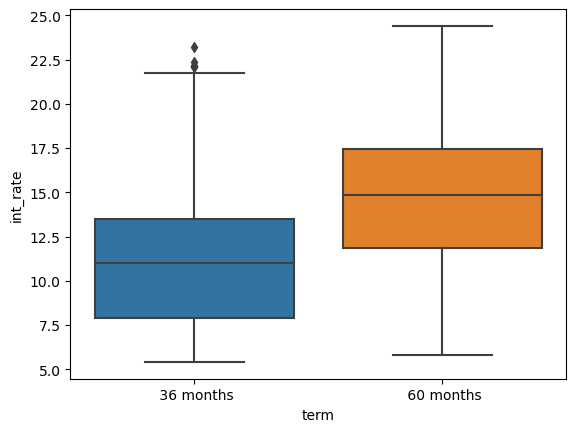

Median: 260.27
q1: 159.56
q3: 401.18
Median: 318.73
q1: 198.23
q3: 468.17


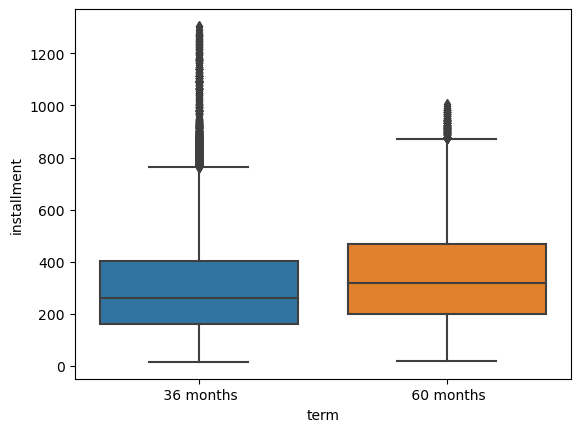

Median: 55560.00
q1: 39996.00
q3: 79588.50
Median: 61000.00
q1: 45000.00
q3: 85000.00


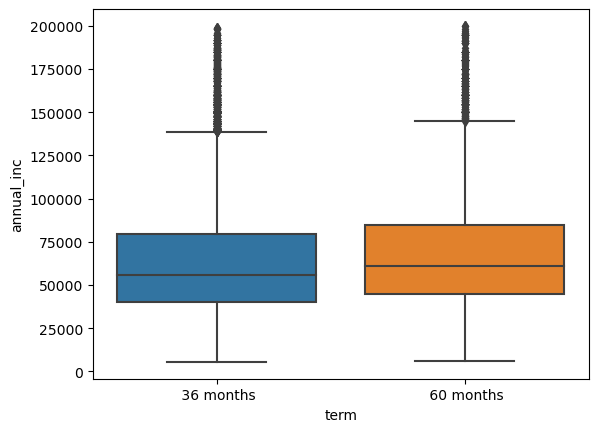

Median: 13.10
q1: 7.90
q3: 18.31
Median: 14.45
q1: 9.45
q3: 19.44


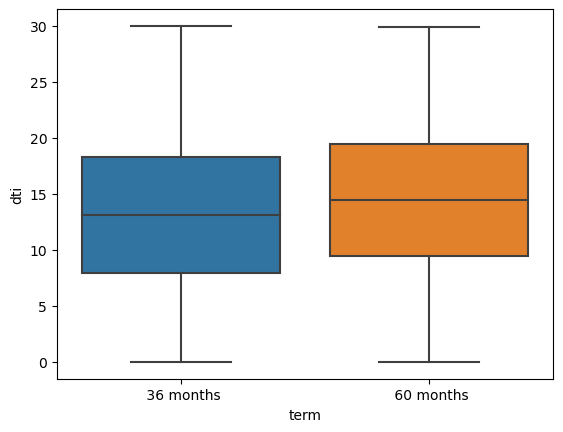

Median: 8.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00


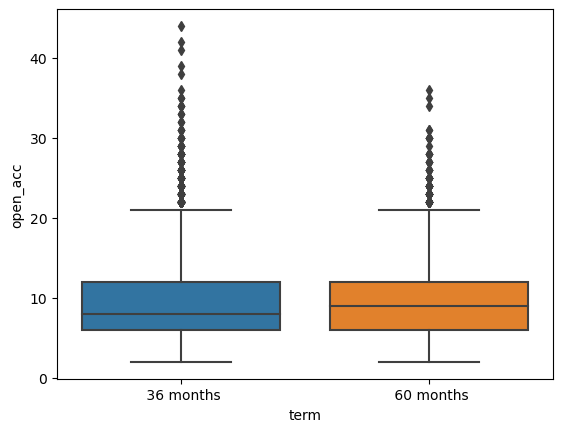

Median: 8138.00
q1: 3376.00
q3: 15692.50
Median: 10554.00
q1: 4604.00
q3: 19359.00


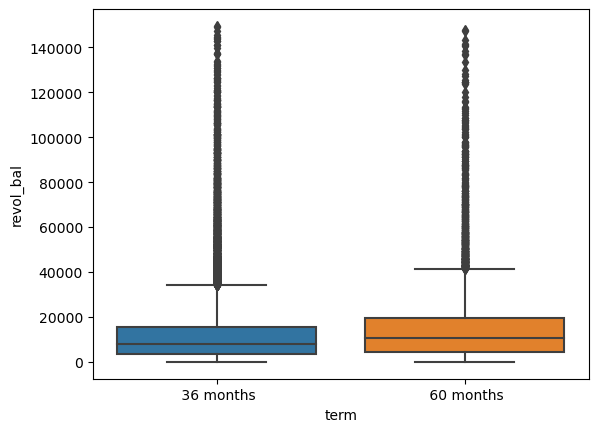

Median: 47.70
q1: 23.90
q3: 71.10
Median: 53.50
q1: 30.10
q3: 75.07


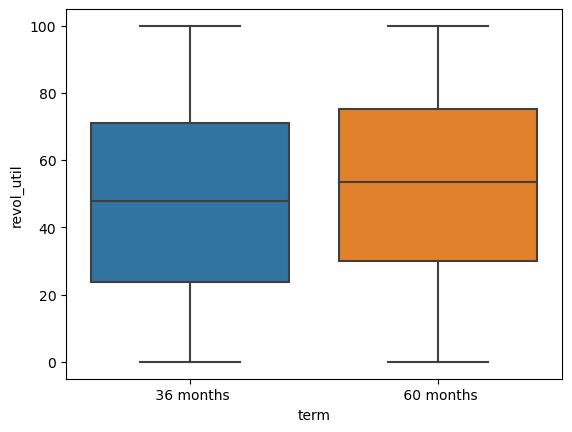

Median: 20.00
q1: 13.00
q3: 28.00
Median: 22.00
q1: 15.00
q3: 31.00


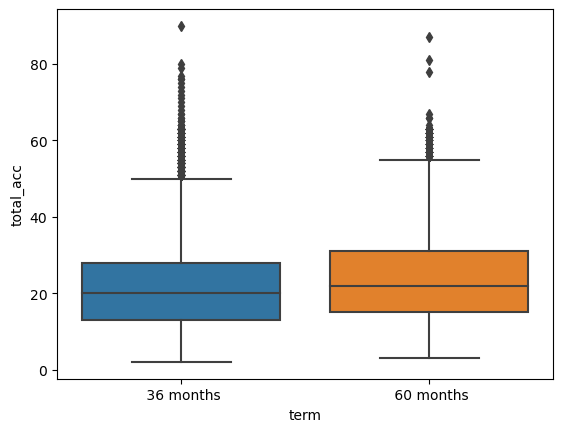

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


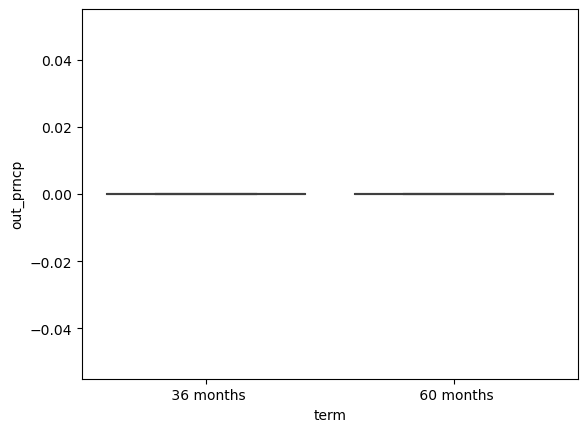

Median: 8499.73
q1: 5045.02
q3: 13517.36
Median: 14689.72
q1: 7701.24
q3: 22510.13


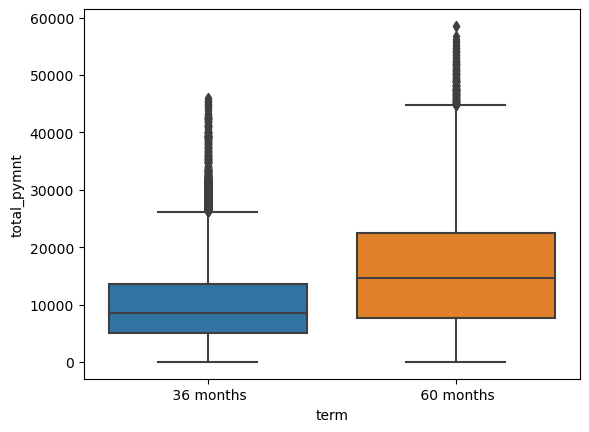

Median: 7245.81
q1: 4200.00
q3: 12000.00
Median: 10775.00
q1: 5000.00
q3: 16750.00


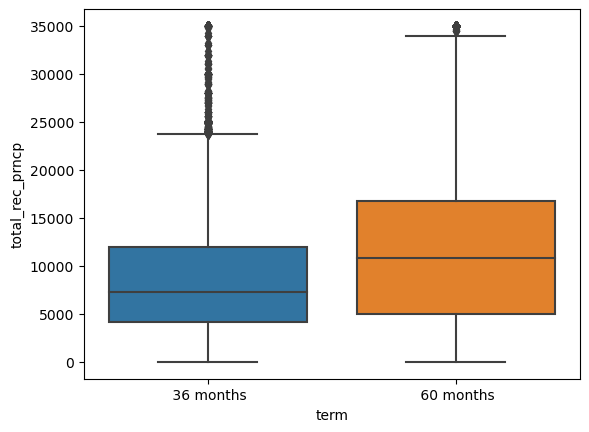

Median: 1027.47
q1: 541.43
q3: 1863.59
Median: 3294.25
q1: 1634.99
q3: 5762.71


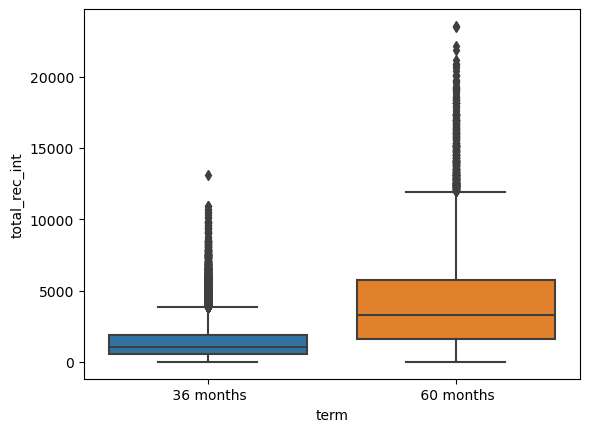

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


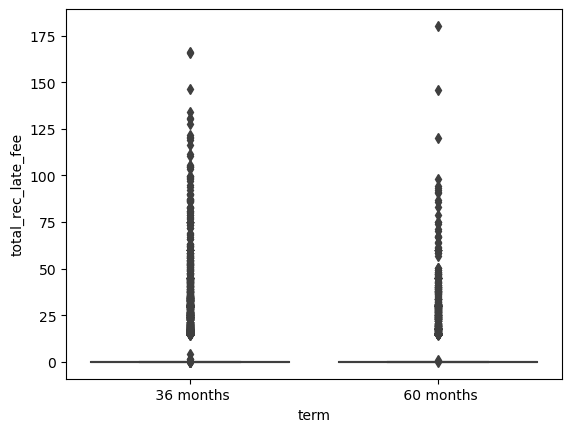

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


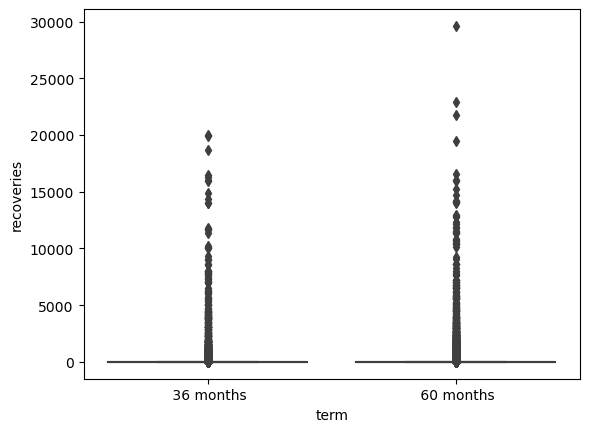

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


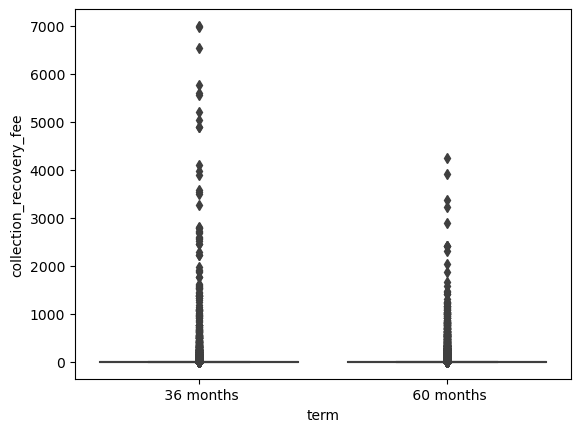

Median: 484.01
q1: 202.03
q3: 2440.18
Median: 1779.29
q1: 286.66
q3: 7604.68


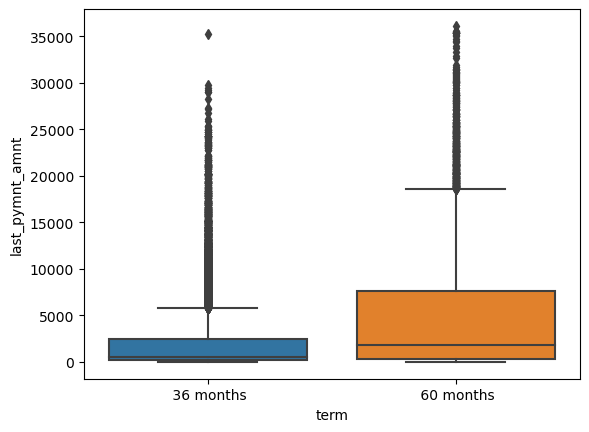

Median: 7500.00
q1: 5000.00
q3: 11000.00
Median: 9675.00
q1: 5000.00
q3: 15000.00
Median: 9300.00
q1: 5000.00
q3: 15000.00
Median: 10000.00
q1: 6000.00
q3: 16000.00
Median: 15000.00
q1: 8000.00
q3: 21000.00
Median: 18000.00
q1: 10400.00
q3: 25000.00
Median: 20000.00
q1: 14000.00
q3: 25000.00


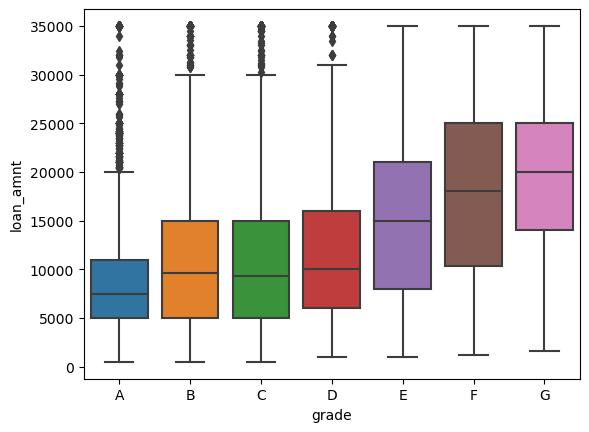

Median: 7.49
q1: 6.62
q3: 7.90
Median: 10.99
q1: 10.37
q3: 11.71
Median: 13.49
q1: 12.99
q3: 13.99
Median: 15.62
q1: 14.91
q3: 16.32
Median: 17.51
q1: 16.63
q3: 18.64
Median: 19.36
q1: 18.43
q3: 20.89
Median: 20.90
q1: 20.16
q3: 22.48


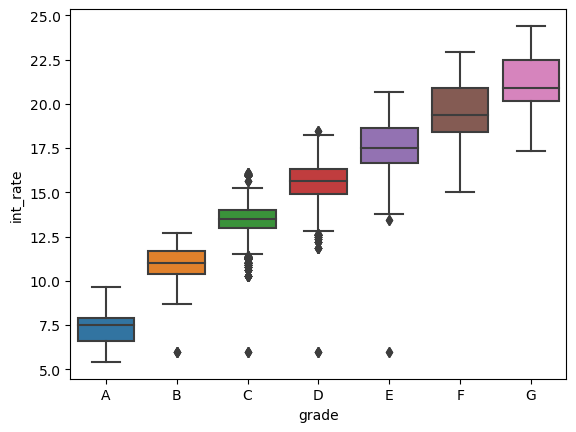

Median: 221.67
q1: 150.80
q3: 319.47
Median: 267.76
q1: 163.67
q3: 421.01
Median: 275.00
q1: 167.71
q3: 419.70
Median: 312.49
q1: 190.61
q3: 482.27
Median: 379.13
q1: 241.12
q3: 568.66
Median: 465.20
q1: 299.49
q3: 658.36
Median: 557.86
q1: 394.58
q3: 743.55


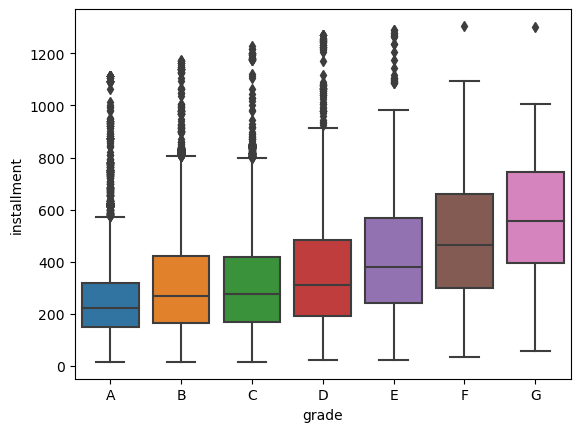

Median: 57000.00
q1: 40000.00
q3: 80000.00
Median: 56914.00
q1: 40000.00
q3: 80000.00
Median: 55000.00
q1: 39991.50
q3: 78500.00
Median: 57998.00
q1: 40000.00
q3: 80000.00
Median: 63000.00
q1: 45000.00
q3: 90000.00
Median: 70000.00
q1: 50004.00
q3: 96000.00
Median: 77004.00
q1: 55000.00
q3: 108000.00


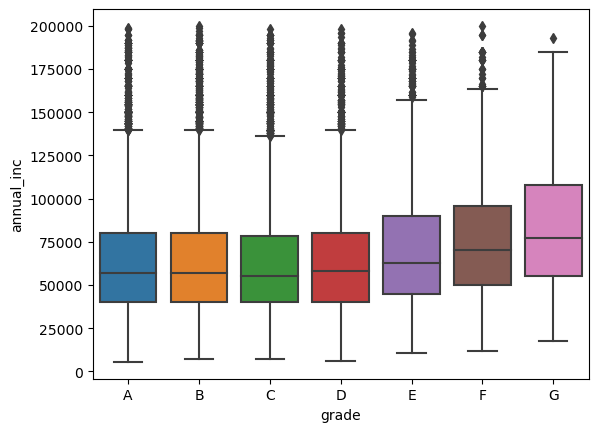

Median: 11.61
q1: 6.56
q3: 17.16
Median: 13.61
q1: 8.45
q3: 18.68
Median: 14.18
q1: 9.13
q3: 19.08
Median: 14.36
q1: 9.30
q3: 19.17
Median: 14.58
q1: 9.50
q3: 19.49
Median: 14.79
q1: 9.84
q3: 19.14
Median: 14.83
q1: 8.43
q3: 19.64


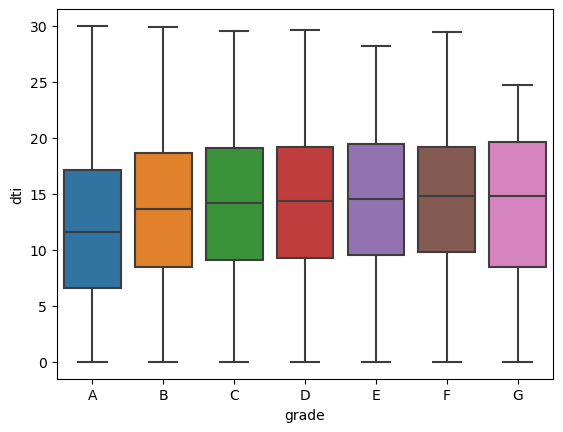

Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 13.00
Median: 9.00
q1: 5.00
q3: 13.00


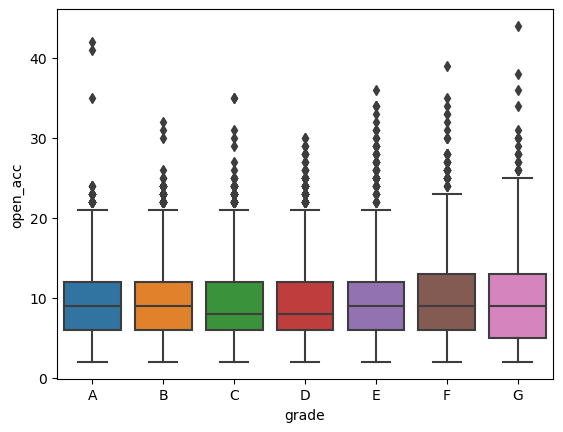

Median: 6737.00
q1: 2704.00
q3: 13727.50
Median: 8931.00
q1: 3794.00
q3: 16656.25
Median: 9106.50
q1: 3944.25
q3: 17171.00
Median: 9255.00
q1: 4305.00
q3: 17702.00
Median: 11442.00
q1: 5432.75
q3: 20942.25
Median: 12016.00
q1: 5642.50
q3: 21111.00
Median: 12958.00
q1: 6708.00
q3: 24109.00


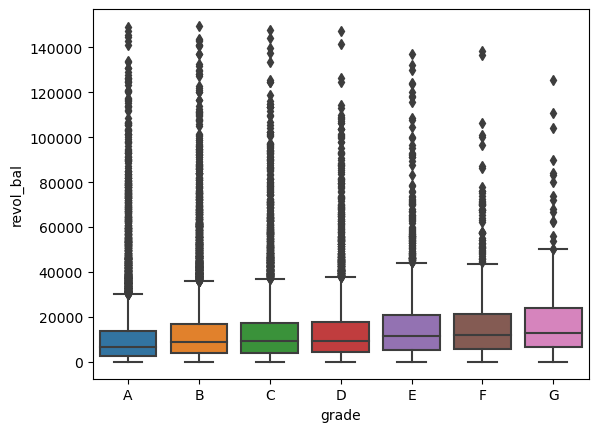

Median: 25.90
q1: 11.20
q3: 45.20
Median: 47.30
q1: 26.60
q3: 67.00
Median: 59.30
q1: 38.40
q3: 78.30
Median: 67.75
q1: 46.00
q3: 84.80
Median: 73.30
q1: 51.92
q3: 89.17
Median: 76.60
q1: 54.60
q3: 92.40
Median: 84.80
q1: 60.25
q3: 95.35


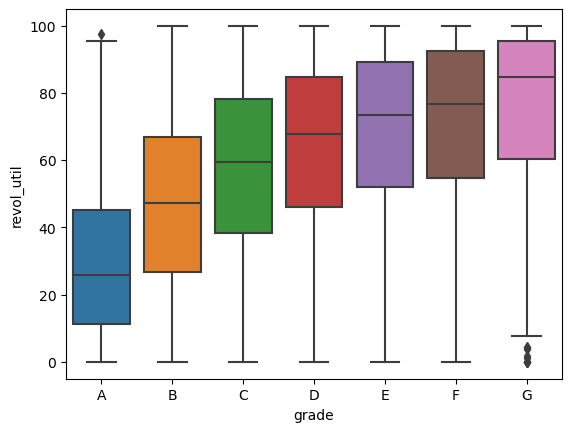

Median: 22.00
q1: 15.00
q3: 30.00
Median: 20.00
q1: 13.00
q3: 28.00
Median: 19.00
q1: 12.00
q3: 28.00
Median: 19.00
q1: 12.00
q3: 27.00
Median: 20.00
q1: 12.00
q3: 29.00
Median: 20.00
q1: 13.00
q3: 31.00
Median: 21.00
q1: 12.00
q3: 31.00


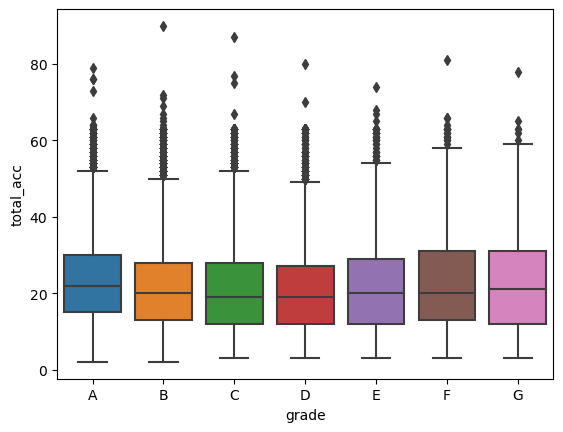

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


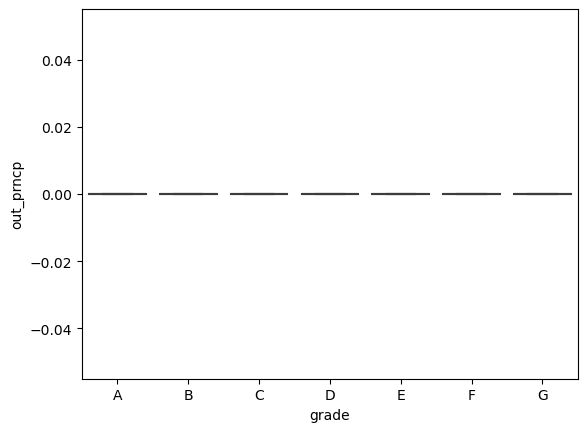

Median: 7839.33
q1: 5130.66
q3: 11379.76
Median: 9873.18
q1: 5623.73
q3: 16057.80
Median: 9582.04
q1: 5100.32
q3: 16405.06
Median: 11055.67
q1: 5946.76
q3: 18385.47
Median: 14840.49
q1: 7347.82
q3: 23716.99
Median: 17418.82
q1: 8454.40
q3: 28095.32
Median: 22521.96
q1: 9476.51
q3: 32863.39


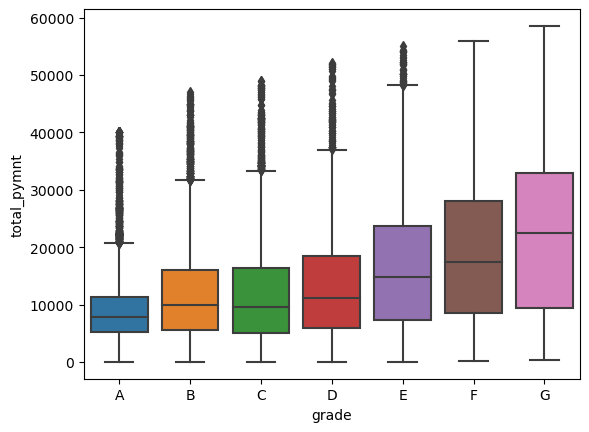

Median: 7000.00
q1: 4632.69
q3: 10000.00
Median: 8000.00
q1: 4800.00
q3: 13887.82
Median: 7750.07
q1: 4000.00
q3: 13000.00
Median: 8344.38
q1: 4150.00
q3: 14729.67
Median: 10000.00
q1: 4764.91
q3: 17957.31
Median: 11949.79
q1: 4439.26
q3: 20000.00
Median: 15000.00
q1: 4317.89
q3: 24000.00


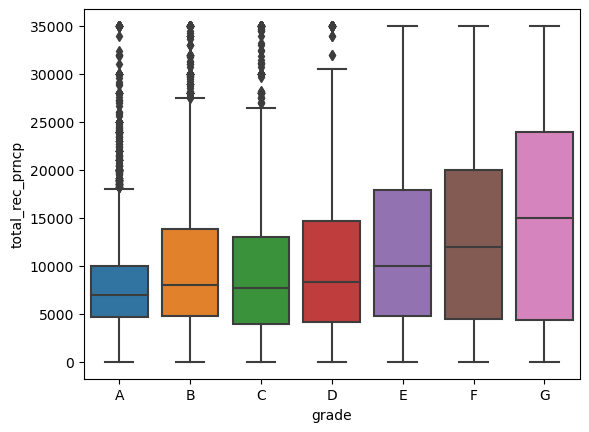

Median: 698.78
q1: 386.90
q3: 1114.09
Median: 1335.09
q1: 695.82
q3: 2376.78
Median: 1599.87
q1: 813.68
q3: 2974.02
Median: 2207.07
q1: 1134.61
q3: 4070.88
Median: 3609.84
q1: 1757.79
q3: 6329.45
Median: 5089.30
q1: 2347.63
q3: 8498.11
Median: 6043.31
q1: 3252.38
q3: 9786.91


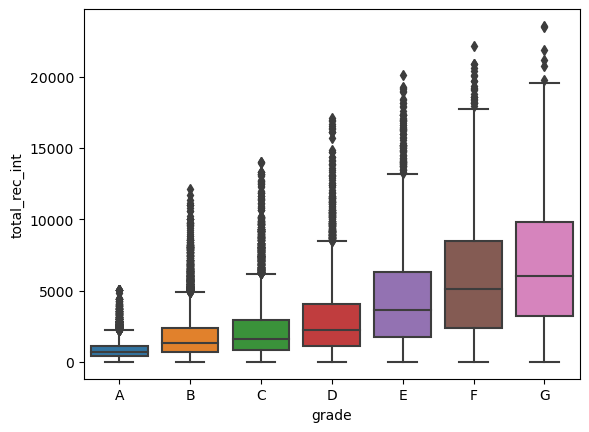

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


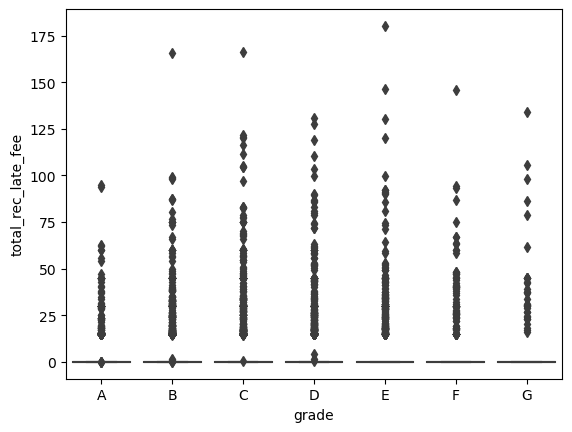

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 20.51
Median: 0.00
q1: 0.00
q3: 19.79


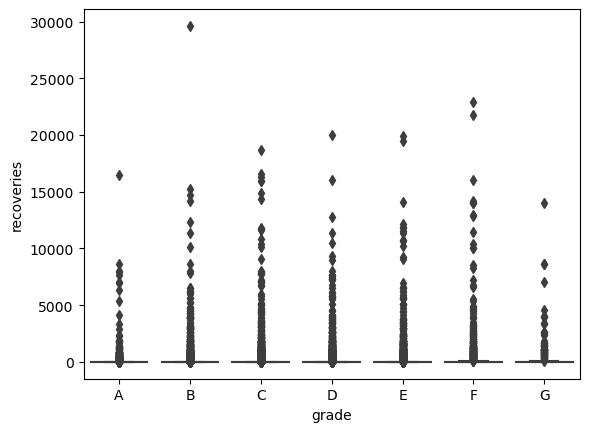

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 1.11
Median: 0.00
q1: 0.00
q3: 0.00


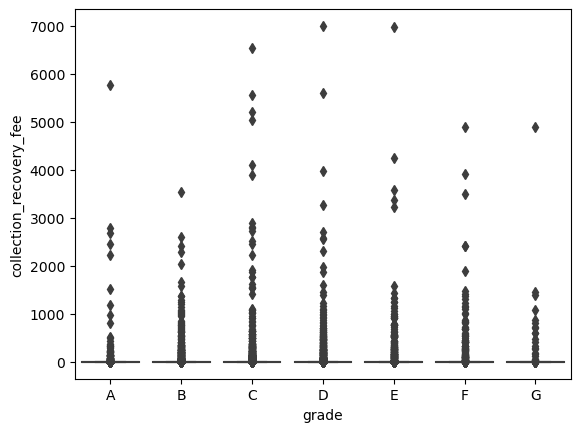

Median: 469.36
q1: 201.30
q3: 2618.59
Median: 577.49
q1: 221.74
q3: 3514.55
Median: 521.97
q1: 200.72
q3: 3281.62
Median: 563.38
q1: 222.01
q3: 3710.49
Median: 845.50
q1: 280.04
q3: 6378.74
Median: 914.81
q1: 351.65
q3: 7624.94
Median: 981.45
q1: 399.68
q3: 10334.90


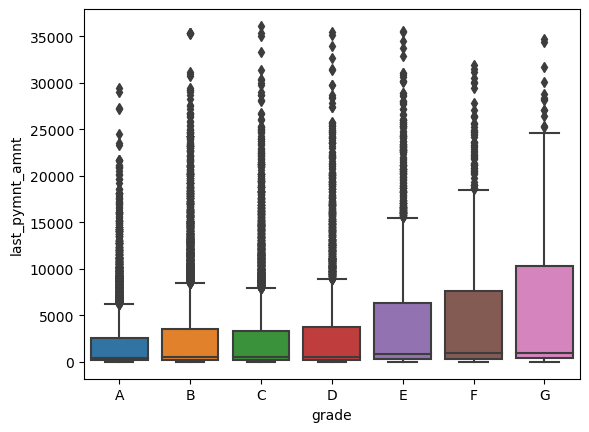

Median: 6000.00
q1: 4000.00
q3: 10000.00
Median: 6387.50
q1: 4000.00
q3: 10000.00
Median: 7000.00
q1: 5000.00
q3: 10000.00
Median: 8000.00
q1: 5000.00
q3: 12000.00
Median: 9000.00
q1: 5375.00
q3: 12125.00
Median: 8400.00
q1: 5000.00
q3: 13000.00
Median: 9000.00
q1: 5000.00
q3: 14400.00
Median: 10000.00
q1: 5500.00
q3: 15000.00
Median: 10000.00
q1: 5100.00
q3: 15000.00
Median: 10000.00
q1: 5500.00
q3: 15250.00
Median: 9375.00
q1: 5000.00
q3: 15000.00
Median: 9600.00
q1: 5500.00
q3: 15000.00
Median: 10000.00
q1: 5000.00
q3: 15000.00
Median: 9000.00
q1: 5000.00
q3: 15000.00
Median: 8000.00
q1: 5000.00
q3: 15000.00
Median: 8000.00
q1: 5000.00
q3: 13000.00
Median: 9925.00
q1: 6000.00
q3: 15000.00
Median: 11000.00
q1: 7000.00
q3: 16000.00
Median: 12000.00
q1: 7200.00
q3: 18000.00
Median: 13000.00
q1: 7500.00
q3: 19200.00
Median: 13500.00
q1: 7000.00
q3: 20000.00
Median: 14000.00
q1: 7837.50
q3: 20000.00
Median: 14500.00
q1: 8200.00
q3: 20000.00
Median: 15000.00
q1: 9600.00
q3: 24000.00
Media

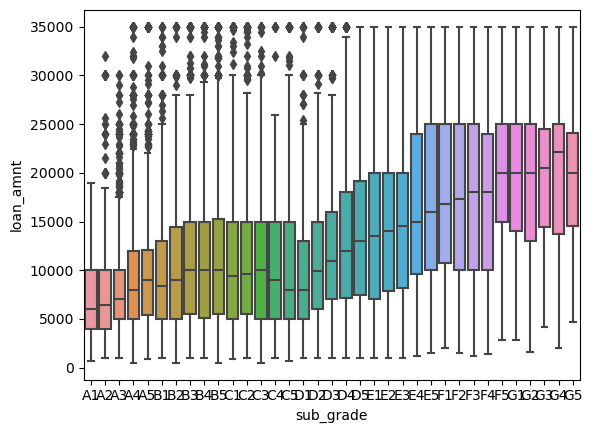

Median: 5.42
q1: 5.42
q3: 6.03
Median: 5.99
q1: 5.79
q3: 6.62
Median: 7.14
q1: 6.92
q3: 7.51
Median: 7.51
q1: 7.49
q3: 7.90
Median: 8.49
q1: 7.88
q3: 8.90
Median: 9.91
q1: 9.88
q3: 10.38
Median: 10.59
q1: 10.25
q3: 10.75
Median: 10.99
q1: 10.37
q3: 11.71
Median: 11.49
q1: 10.74
q3: 12.12
Median: 11.86
q1: 11.11
q3: 12.21
Median: 12.99
q1: 12.68
q3: 13.23
Median: 13.49
q1: 13.06
q3: 13.61
Median: 13.57
q1: 13.43
q3: 13.99
Median: 13.92
q1: 13.47
q3: 14.79
Median: 14.26
q1: 13.79
q3: 15.23
Median: 14.61
q1: 14.54
q3: 15.62
Median: 15.21
q1: 14.91
q3: 15.99
Median: 15.58
q1: 15.28
q3: 16.49
Median: 15.95
q1: 15.65
q3: 16.89
Median: 16.32
q1: 16.02
q3: 17.49
Median: 16.45
q1: 16.40
q3: 17.99
Median: 16.82
q1: 16.77
q3: 18.39
Median: 17.19
q1: 17.14
q3: 18.79
Median: 17.56
q1: 17.51
q3: 19.29
Median: 17.93
q1: 17.88
q3: 19.69
Median: 18.30
q1: 18.25
q3: 20.25
Median: 18.67
q1: 18.62
q3: 20.62
Median: 19.04
q1: 18.99
q3: 20.99
Median: 19.41
q1: 19.36
q3: 21.36
Median: 19.79
q1: 19.74
q3: 21.

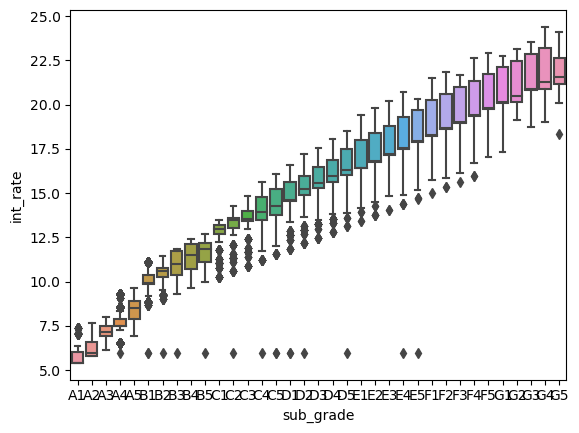

Median: 182.62
q1: 120.64
q3: 304.36
Median: 187.15
q1: 123.07
q3: 297.42
Median: 211.94
q1: 152.50
q3: 308.41
Median: 248.08
q1: 155.55
q3: 342.21
Median: 250.25
q1: 158.77
q3: 375.38
Median: 257.22
q1: 161.13
q3: 389.36
Median: 260.06
q1: 162.20
q3: 421.01
Median: 278.59
q1: 163.67
q3: 437.73
Median: 267.33
q1: 164.86
q3: 409.81
Median: 283.36
q1: 167.28
q3: 421.90
Median: 271.45
q1: 167.84
q3: 407.17
Median: 276.06
q1: 169.01
q3: 440.54
Median: 283.28
q1: 168.86
q3: 413.94
Median: 274.79
q1: 162.60
q3: 443.67
Median: 267.53
q1: 166.80
q3: 414.35
Median: 276.70
q1: 171.15
q3: 443.85
Median: 284.92
q1: 187.98
q3: 426.47
Median: 316.23
q1: 198.59
q3: 465.24
Median: 349.86
q1: 208.68
q3: 509.95
Median: 351.67
q1: 202.36
q3: 510.60
Median: 367.97
q1: 212.28
q3: 542.22
Median: 363.49
q1: 213.24
q3: 544.09
Median: 370.30
q1: 246.87
q3: 566.00
Median: 396.66
q1: 249.20
q3: 610.01
Median: 424.71
q1: 294.58
q3: 639.87
Median: 426.14
q1: 302.31
q3: 638.25
Median: 453.02
q1: 277.80
q3: 643.30
M

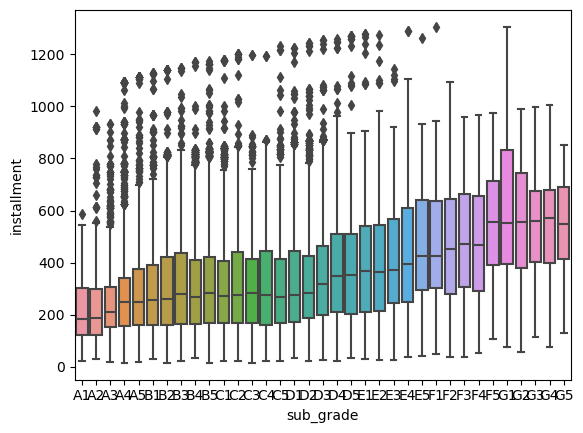

Median: 60000.00
q1: 42000.00
q3: 80000.00
Median: 57000.00
q1: 40029.03
q3: 80000.00
Median: 55000.00
q1: 40000.00
q3: 77000.00
Median: 57006.00
q1: 40000.00
q3: 78200.00
Median: 57600.00
q1: 40000.00
q3: 80000.00
Median: 54586.00
q1: 38160.00
q3: 75000.00
Median: 55000.00
q1: 39905.25
q3: 80000.00
Median: 57797.00
q1: 40000.00
q3: 80000.00
Median: 60000.00
q1: 40000.00
q3: 80004.00
Median: 57000.00
q1: 40000.00
q3: 79000.00
Median: 55000.00
q1: 40000.00
q3: 80000.00
Median: 55493.00
q1: 39996.00
q3: 79200.00
Median: 55000.00
q1: 40000.00
q3: 76361.00
Median: 55000.00
q1: 39440.00
q3: 79112.50
Median: 53960.00
q1: 37725.00
q3: 77326.00
Median: 55000.00
q1: 38000.00
q3: 75300.00
Median: 58950.00
q1: 40034.50
q3: 82425.00
Median: 55200.00
q1: 40000.00
q3: 78000.00
Median: 60000.00
q1: 42000.00
q3: 80000.00
Median: 60000.00
q1: 42000.00
q3: 85000.00
Median: 60000.00
q1: 43000.00
q3: 83775.00
Median: 62000.00
q1: 43850.00
q3: 87000.00
Median: 60000.00
q1: 45000.00
q3: 88600.00
Median: 650

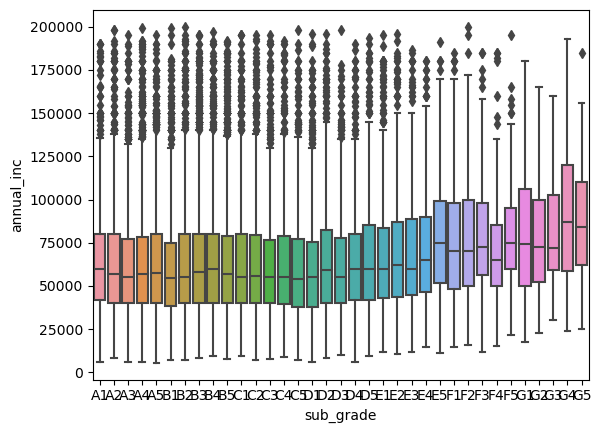

Median: 10.08
q1: 5.34
q3: 15.36
Median: 10.76
q1: 5.79
q3: 16.87
Median: 11.47
q1: 6.37
q3: 17.12
Median: 12.00
q1: 7.00
q3: 17.44
Median: 12.51
q1: 7.52
q3: 17.83
Median: 12.80
q1: 7.80
q3: 18.00
Median: 13.33
q1: 7.96
q3: 18.58
Median: 13.77
q1: 8.68
q3: 18.49
Median: 13.98
q1: 8.79
q3: 18.98
Median: 13.97
q1: 8.87
q3: 19.02
Median: 14.23
q1: 8.96
q3: 18.97
Median: 14.05
q1: 9.02
q3: 18.99
Median: 14.03
q1: 8.78
q3: 18.86
Median: 14.34
q1: 9.84
q3: 19.23
Median: 14.36
q1: 9.19
q3: 19.53
Median: 14.24
q1: 8.84
q3: 19.02
Median: 14.25
q1: 9.59
q3: 19.49
Median: 14.46
q1: 9.32
q3: 19.28
Median: 14.46
q1: 9.33
q3: 19.07
Median: 14.15
q1: 9.25
q3: 18.90
Median: 14.30
q1: 9.46
q3: 19.66
Median: 14.81
q1: 9.76
q3: 19.29
Median: 14.23
q1: 8.68
q3: 19.25
Median: 14.70
q1: 9.52
q3: 19.49
Median: 15.04
q1: 10.09
q3: 19.63
Median: 14.57
q1: 9.31
q3: 18.65
Median: 15.06
q1: 9.18
q3: 18.87
Median: 15.14
q1: 10.64
q3: 19.15
Median: 14.91
q1: 10.42
q3: 19.81
Median: 14.66
q1: 10.73
q3: 19.73
Median

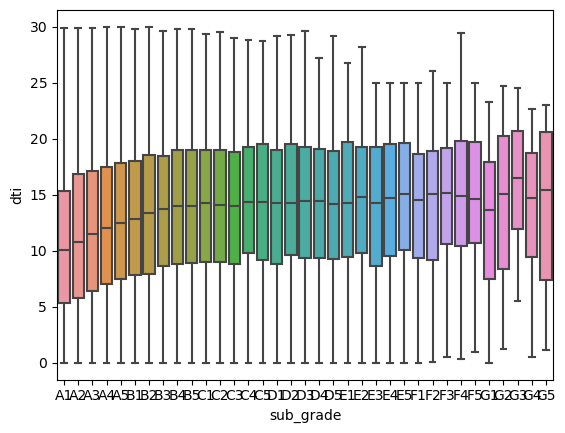

Median: 9.00
q1: 7.00
q3: 12.00
Median: 9.00
q1: 7.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 6.00
q3: 11.00
Median: 8.00
q1: 6.00
q3: 11.00
Median: 8.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 6.00
q3: 11.00
Median: 8.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 6.00
q3: 11.00
Median: 8.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 5.00
q3: 11.00
Median: 8.00
q1: 5.00
q3: 12.00
Median: 8.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 5.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 5.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 13.00
Median: 9.00
q1: 6.00
q3: 13.00
Median: 9.00
q1: 6.00
q3: 13.00
Median: 9.00
q1: 5.50
q3: 12.00
Median: 9.00
q1: 5.00
q3: 12.00
Median: 9.00
q1: 5.00
q3: 13.00
Median: 9.00
q1: 5.00
q3: 13.00
Median: 

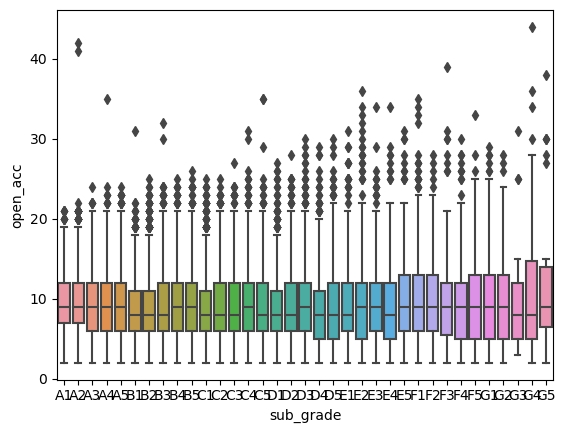

Median: 5135.00
q1: 2344.50
q3: 11390.00
Median: 5273.50
q1: 1988.75
q3: 11302.50
Median: 6288.00
q1: 2357.00
q3: 12818.00
Median: 7349.00
q1: 2979.00
q3: 14664.00
Median: 8291.00
q1: 3376.00
q3: 15746.00
Median: 8543.00
q1: 3414.00
q3: 14909.00
Median: 8317.00
q1: 3545.50
q3: 16010.75
Median: 8861.00
q1: 3680.00
q3: 16525.75
Median: 9479.00
q1: 4143.50
q3: 17412.50
Median: 9479.50
q1: 4218.00
q3: 17941.00
Median: 9294.50
q1: 4209.50
q3: 17151.25
Median: 9219.00
q1: 3972.00
q3: 17354.00
Median: 8989.00
q1: 3840.00
q3: 16772.00
Median: 9284.50
q1: 3918.25
q3: 17248.00
Median: 8412.00
q1: 3531.50
q3: 17388.75
Median: 8099.00
q1: 3815.50
q3: 16377.50
Median: 9177.50
q1: 4278.25
q3: 17667.75
Median: 9254.00
q1: 4612.00
q3: 17816.00
Median: 9599.50
q1: 4241.75
q3: 18110.75
Median: 10369.00
q1: 4814.00
q3: 18645.50
Median: 10628.50
q1: 4983.25
q3: 18800.75
Median: 10978.00
q1: 4883.00
q3: 20177.00
Median: 11183.50
q1: 5791.00
q3: 21720.25
Median: 11914.00
q1: 5287.75
q3: 21866.25
Median: 138

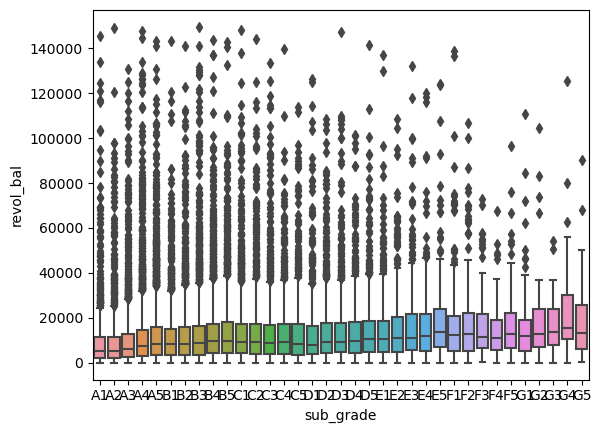

Median: 15.60
q1: 7.70
q3: 27.30
Median: 17.20
q1: 7.60
q3: 33.10
Median: 22.80
q1: 9.40
q3: 40.10
Median: 31.20
q1: 14.70
q3: 49.90
Median: 34.70
q1: 17.40
q3: 54.10
Median: 40.60
q1: 22.00
q3: 61.10
Median: 43.10
q1: 23.80
q3: 62.50
Median: 47.60
q1: 26.60
q3: 67.70
Median: 48.10
q1: 27.20
q3: 68.40
Median: 53.40
q1: 32.27
q3: 72.00
Median: 57.45
q1: 37.60
q3: 77.10
Median: 59.60
q1: 39.10
q3: 78.80
Median: 56.80
q1: 34.80
q3: 77.00
Median: 61.50
q1: 40.90
q3: 78.90
Median: 64.10
q1: 42.00
q3: 80.50
Median: 69.00
q1: 47.35
q3: 85.45
Median: 67.70
q1: 45.00
q3: 84.30
Median: 65.60
q1: 47.12
q3: 82.50
Median: 69.05
q1: 46.27
q3: 85.20
Median: 67.10
q1: 44.88
q3: 86.00
Median: 70.10
q1: 51.12
q3: 86.88
Median: 73.35
q1: 49.48
q3: 88.95
Median: 75.20
q1: 53.75
q3: 90.35
Median: 73.45
q1: 52.30
q3: 89.50
Median: 75.60
q1: 54.55
q3: 89.60
Median: 73.05
q1: 52.80
q3: 88.78
Median: 78.80
q1: 55.60
q3: 92.65
Median: 79.20
q1: 52.15
q3: 93.85
Median: 76.95
q1: 54.20
q3: 94.28
Median: 81.00
q1:

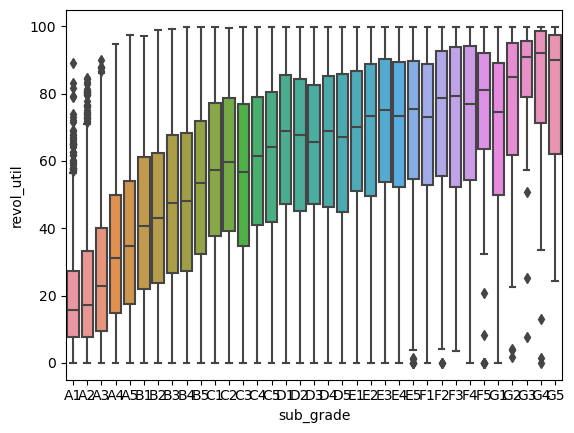

Median: 24.00
q1: 18.00
q3: 31.00
Median: 23.00
q1: 16.25
q3: 31.00
Median: 22.00
q1: 15.00
q3: 29.00
Median: 21.00
q1: 14.00
q3: 29.00
Median: 21.00
q1: 14.00
q3: 29.00
Median: 20.00
q1: 14.00
q3: 28.00
Median: 19.00
q1: 13.00
q3: 28.00
Median: 20.00
q1: 13.00
q3: 28.00
Median: 21.00
q1: 14.00
q3: 29.00
Median: 20.00
q1: 13.00
q3: 28.00
Median: 19.00
q1: 13.00
q3: 27.00
Median: 20.00
q1: 12.00
q3: 28.00
Median: 19.00
q1: 13.00
q3: 28.00
Median: 19.00
q1: 12.00
q3: 28.00
Median: 18.00
q1: 12.00
q3: 27.00
Median: 17.00
q1: 11.00
q3: 26.00
Median: 19.00
q1: 12.00
q3: 27.00
Median: 18.00
q1: 12.00
q3: 27.00
Median: 19.00
q1: 12.00
q3: 27.00
Median: 20.00
q1: 12.00
q3: 29.00
Median: 19.00
q1: 12.00
q3: 28.00
Median: 19.00
q1: 12.00
q3: 29.00
Median: 20.00
q1: 12.00
q3: 29.00
Median: 21.00
q1: 13.00
q3: 30.00
Median: 22.00
q1: 14.00
q3: 32.00
Median: 20.00
q1: 13.00
q3: 30.00
Median: 21.00
q1: 12.00
q3: 31.00
Median: 22.00
q1: 14.00
q3: 31.00
Median: 21.00
q1: 12.00
q3: 33.00
Median: 20.00


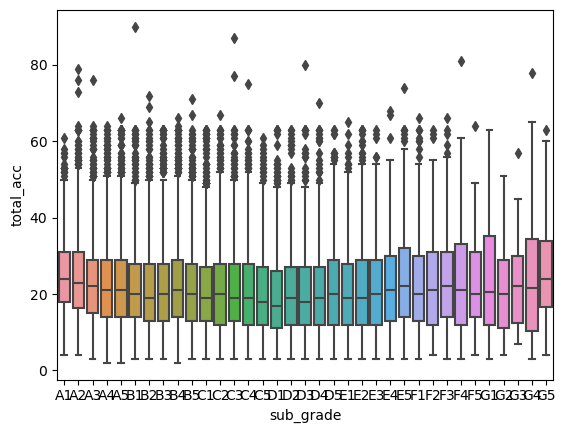

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 

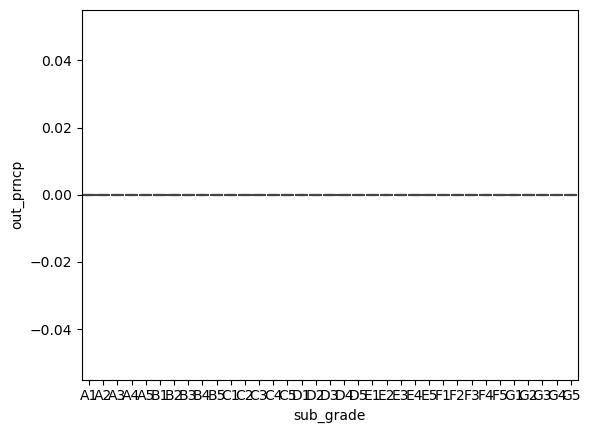

Median: 6515.13
q1: 4287.22
q3: 10857.53
Median: 6631.96
q1: 4350.65
q3: 10331.86
Median: 7305.36
q1: 5235.65
q3: 10655.02
Median: 8479.67
q1: 5472.57
q3: 12210.11
Median: 8981.03
q1: 5630.93
q3: 13470.84
Median: 9242.95
q1: 5664.34
q3: 14017.72
Median: 9326.15
q1: 5508.12
q3: 15152.79
Median: 10265.55
q1: 5605.56
q3: 16773.26
Median: 10220.36
q1: 5628.21
q3: 16495.62
Median: 10137.68
q1: 5712.59
q3: 17467.92
Median: 9578.00
q1: 5421.50
q3: 16395.59
Median: 9816.99
q1: 5428.37
q3: 16939.19
Median: 9841.69
q1: 5100.22
q3: 16343.60
Median: 9094.16
q1: 4886.17
q3: 16367.23
Median: 8838.39
q1: 4859.80
q3: 15245.08
Median: 8653.73
q1: 4895.44
q3: 14531.00
Median: 10177.46
q1: 5725.79
q3: 17264.59
Median: 11935.81
q1: 6445.26
q3: 17885.55
Median: 12648.22
q1: 6040.63
q3: 19681.75
Median: 12914.88
q1: 6615.17
q3: 21521.24
Median: 13648.82
q1: 7231.81
q3: 21382.95
Median: 14478.13
q1: 7119.71
q3: 23048.98
Median: 14654.63
q1: 7480.34
q3: 23545.21
Median: 15961.60
q1: 7151.56
q3: 24740.98
Media

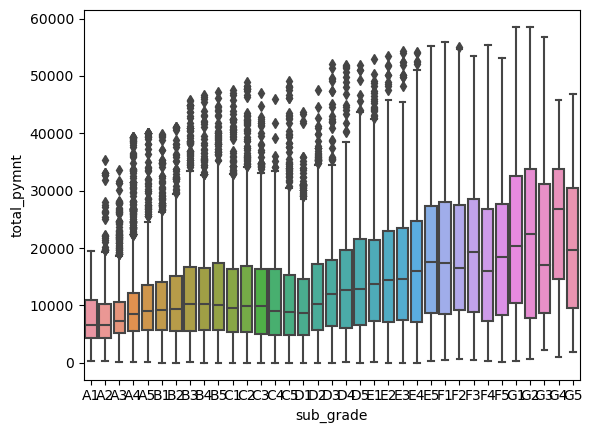

Median: 6000.00
q1: 4000.00
q3: 10000.00
Median: 6000.00
q1: 4000.00
q3: 9600.00
Median: 6600.00
q1: 4800.00
q3: 10000.00
Median: 7750.00
q1: 5000.00
q3: 11000.00
Median: 8000.00
q1: 5000.00
q3: 12000.00
Median: 8000.00
q1: 5000.00
q3: 12000.00
Median: 8000.00
q1: 4750.00
q3: 13000.00
Median: 8500.00
q1: 4800.00
q3: 14400.00
Median: 8400.00
q1: 4750.00
q3: 13999.99
Median: 8400.00
q1: 4800.00
q3: 14806.25
Median: 8000.00
q1: 4191.18
q3: 13500.00
Median: 8000.00
q1: 4000.00
q3: 14000.00
Median: 8000.00
q1: 4000.00
q3: 12500.00
Median: 7200.00
q1: 3836.52
q3: 13000.00
Median: 7000.00
q1: 3600.00
q3: 12000.00
Median: 7000.00
q1: 4000.00
q3: 12000.00
Median: 8000.00
q1: 4095.97
q3: 14000.00
Median: 9000.00
q1: 4750.00
q3: 14000.00
Median: 10000.00
q1: 4000.00
q3: 15000.00
Median: 9965.04
q1: 4574.58
q3: 15675.00
Median: 10000.00
q1: 4649.36
q3: 16000.00
Median: 10000.00
q1: 4498.40
q3: 17000.00
Median: 10000.00
q1: 5000.00
q3: 18000.00
Median: 11274.83
q1: 4266.38
q3: 18243.75
Median: 1200

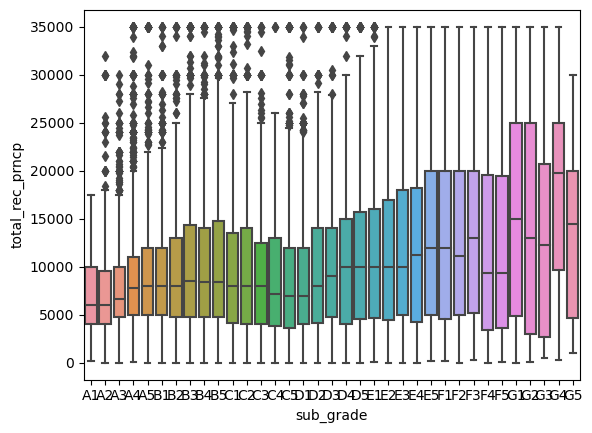

Median: 471.64
q1: 275.11
q3: 777.82
Median: 531.36
q1: 292.31
q3: 816.20
Median: 637.66
q1: 390.46
q3: 967.91
Median: 779.20
q1: 455.34
q3: 1207.52
Median: 895.65
q1: 511.84
q3: 1437.69
Median: 1109.64
q1: 609.76
q3: 1849.55
Median: 1179.38
q1: 642.91
q3: 2075.39
Median: 1377.47
q1: 698.65
q3: 2472.80
Median: 1433.96
q1: 733.70
q3: 2636.85
Median: 1526.97
q1: 781.91
q3: 2788.59
Median: 1502.47
q1: 833.90
q3: 2935.71
Median: 1682.25
q1: 850.29
q3: 3071.76
Median: 1684.66
q1: 812.76
q3: 2979.73
Median: 1516.27
q1: 765.92
q3: 2895.46
Median: 1587.01
q1: 778.29
q3: 2930.64
Median: 1473.82
q1: 847.71
q3: 2600.04
Median: 2012.03
q1: 1117.94
q3: 3699.57
Median: 2469.37
q1: 1243.46
q3: 4201.64
Median: 2641.33
q1: 1281.18
q3: 4777.15
Median: 2900.31
q1: 1428.49
q3: 5323.66
Median: 2963.10
q1: 1564.44
q3: 5320.84
Median: 3489.35
q1: 1506.74
q3: 6206.12
Median: 3862.43
q1: 1987.92
q3: 6292.85
Median: 4031.24
q1: 2004.37
q3: 6757.61
Median: 4725.20
q1: 2292.36
q3: 7805.16
Median: 4997.97
q1: 2319

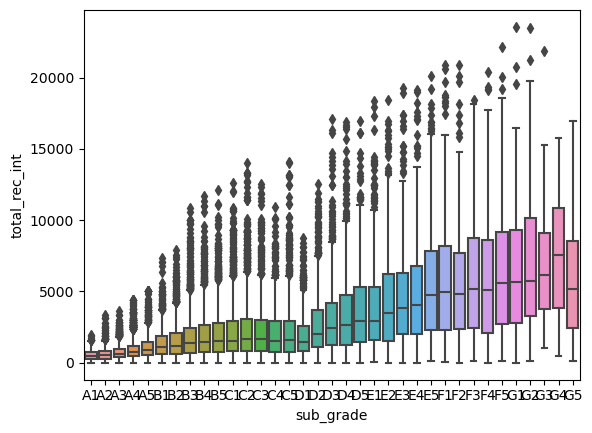

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 

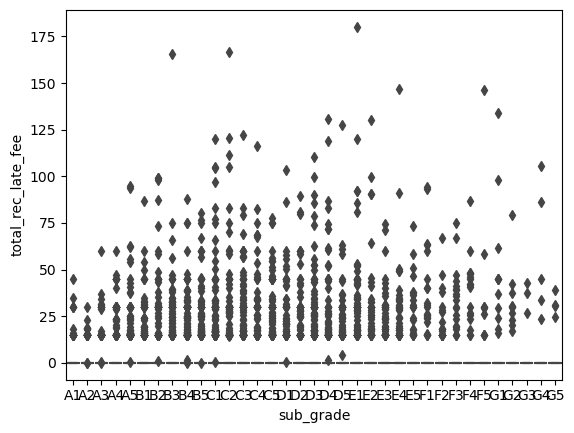

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 13.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 303.28
Median: 0.00
q1: 0.00
q3: 773.76
Median: 0.00
q1: 0.00
q3: 43.82
Median: 0.00
q1: 0.00
q3: 378.87


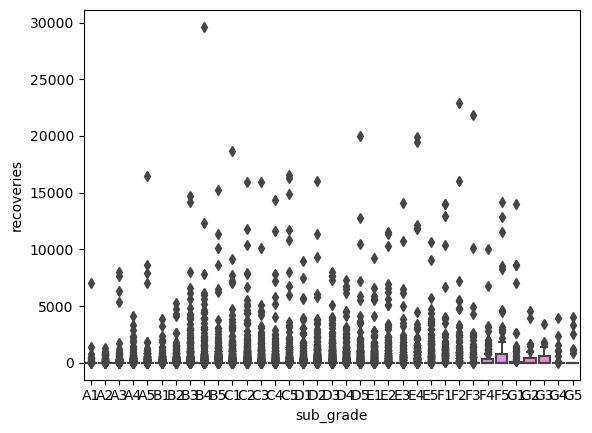

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 3.99
Median: 0.00
q1: 0.00
q3: 9.09
Median: 0.00
q1: 0.00
q3: 0.44
Median: 0.00
q1: 0.00
q3: 3.54
Median: 

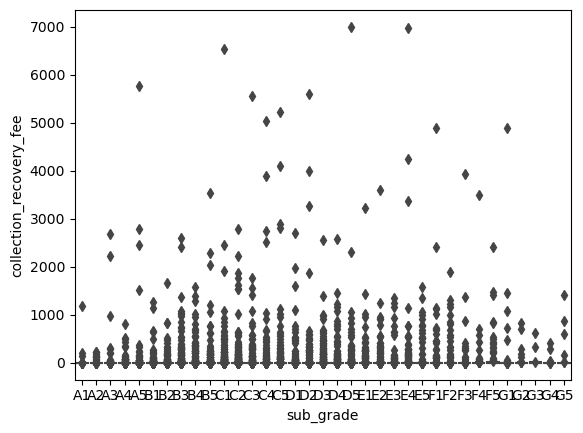

Median: 428.34
q1: 178.76
q3: 2472.18
Median: 402.94
q1: 184.77
q3: 2377.25
Median: 422.18
q1: 194.52
q3: 2380.15
Median: 477.19
q1: 208.61
q3: 2707.30
Median: 506.07
q1: 223.01
q3: 2962.02
Median: 522.96
q1: 219.43
q3: 3120.30
Median: 570.54
q1: 214.91
q3: 3396.24
Median: 604.71
q1: 233.52
q3: 3623.71
Median: 595.98
q1: 216.13
q3: 3738.64
Median: 564.48
q1: 225.08
q3: 3646.80
Median: 517.46
q1: 201.21
q3: 3338.43
Median: 575.12
q1: 218.82
q3: 3809.93
Median: 524.22
q1: 200.24
q3: 3127.27
Median: 518.39
q1: 188.53
q3: 2903.83
Median: 453.86
q1: 184.64
q3: 2762.56
Median: 388.46
q1: 186.76
q3: 1826.37
Median: 552.31
q1: 223.34
q3: 3592.15
Median: 682.24
q1: 265.06
q3: 3965.29
Median: 682.65
q1: 238.96
q3: 4637.58
Median: 611.40
q1: 231.79
q3: 5043.55
Median: 742.01
q1: 244.70
q3: 5205.68
Median: 795.98
q1: 259.47
q3: 6651.44
Median: 882.03
q1: 298.86
q3: 6248.80
Median: 750.99
q1: 276.04
q3: 7280.16
Median: 1016.32
q1: 350.12
q3: 8199.40
Median: 1203.64
q1: 357.42
q3: 7423.70
Median: 11

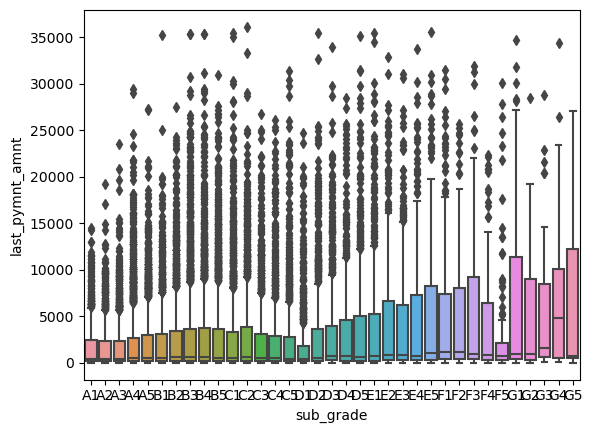

Median: 8000.00
q1: 5000.00
q3: 13000.00
Median: 8000.00
q1: 5000.00
q3: 13000.00
Median: 9000.00
q1: 5000.00
q3: 14000.00
Median: 9600.00
q1: 5281.25
q3: 15000.00
Median: 10000.00
q1: 5600.00
q3: 15000.00
Median: 10000.00
q1: 5850.00
q3: 15000.00
Median: 10000.00
q1: 6000.00
q3: 15000.00
Median: 10000.00
q1: 6000.00
q3: 15000.00
Median: 10000.00
q1: 6000.00
q3: 16000.00
Median: 10000.00
q1: 6000.00
q3: 16000.00


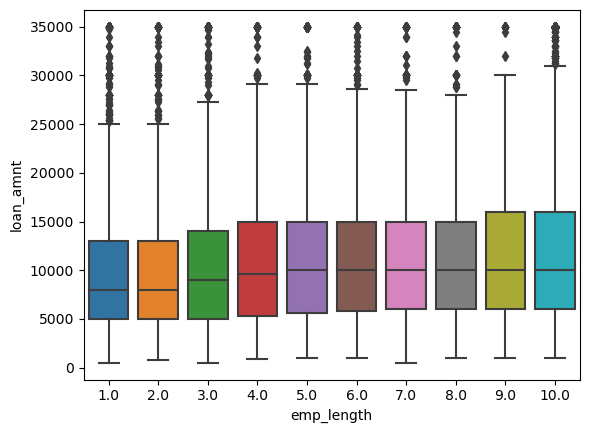

Median: 11.83
q1: 9.32
q3: 14.26
Median: 11.86
q1: 9.63
q3: 14.27
Median: 11.71
q1: 9.25
q3: 14.27
Median: 11.86
q1: 9.27
q3: 14.65
Median: 11.71
q1: 8.90
q3: 14.59
Median: 11.71
q1: 8.90
q3: 14.59
Median: 11.86
q1: 9.25
q3: 14.65
Median: 11.71
q1: 8.69
q3: 14.26
Median: 11.58
q1: 8.88
q3: 14.46
Median: 11.49
q1: 8.49
q3: 14.42


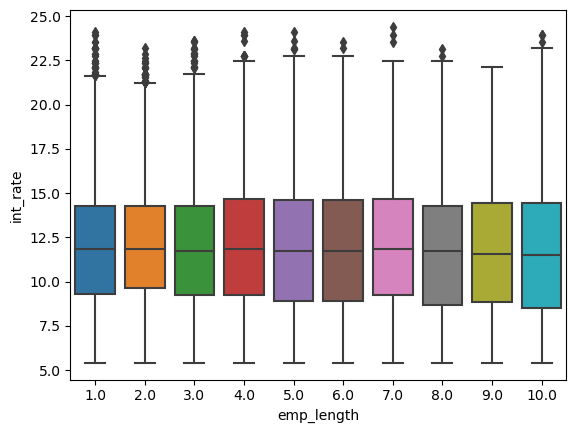

Median: 243.34
q1: 150.80
q3: 383.37
Median: 251.59
q1: 158.77
q3: 387.66
Median: 270.15
q1: 163.77
q3: 398.26
Median: 277.92
q1: 168.20
q3: 411.36
Median: 277.18
q1: 168.93
q3: 419.17
Median: 282.34
q1: 170.72
q3: 427.00
Median: 297.70
q1: 181.94
q3: 448.49
Median: 284.39
q1: 174.78
q3: 438.72
Median: 312.91
q1: 192.09
q3: 461.47
Median: 304.43
q1: 174.88
q3: 473.45


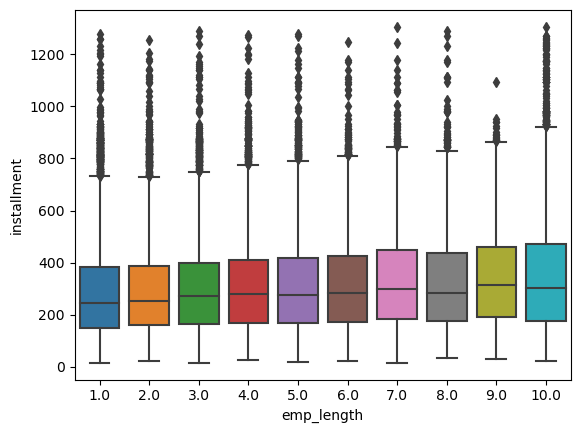

Median: 50000.00
q1: 35000.00
q3: 75000.00
Median: 51319.00
q1: 36500.00
q3: 73400.00
Median: 55000.00
q1: 39996.00
q3: 76200.00
Median: 57000.00
q1: 40000.00
q3: 80000.00
Median: 57000.00
q1: 40800.00
q3: 80000.00
Median: 59750.00
q1: 41000.00
q3: 80000.00
Median: 60000.00
q1: 44000.00
q3: 80000.00
Median: 60000.00
q1: 45000.00
q3: 85000.00
Median: 63500.00
q1: 47002.00
q3: 86500.00
Median: 65000.00
q1: 48000.00
q3: 90000.00


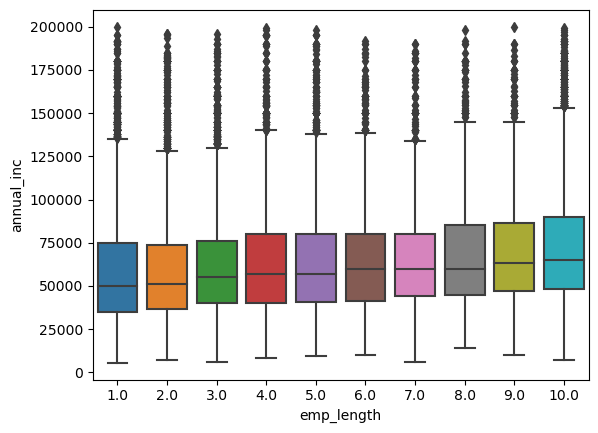

Median: 12.80
q1: 7.51
q3: 18.09
Median: 13.33
q1: 7.97
q3: 18.33
Median: 13.30
q1: 8.08
q3: 18.41
Median: 13.30
q1: 8.07
q3: 18.51
Median: 13.59
q1: 8.25
q3: 18.84
Median: 14.02
q1: 8.91
q3: 19.16
Median: 13.89
q1: 8.81
q3: 18.88
Median: 13.89
q1: 9.07
q3: 19.33
Median: 13.75
q1: 8.73
q3: 18.55
Median: 13.83
q1: 8.59
q3: 18.98


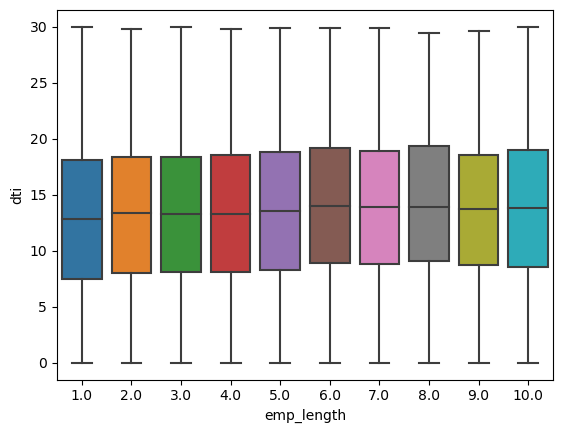

Median: 8.00
q1: 6.00
q3: 11.00
Median: 8.00
q1: 6.00
q3: 11.00
Median: 8.00
q1: 6.00
q3: 11.00
Median: 8.00
q1: 6.00
q3: 11.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 7.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00


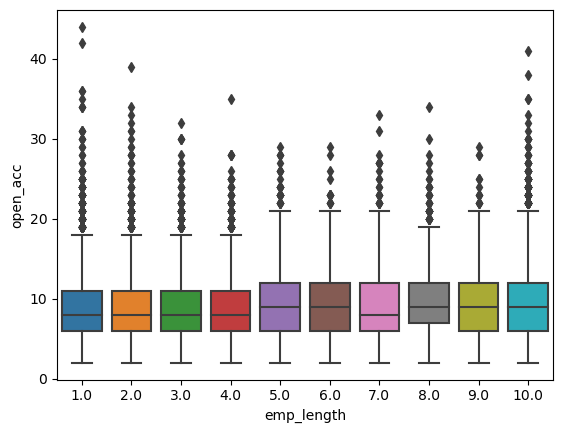

Median: 7106.00
q1: 2911.00
q3: 14151.00
Median: 7326.00
q1: 3053.00
q3: 14024.00
Median: 7601.50
q1: 3150.75
q3: 14718.75
Median: 8232.50
q1: 3427.00
q3: 15234.25
Median: 8517.00
q1: 3525.50
q3: 15185.00
Median: 8829.00
q1: 3884.75
q3: 16448.75
Median: 9359.00
q1: 4052.50
q3: 17483.00
Median: 10100.00
q1: 4705.50
q3: 17625.50
Median: 10649.00
q1: 4745.00
q3: 19580.00
Median: 11344.00
q1: 4776.00
q3: 21310.00


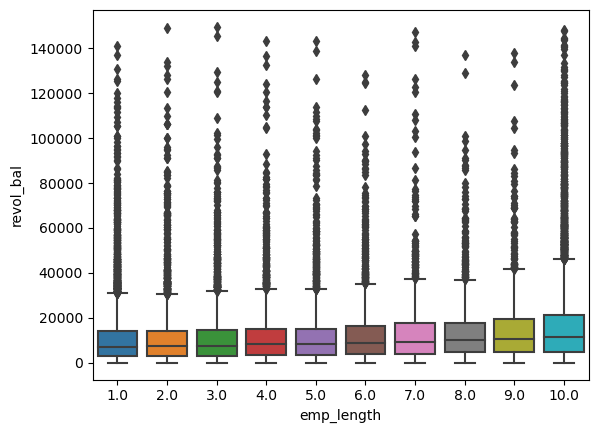

Median: 49.00
q1: 24.50
q3: 72.60
Median: 48.80
q1: 25.58
q3: 71.30
Median: 47.70
q1: 24.90
q3: 72.10
Median: 49.60
q1: 26.60
q3: 72.50
Median: 48.60
q1: 25.20
q3: 72.10
Median: 51.00
q1: 26.30
q3: 72.10
Median: 50.15
q1: 27.38
q3: 72.00
Median: 47.70
q1: 25.30
q3: 71.35
Median: 49.00
q1: 26.00
q3: 72.00
Median: 49.30
q1: 24.40
q3: 72.40


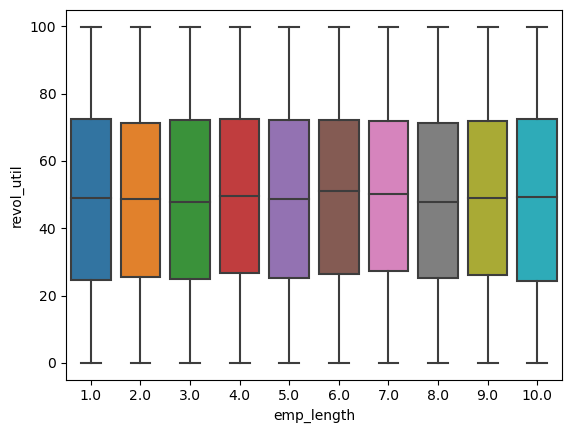

Median: 18.00
q1: 11.00
q3: 26.00
Median: 18.00
q1: 11.00
q3: 26.00
Median: 19.00
q1: 12.00
q3: 27.00
Median: 19.00
q1: 13.00
q3: 27.00
Median: 20.00
q1: 13.00
q3: 27.00
Median: 20.00
q1: 14.00
q3: 28.00
Median: 21.00
q1: 14.00
q3: 29.00
Median: 22.00
q1: 16.00
q3: 31.00
Median: 22.00
q1: 16.00
q3: 31.00
Median: 24.00
q1: 17.00
q3: 32.00


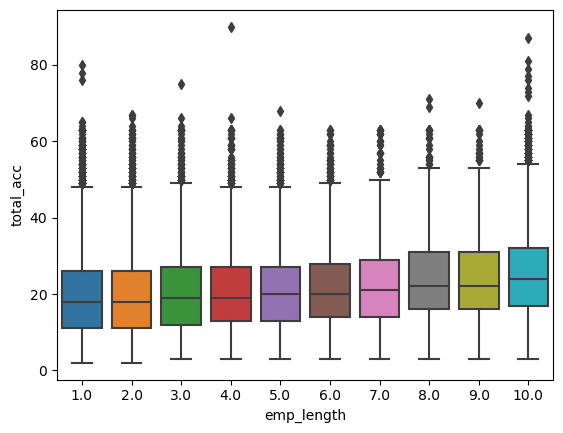

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


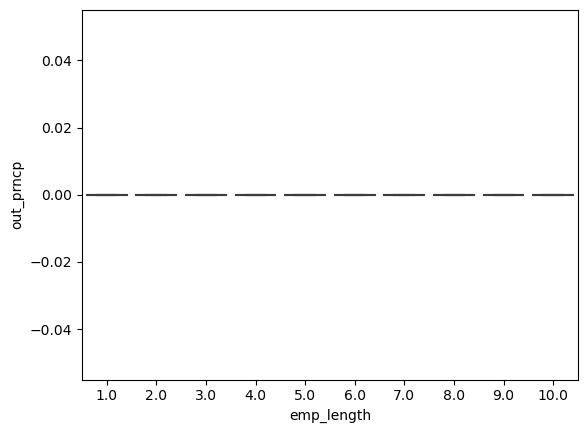

Median: 8250.84
q1: 4732.27
q3: 13922.05
Median: 8828.71
q1: 5232.00
q3: 14285.82
Median: 9476.06
q1: 5526.41
q3: 14900.31
Median: 9730.07
q1: 5542.24
q3: 15600.67
Median: 9767.25
q1: 5619.92
q3: 16196.33
Median: 10105.13
q1: 5669.00
q3: 16434.09
Median: 10303.35
q1: 5802.33
q3: 16871.79
Median: 10155.70
q1: 5886.36
q3: 16420.96
Median: 11268.79
q1: 6122.93
q3: 17404.35
Median: 10650.35
q1: 5774.11
q3: 17739.27


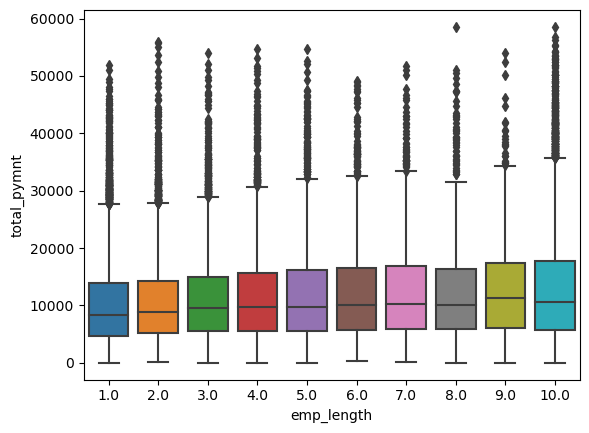

Median: 7000.00
q1: 4000.00
q3: 12000.00
Median: 7200.00
q1: 4200.00
q3: 12000.00
Median: 8000.00
q1: 4561.57
q3: 12000.00
Median: 8000.00
q1: 4500.00
q3: 12818.75
Median: 8000.00
q1: 4800.00
q3: 13137.50
Median: 8000.00
q1: 4800.00
q3: 13377.73
Median: 8450.00
q1: 4800.00
q3: 14000.00
Median: 8387.50
q1: 5000.00
q3: 13725.00
Median: 9969.90
q1: 5000.00
q3: 15000.00
Median: 8800.00
q1: 4800.00
q3: 15000.00


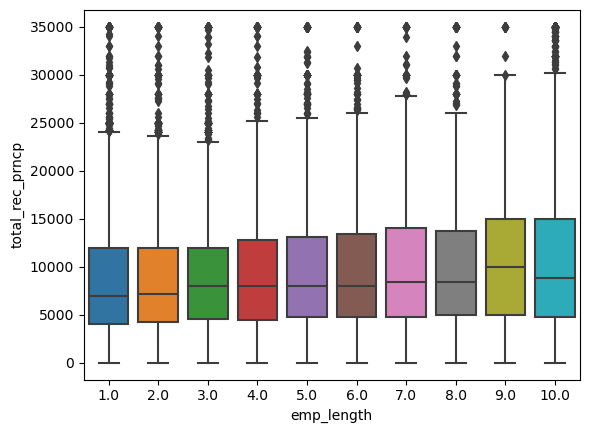

Median: 1106.00
q1: 563.02
q3: 2187.02
Median: 1209.88
q1: 607.05
q3: 2337.19
Median: 1259.68
q1: 655.53
q3: 2511.18
Median: 1287.39
q1: 658.17
q3: 2476.66
Median: 1335.79
q1: 668.64
q3: 2699.24
Median: 1370.47
q1: 686.96
q3: 2885.91
Median: 1491.40
q1: 719.43
q3: 2888.98
Median: 1359.29
q1: 681.18
q3: 2644.28
Median: 1445.72
q1: 692.03
q3: 3017.76
Median: 1410.23
q1: 664.37
q3: 3112.40


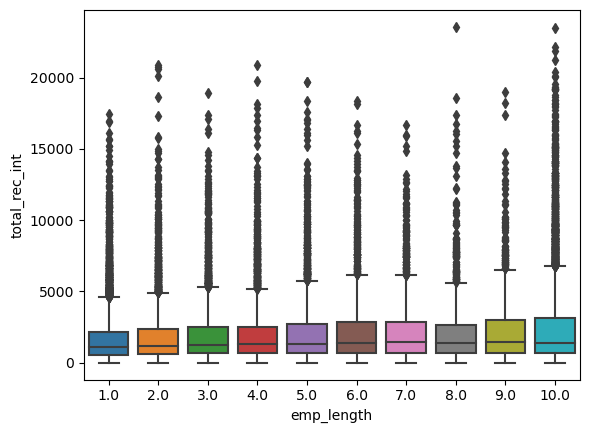

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


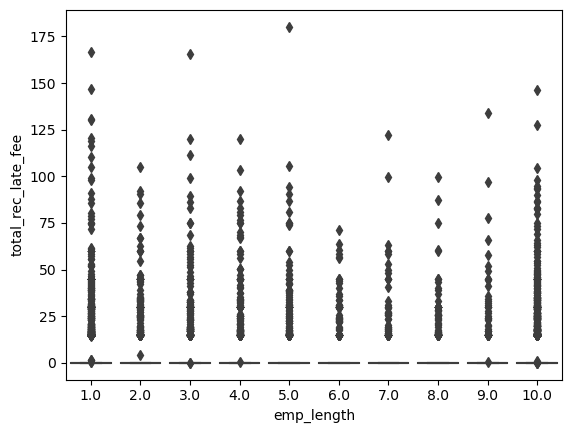

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


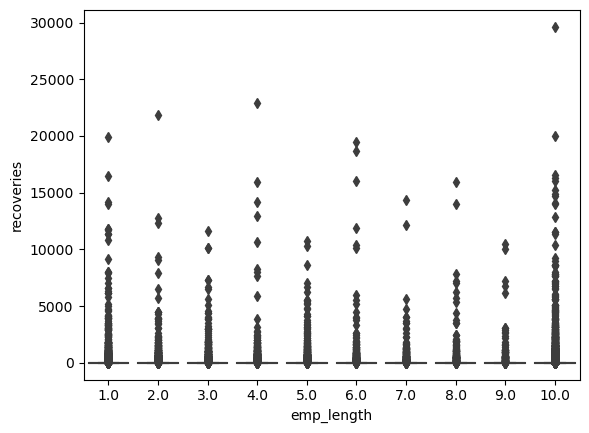

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


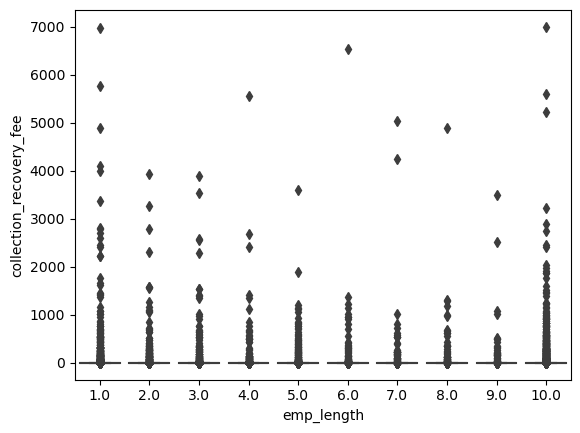

Median: 484.25
q1: 189.50
q3: 2611.54
Median: 538.20
q1: 213.22
q3: 2952.96
Median: 568.82
q1: 216.55
q3: 3344.39
Median: 583.74
q1: 223.31
q3: 3501.32
Median: 579.95
q1: 232.28
q3: 3594.32
Median: 566.41
q1: 220.99
q3: 3798.82
Median: 571.21
q1: 242.91
q3: 3554.35
Median: 580.58
q1: 220.84
q3: 3726.68
Median: 639.39
q1: 246.57
q3: 4288.94
Median: 601.75
q1: 225.13
q3: 4030.64


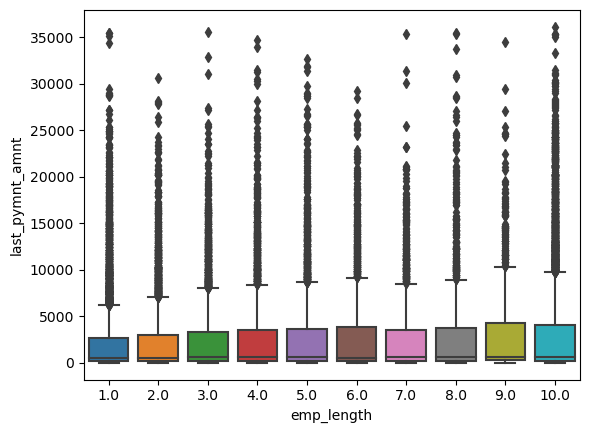

Median: 4000.00
q1: 3400.00
q3: 7000.00
Median: 9800.00
q1: 6000.00
q3: 15000.00
Median: 8000.00
q1: 5000.00
q3: 13000.00
Median: 10000.00
q1: 6000.00
q3: 16000.00
Median: 8000.00
q1: 5000.00
q3: 14000.00


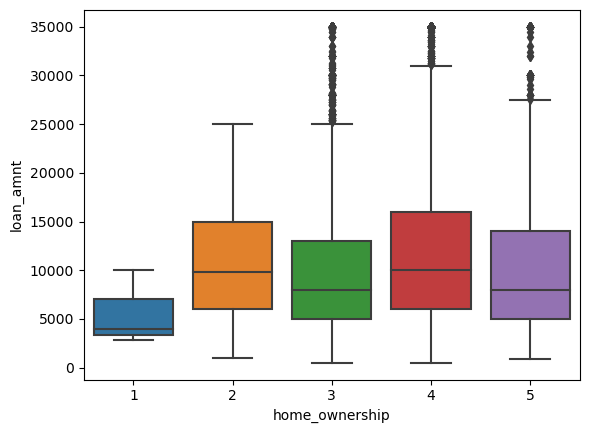

Median: 8.70
q1: 8.22
q3: 9.17
Median: 11.83
q1: 9.63
q3: 14.26
Median: 12.04
q1: 9.91
q3: 14.61
Median: 11.48
q1: 7.90
q3: 14.17
Median: 11.49
q1: 8.49
q3: 14.09


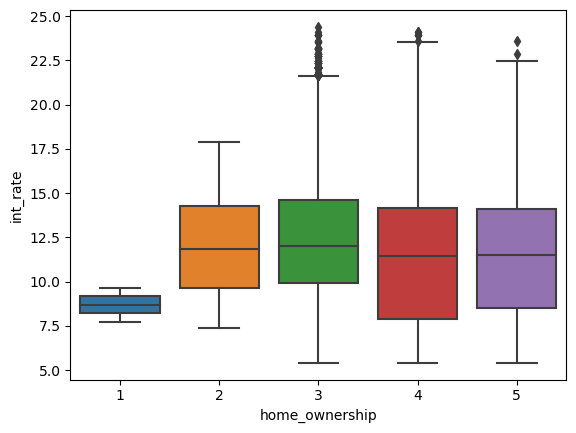

Median: 128.41
q1: 108.53
q3: 220.31
Median: 284.79
q1: 165.67
q3: 484.30
Median: 254.50
q1: 155.72
q3: 389.01
Median: 308.01
q1: 185.20
q3: 469.22
Median: 247.61
q1: 154.37
q3: 393.54


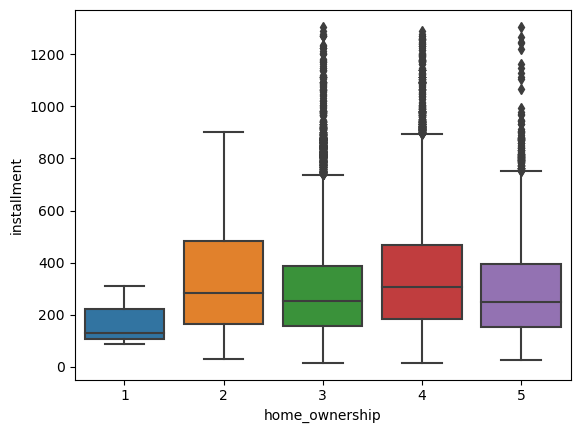

Median: 100000.00
q1: 61100.00
q3: 110000.00
Median: 59300.00
q1: 39999.00
q3: 80053.00
Median: 50000.00
q1: 35500.00
q3: 68500.00
Median: 70000.00
q1: 50400.00
q3: 95000.00
Median: 48000.00
q1: 32500.00
q3: 69996.00


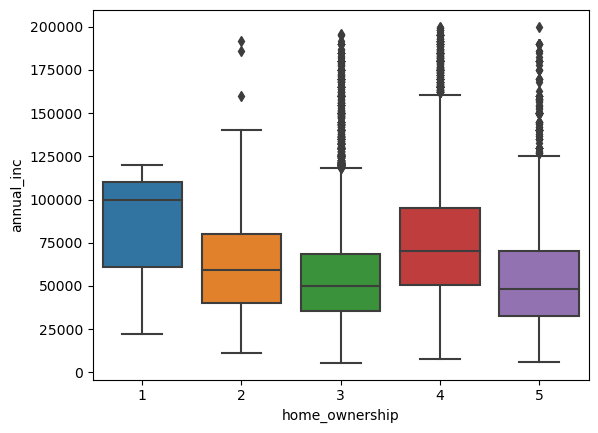

Median: 15.00
q1: 10.12
q3: 15.00
Median: 10.99
q1: 6.78
q3: 15.36
Median: 13.68
q1: 8.31
q3: 18.87
Median: 13.28
q1: 8.28
q3: 18.30
Median: 13.44
q1: 7.79
q3: 18.84


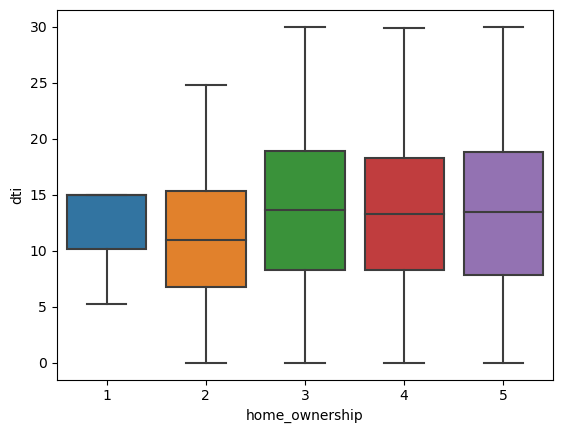

Median: 6.00
q1: 6.00
q3: 7.50
Median: 8.00
q1: 6.00
q3: 11.00
Median: 8.00
q1: 5.00
q3: 11.00
Median: 10.00
q1: 7.00
q3: 13.00
Median: 8.00
q1: 6.00
q3: 12.00


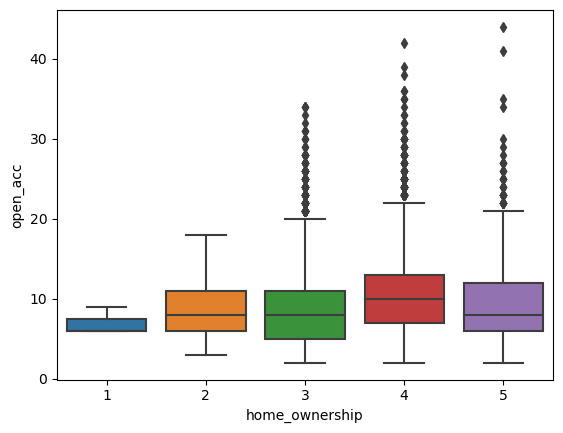

Median: 8155.00
q1: 6461.00
q3: 8155.00
Median: 10027.00
q1: 3694.25
q3: 15265.25
Median: 7261.00
q1: 3101.50
q3: 13607.25
Median: 11057.00
q1: 4690.00
q3: 21177.00
Median: 7153.00
q1: 2586.25
q3: 14278.00


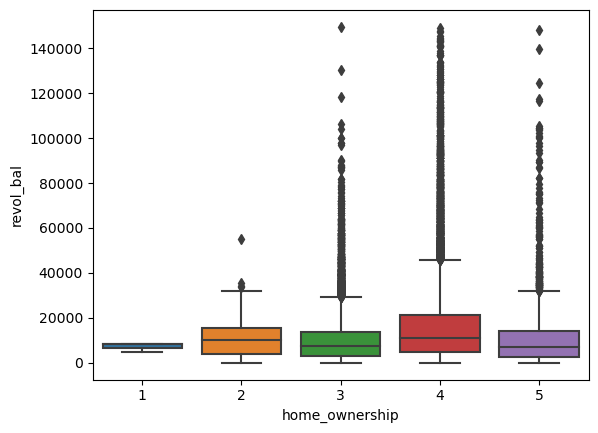

Median: 14.90
q1: 11.80
q3: 14.90
Median: 38.65
q1: 18.02
q3: 64.88
Median: 53.10
q1: 28.90
q3: 75.20
Median: 46.20
q1: 22.85
q3: 69.40
Median: 42.60
q1: 17.90
q3: 66.80


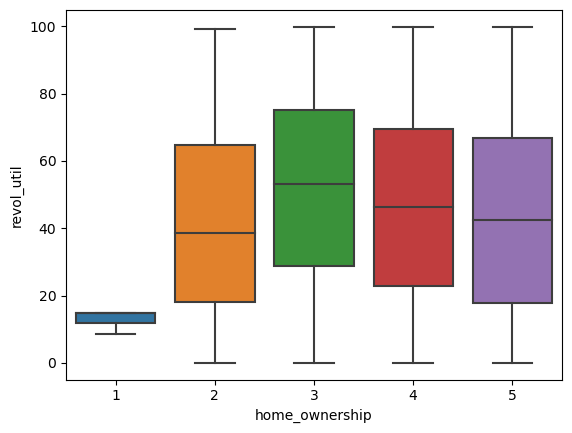

Median: 8.00
q1: 8.00
q3: 15.00
Median: 19.00
q1: 14.00
q3: 27.00
Median: 17.00
q1: 11.00
q3: 24.00
Median: 25.00
q1: 18.00
q3: 33.00
Median: 19.00
q1: 12.00
q3: 27.00


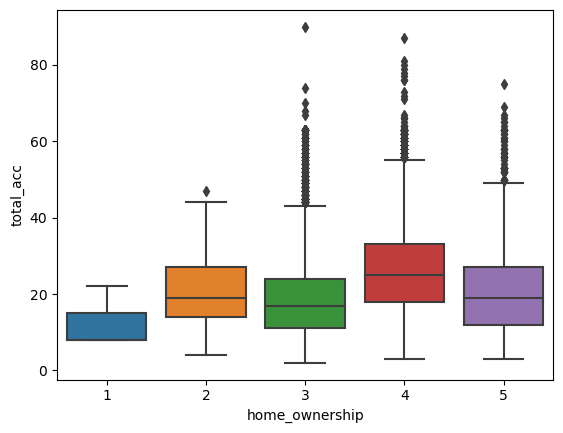

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


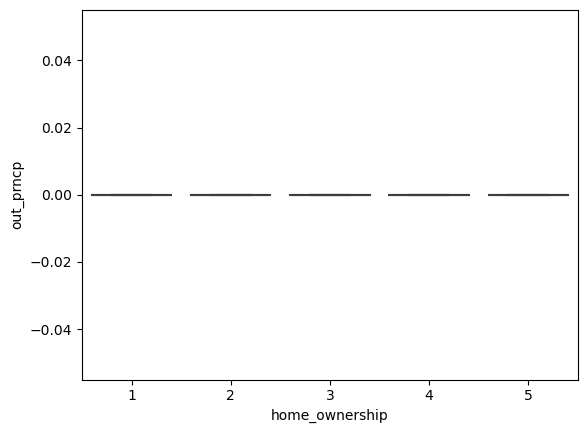

Median: 4622.49
q1: 3906.85
q3: 7931.06
Median: 8976.09
q1: 5474.64
q3: 14517.89
Median: 8661.93
q1: 4929.67
q3: 14173.30
Median: 10918.26
q1: 6119.86
q3: 17768.43
Median: 8529.00
q1: 4960.93
q3: 14450.79


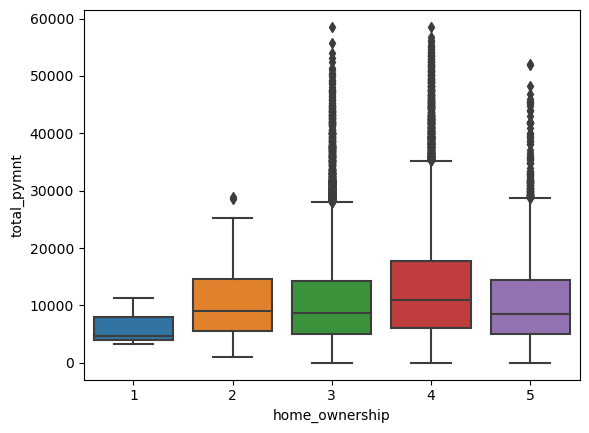

Median: 4000.00
q1: 3400.00
q3: 6999.99
Median: 7349.99
q1: 4755.23
q3: 12000.00
Median: 7125.00
q1: 4000.00
q3: 12000.00
Median: 9250.00
q1: 5000.00
q3: 15000.00
Median: 7000.00
q1: 4000.00
q3: 12000.00


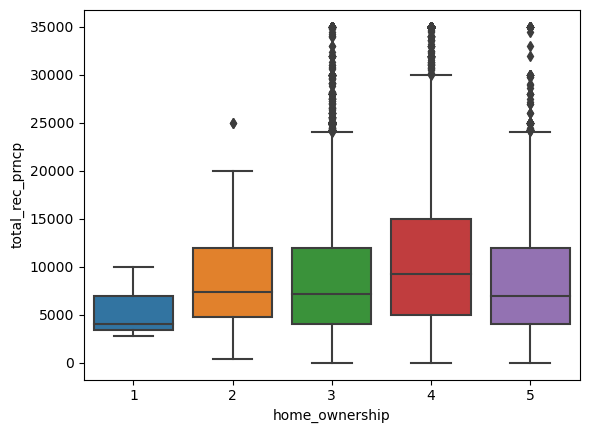

Median: 622.49
q1: 506.86
q3: 931.06
Median: 1398.80
q1: 765.56
q3: 2307.99
Median: 1214.57
q1: 609.26
q3: 2362.28
Median: 1428.08
q1: 694.79
q3: 3067.53
Median: 1097.52
q1: 521.05
q3: 2213.15


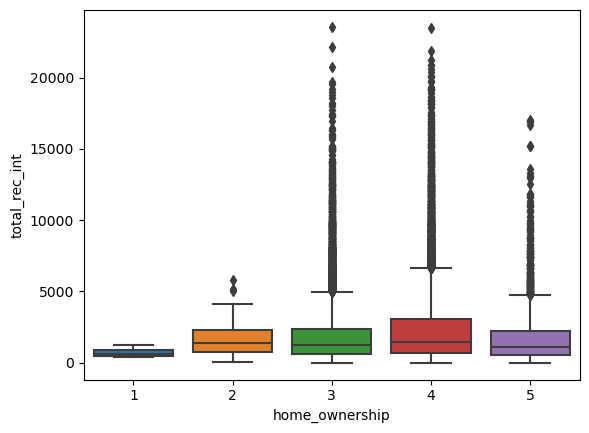

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


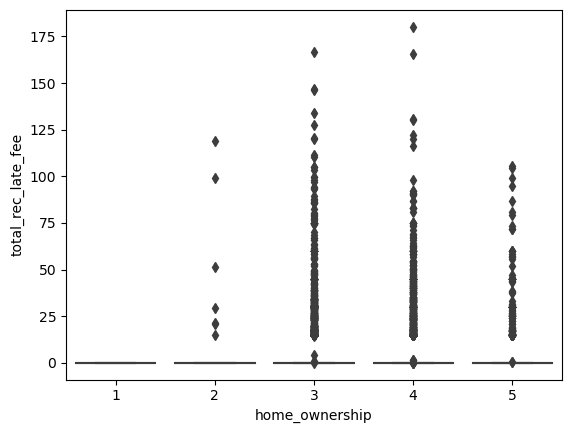

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


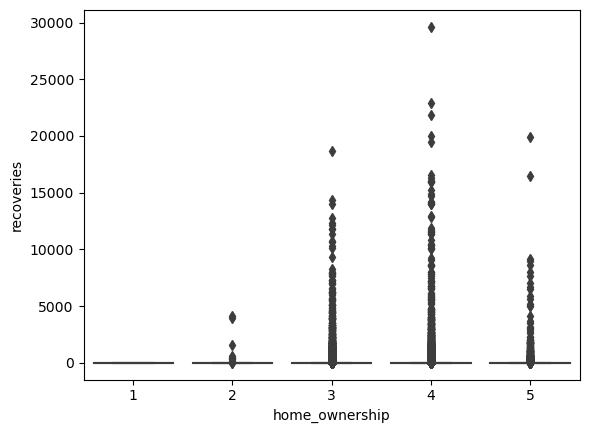

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


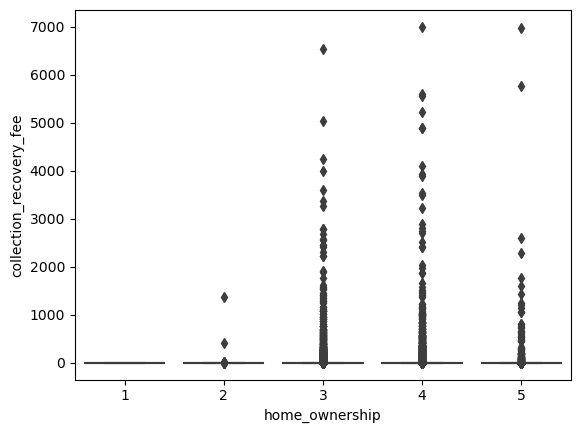

Median: 129.76
q1: 109.78
q3: 221.67
Median: 357.62
q1: 188.46
q3: 1233.06
Median: 480.52
q1: 197.43
q3: 2692.66
Median: 711.86
q1: 246.87
q3: 4328.15
Median: 504.64
q1: 200.44
q3: 3239.16


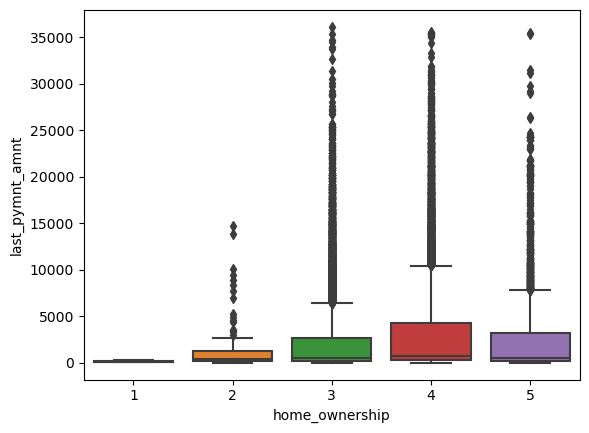

Median: 7500.00
q1: 4800.00
q3: 11200.00
Median: 8500.00
q1: 5000.00
q3: 13000.00
Median: 15000.00
q1: 8400.00
q3: 21000.00


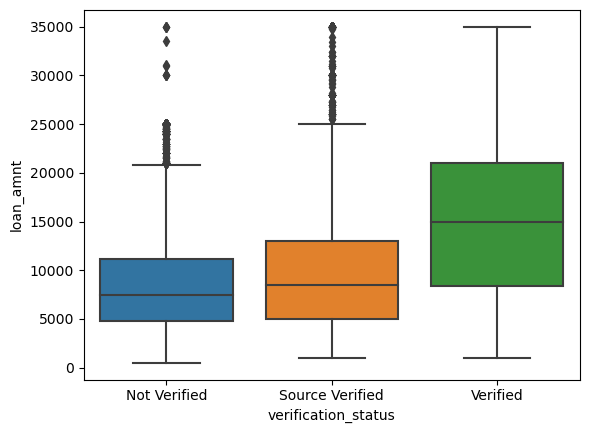

Median: 11.12
q1: 8.32
q3: 13.48
Median: 11.80
q1: 8.90
q3: 14.79
Median: 12.69
q1: 10.36
q3: 15.65


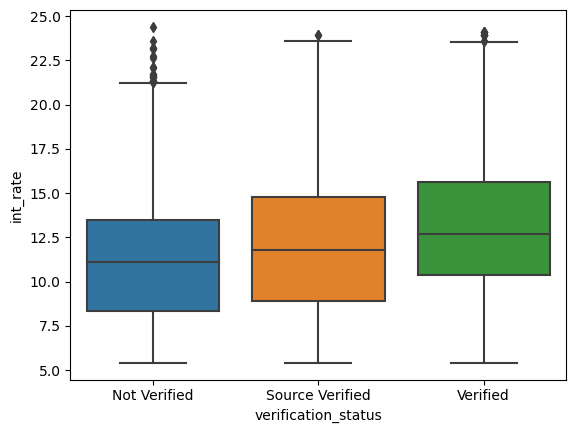

Median: 223.16
q1: 142.21
q3: 335.45
Median: 250.11
q1: 156.41
q3: 371.02
Median: 395.13
q1: 249.58
q3: 580.05


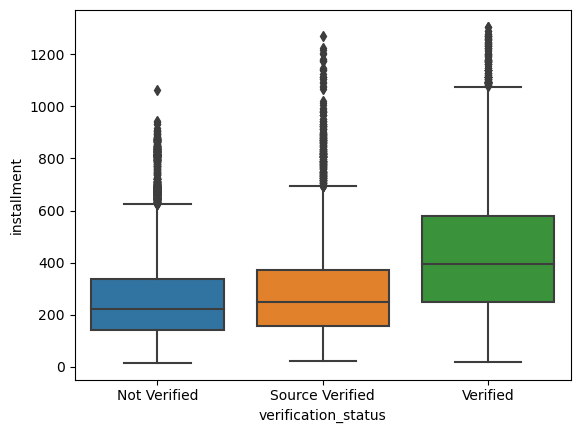

Median: 52000.00
q1: 38000.00
q3: 72000.00
Median: 55000.00
q1: 39000.00
q3: 76378.00
Median: 68000.00
q1: 49000.00
q3: 94000.00


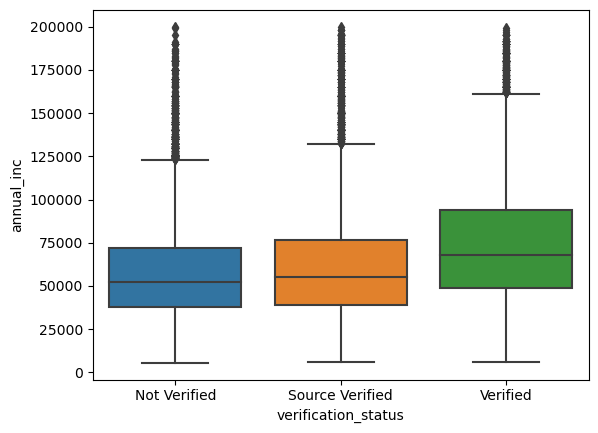

Median: 13.16
q1: 7.97
q3: 18.24
Median: 12.74
q1: 7.56
q3: 17.88
Median: 14.53
q1: 9.31
q3: 19.69


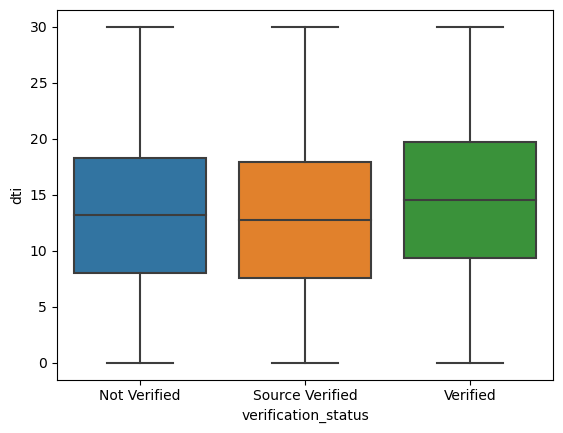

Median: 8.00
q1: 6.00
q3: 11.00
Median: 8.00
q1: 6.00
q3: 11.00
Median: 9.00
q1: 7.00
q3: 12.00


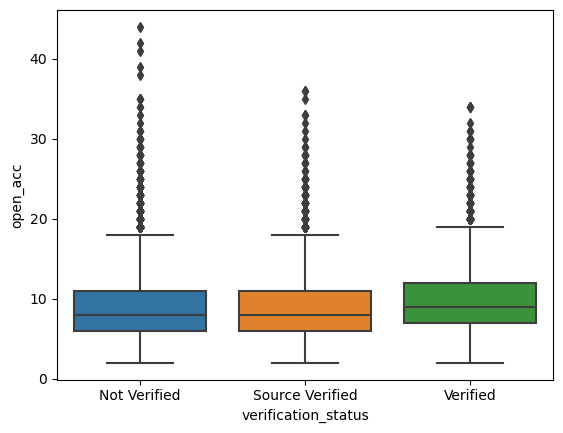

Median: 7815.00
q1: 3360.00
q3: 14560.00
Median: 7397.50
q1: 3104.75
q3: 14013.75
Median: 11786.00
q1: 4824.00
q3: 22197.00


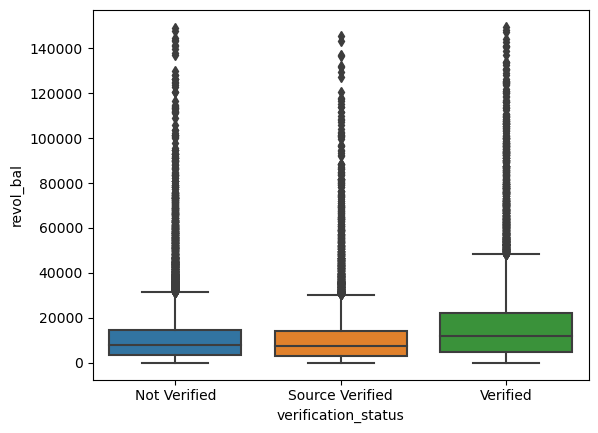

Median: 46.60
q1: 23.00
q3: 70.10
Median: 49.90
q1: 26.30
q3: 73.10
Median: 52.00
q1: 28.10
q3: 74.30


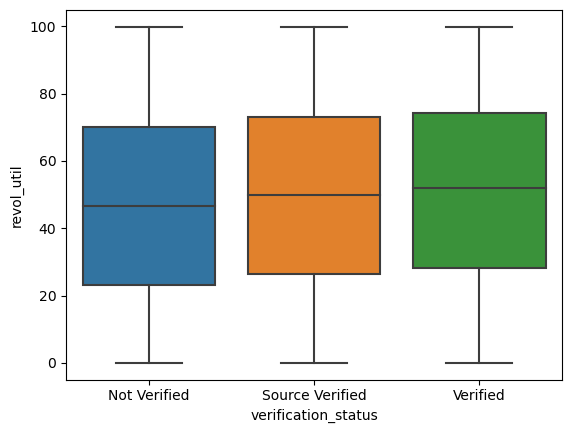

Median: 19.00
q1: 13.00
q3: 27.00
Median: 19.00
q1: 12.00
q3: 27.00
Median: 23.00
q1: 15.00
q3: 31.00


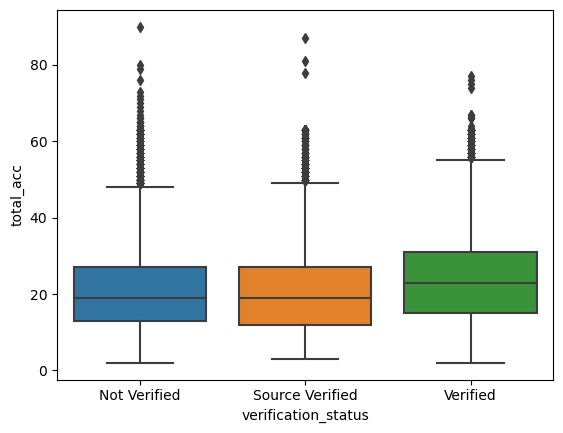

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


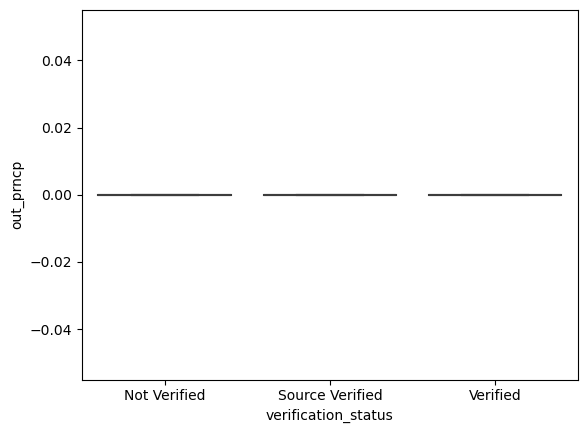

Median: 7676.19
q1: 4640.56
q3: 12082.61
Median: 8821.50
q1: 5181.86
q3: 14272.77
Median: 14549.98
q1: 7992.13
q3: 23655.38


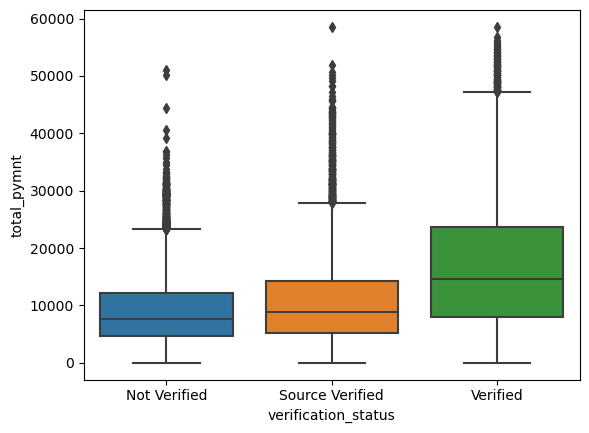

Median: 6499.99
q1: 4000.00
q3: 10000.00
Median: 7200.00
q1: 4000.00
q3: 12000.00
Median: 12000.00
q1: 6000.00
q3: 20000.00


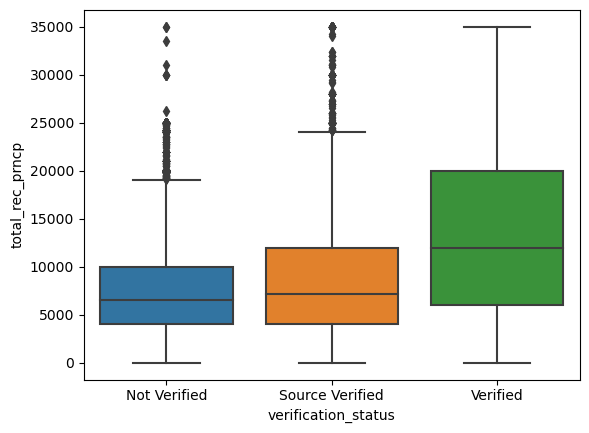

Median: 984.21
q1: 514.52
q3: 1794.25
Median: 1192.99
q1: 612.51
q3: 2365.65
Median: 2261.33
q1: 1022.66
q3: 4457.12


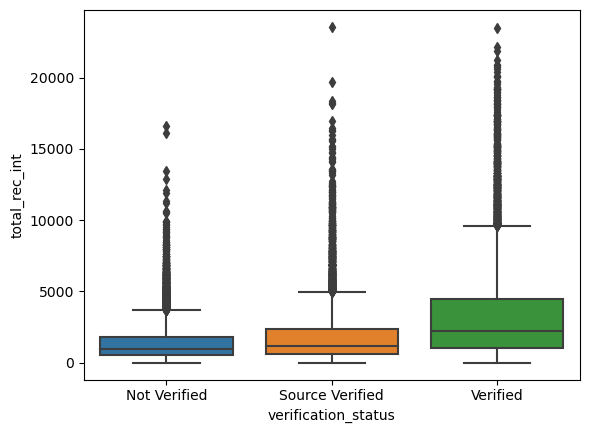

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


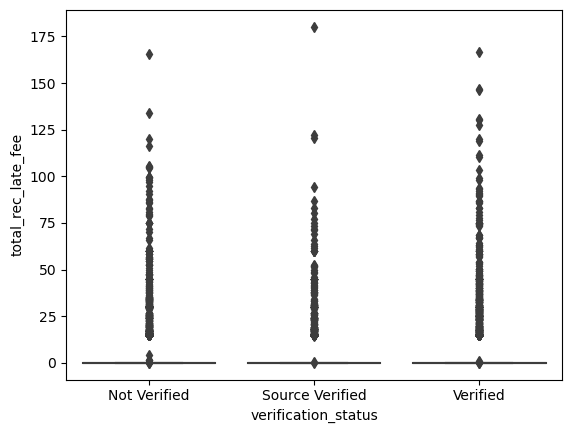

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


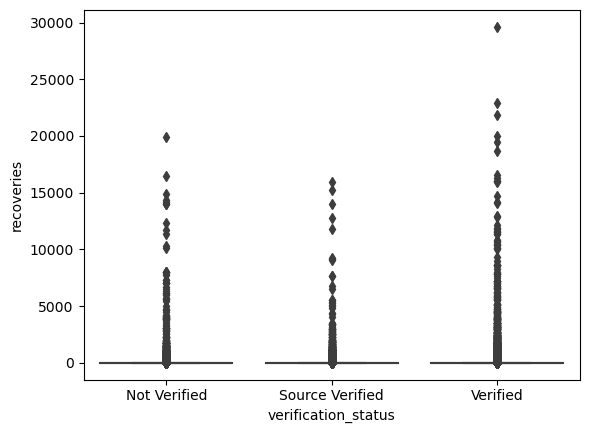

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


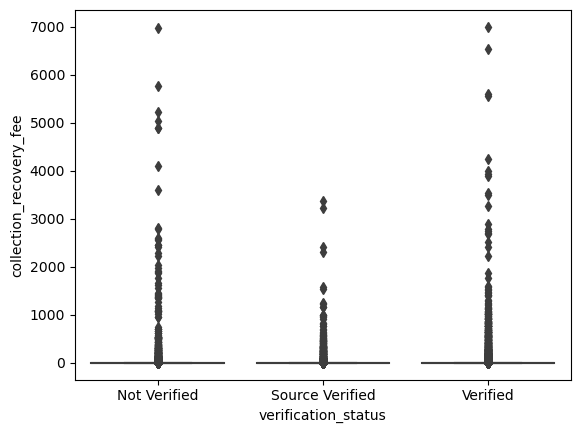

Median: 405.87
q1: 177.49
q3: 2360.56
Median: 532.64
q1: 215.32
q3: 3245.47
Median: 873.68
q1: 324.08
q3: 5863.57


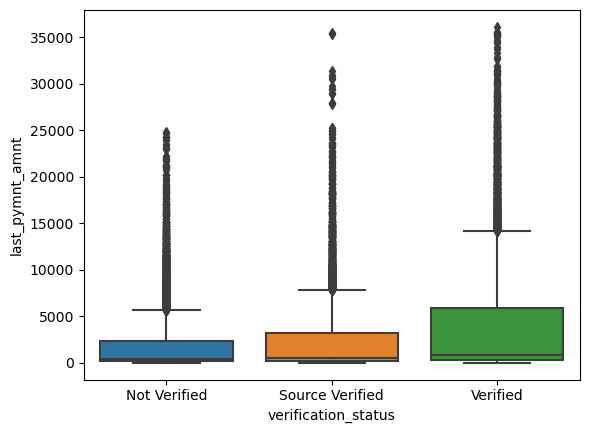

Median: 10000.00
q1: 5600.00
q3: 16000.00
Median: 9300.00
q1: 5000.00
q3: 15000.00


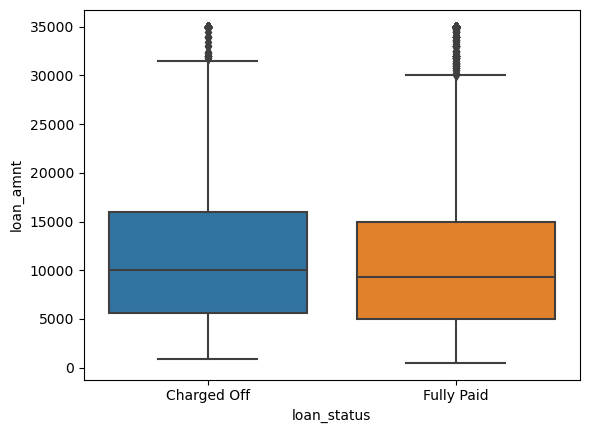

Median: 13.57
q1: 11.28
q3: 16.40
Median: 11.49
q1: 8.49
q3: 13.98


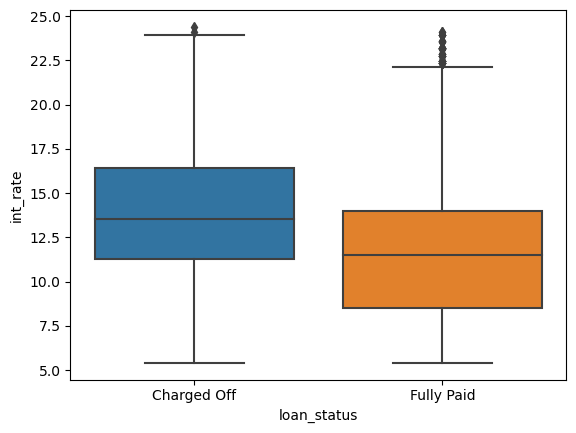

Median: 291.57
q1: 168.45
q3: 452.77
Median: 272.92
q1: 164.25
q3: 413.03


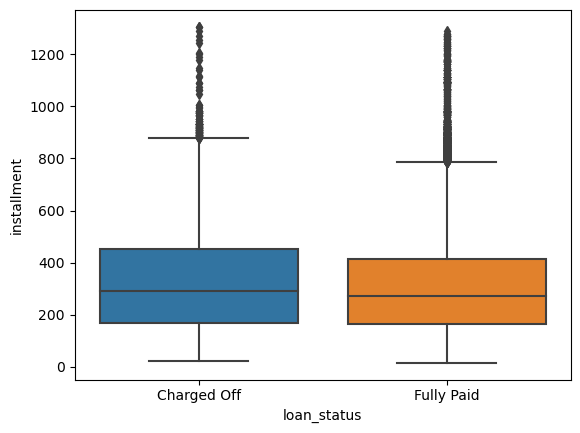

Median: 52509.36
q1: 37000.00
q3: 73994.00
Median: 59000.00
q1: 40997.94
q3: 81120.00


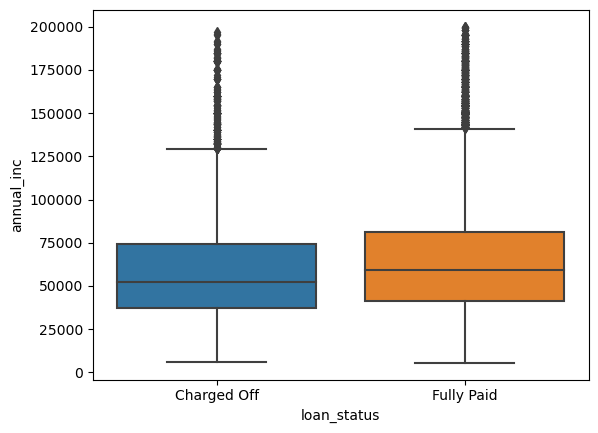

Median: 14.36
q1: 9.14
q3: 19.33
Median: 13.31
q1: 8.10
q3: 18.50


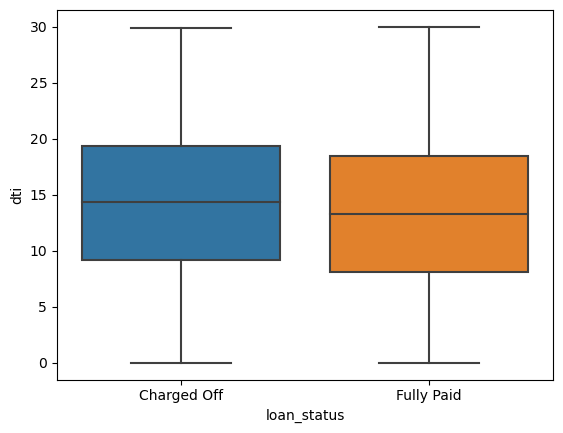

Median: 8.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00


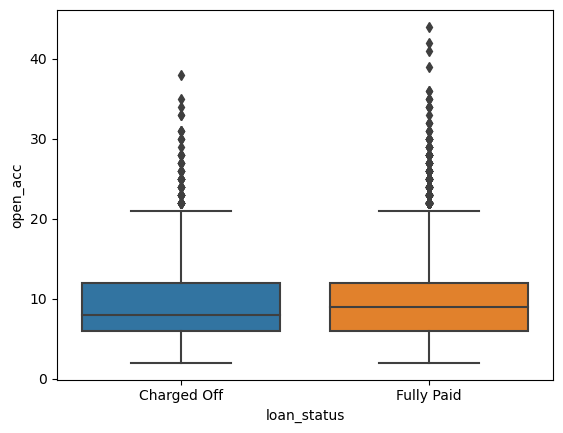

Median: 9128.00
q1: 3951.25
q3: 17265.75
Median: 8597.00
q1: 3575.75
q3: 16521.75


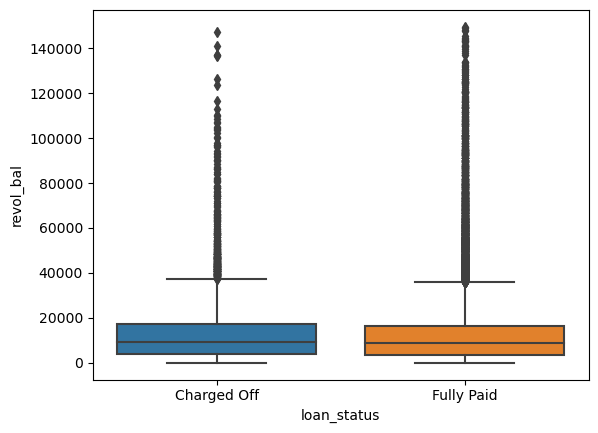

Median: 58.20
q1: 34.30
q3: 79.00
Median: 47.60
q1: 23.90
q3: 70.70


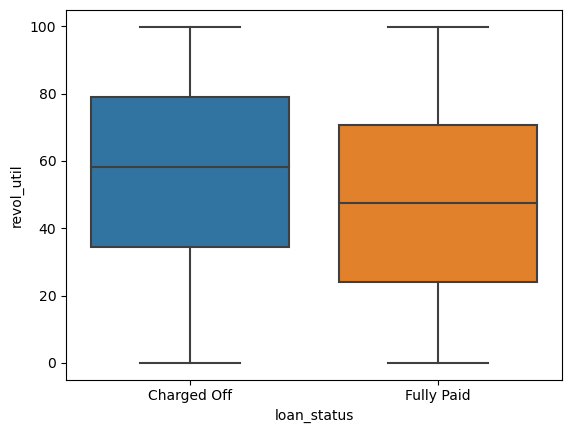

Median: 19.00
q1: 13.00
q3: 28.00
Median: 20.00
q1: 13.00
q3: 29.00


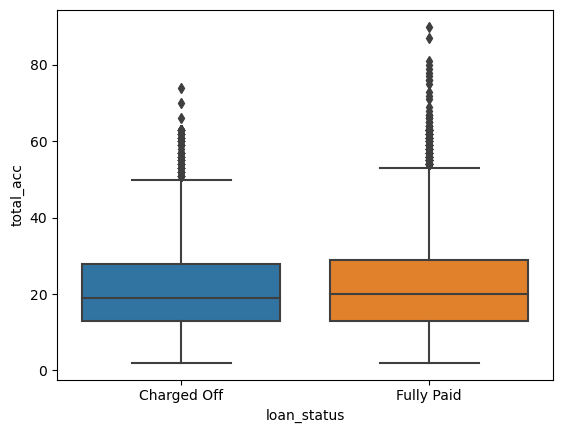

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


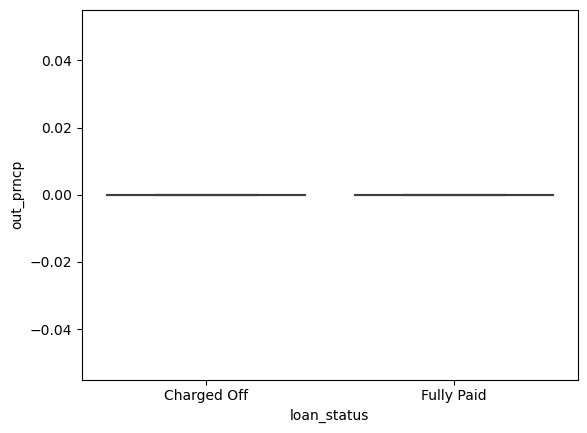

Median: 4803.53
q1: 2202.81
q3: 9109.99
Median: 10565.91
q1: 6096.51
q3: 16794.86


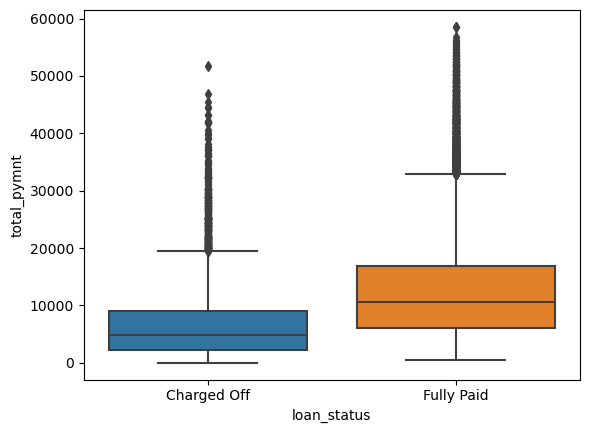

Median: 2715.74
q1: 1196.01
q3: 5282.90
Median: 9000.00
q1: 5000.00
q3: 14400.00


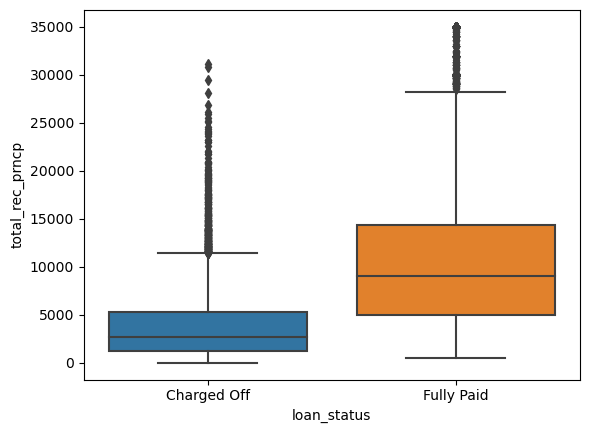

Median: 1276.49
q1: 552.13
q3: 2764.73
Median: 1286.28
q1: 652.92
q3: 2602.25


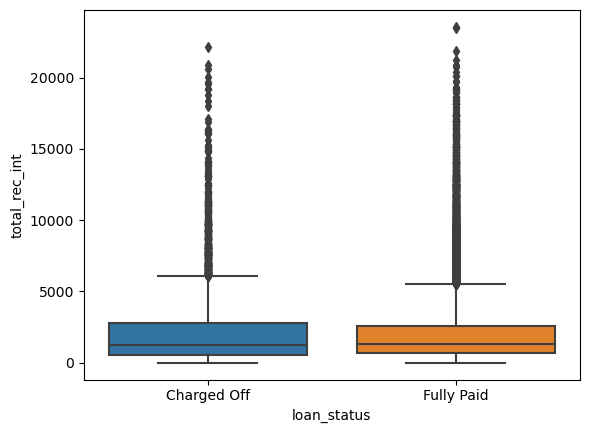

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


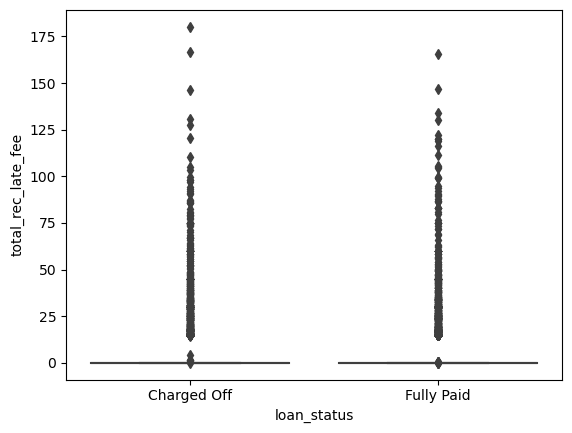

Median: 172.81
q1: 0.00
q3: 587.41
Median: 0.00
q1: 0.00
q3: 0.00


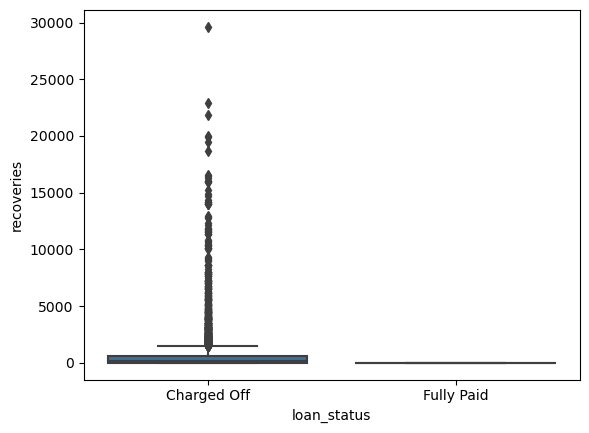

Median: 2.50
q1: 0.00
q3: 9.20
Median: 0.00
q1: 0.00
q3: 0.00


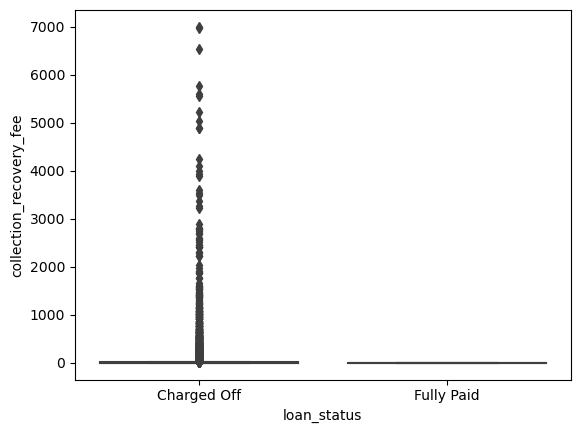

Median: 237.50
q1: 112.66
q3: 403.46
Median: 850.92
q1: 252.93
q3: 4186.18


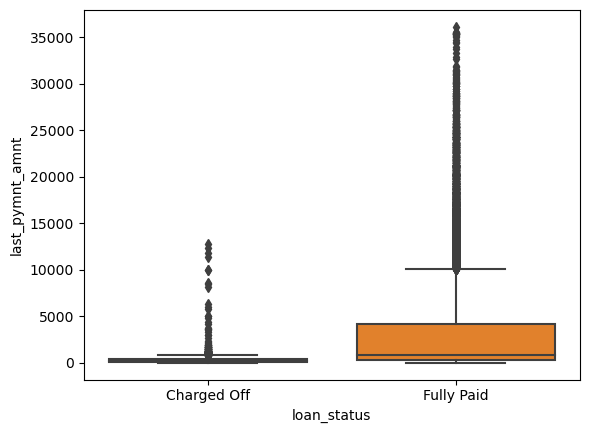

Median: 5900.00
q1: 4000.00
q3: 8400.00
Median: 10000.00
q1: 6112.50
q3: 15000.00
Median: 11000.00
q1: 7000.00
q3: 16000.00
Median: 5350.00
q1: 3000.00
q3: 9243.75
Median: 9000.00
q1: 5000.00
q3: 15000.00
Median: 10000.00
q1: 6000.00
q3: 15000.00
Median: 6000.00
q1: 4000.00
q3: 10000.00
Median: 6000.00
q1: 4000.00
q3: 10000.00
Median: 5000.00
q1: 3000.00
q3: 8000.00
Median: 6000.00
q1: 3500.00
q3: 10000.00
Median: 6000.00
q1: 3325.00
q3: 12000.00
Median: 10750.00
q1: 6000.00
q3: 18425.00
Median: 4575.00
q1: 2500.00
q3: 6831.25
Median: 8000.00
q1: 5000.00
q3: 12000.00


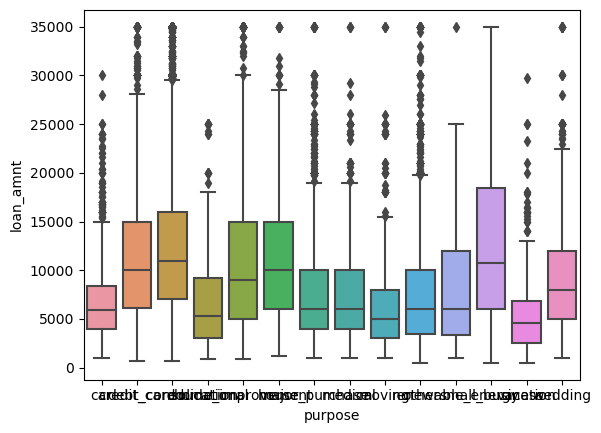

Median: 10.37
q1: 7.51
q3: 12.99
Median: 11.49
q1: 8.90
q3: 13.80
Median: 12.23
q1: 9.99
q3: 14.91
Median: 11.83
q1: 9.63
q3: 13.22
Median: 10.99
q1: 7.88
q3: 13.72
Median: 11.83
q1: 9.27
q3: 15.03
Median: 10.65
q1: 7.51
q3: 13.48
Median: 11.14
q1: 7.90
q3: 14.17
Median: 11.12
q1: 8.49
q3: 13.98
Median: 11.49
q1: 8.89
q3: 13.98
Median: 10.75
q1: 7.90
q3: 13.36
Median: 12.73
q1: 10.00
q3: 15.65
Median: 10.65
q1: 7.66
q3: 13.46
Median: 11.58
q1: 8.94
q3: 14.17


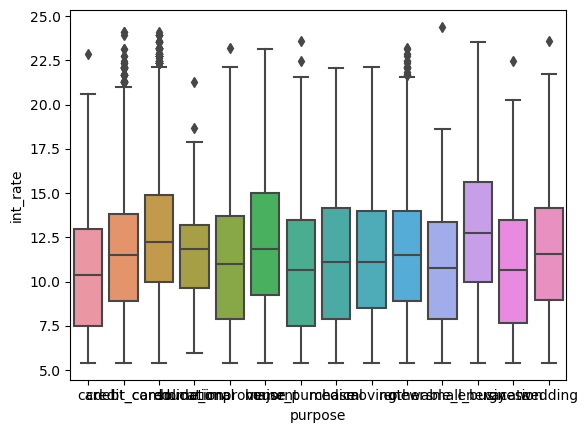

Median: 161.73
q1: 110.99
q3: 237.44
Median: 307.04
q1: 194.46
q3: 446.88
Median: 324.42
q1: 205.37
q3: 476.16
Median: 171.27
q1: 99.71
q3: 279.12
Median: 256.72
q1: 156.46
q3: 395.20
Median: 312.01
q1: 192.37
q3: 466.91
Median: 186.61
q1: 120.64
q3: 301.05
Median: 186.67
q1: 115.62
q3: 311.80
Median: 155.53
q1: 93.31
q3: 235.11
Median: 182.51
q1: 104.09
q3: 309.85
Median: 175.18
q1: 102.50
q3: 325.03
Median: 323.49
q1: 193.75
q3: 506.76
Median: 140.55
q1: 75.56
q3: 206.48
Median: 246.64
q1: 164.43
q3: 368.14


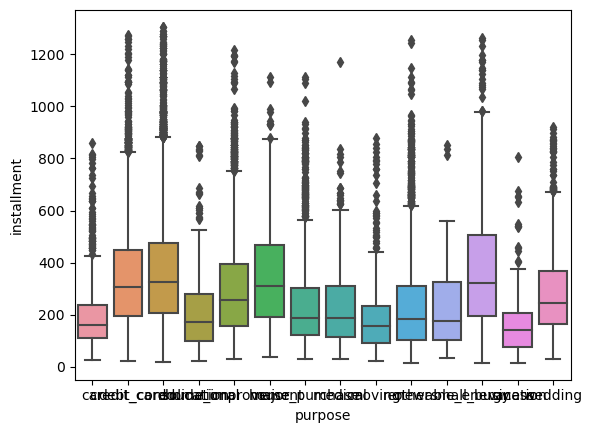

Median: 54000.00
q1: 38000.00
q3: 75000.00
Median: 60000.00
q1: 43000.00
q3: 84000.00
Median: 57347.00
q1: 40449.00
q3: 79200.00
Median: 41000.00
q1: 26625.00
q3: 69381.00
Median: 69998.00
q1: 48000.00
q3: 96700.00
Median: 60000.00
q1: 42250.00
q3: 84950.00
Median: 54078.00
q1: 37012.75
q3: 77000.00
Median: 54000.00
q1: 38000.00
q3: 77000.00
Median: 48500.00
q1: 33310.00
q3: 72000.00
Median: 51600.00
q1: 36000.00
q3: 75000.00
Median: 60000.00
q1: 35887.82
q3: 86000.00
Median: 62000.00
q1: 43324.75
q3: 89100.00
Median: 51600.00
q1: 37162.00
q3: 75000.00
Median: 59250.00
q1: 42000.00
q3: 77000.00


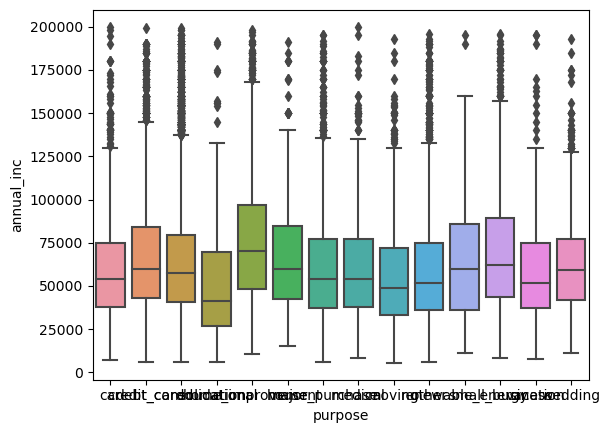

Median: 10.68
q1: 5.20
q3: 16.31
Median: 14.78
q1: 10.14
q3: 19.44
Median: 14.64
q1: 9.76
q3: 19.51
Median: 11.40
q1: 6.18
q3: 15.80
Median: 10.82
q1: 5.79
q3: 16.46
Median: 10.42
q1: 4.50
q3: 15.55
Median: 10.44
q1: 5.29
q3: 15.59
Median: 12.50
q1: 6.66
q3: 17.80
Median: 11.62
q1: 5.82
q3: 17.43
Median: 12.39
q1: 6.67
q3: 17.82
Median: 12.25
q1: 7.69
q3: 16.84
Median: 10.62
q1: 5.66
q3: 16.59
Median: 11.69
q1: 6.58
q3: 18.39
Median: 12.50
q1: 7.21
q3: 17.51


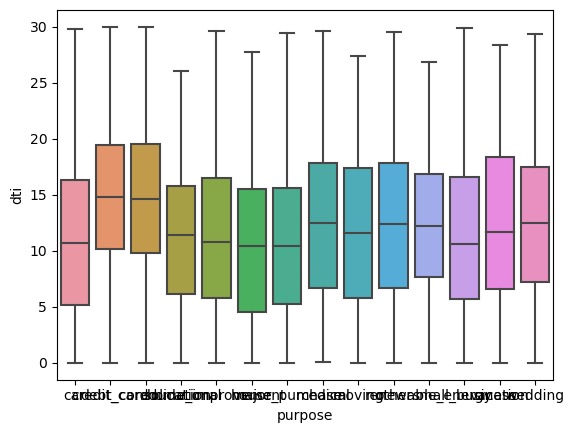

Median: 8.00
q1: 5.00
q3: 11.00
Median: 9.00
q1: 7.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 5.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 5.00
q3: 11.00
Median: 7.00
q1: 5.00
q3: 10.00
Median: 8.00
q1: 6.00
q3: 11.00
Median: 7.00
q1: 5.00
q3: 10.00
Median: 8.00
q1: 5.00
q3: 11.00
Median: 8.00
q1: 5.00
q3: 12.00
Median: 8.00
q1: 5.00
q3: 11.00
Median: 7.00
q1: 5.00
q3: 10.00
Median: 8.00
q1: 6.00
q3: 11.00


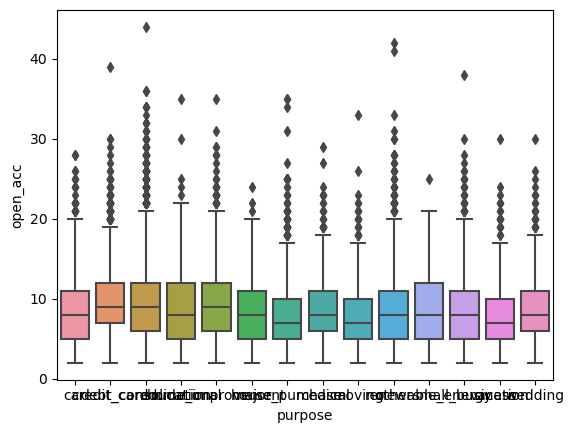

Median: 5011.50
q1: 1748.50
q3: 12271.75
Median: 12848.00
q1: 7082.00
q3: 21047.00
Median: 10521.50
q1: 5424.00
q3: 18127.25
Median: 3639.50
q1: 1282.75
q3: 9311.25
Median: 5983.50
q1: 2010.50
q3: 13773.75
Median: 4752.00
q1: 1589.50
q3: 10222.75
Median: 4092.00
q1: 1436.25
q3: 9517.50
Median: 4641.00
q1: 1699.00
q3: 11388.00
Median: 4168.00
q1: 1304.50
q3: 9634.00
Median: 5257.00
q1: 1936.50
q3: 12075.50
Median: 6281.00
q1: 2834.50
q3: 15838.50
Median: 6053.00
q1: 1944.00
q3: 14715.75
Median: 4167.00
q1: 1512.00
q3: 9246.75
Median: 5144.00
q1: 2045.75
q3: 11021.50


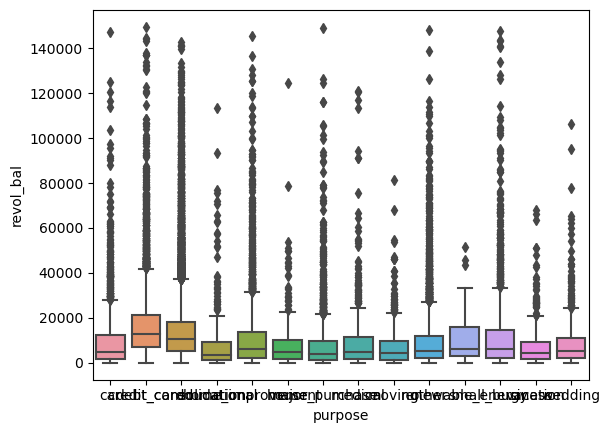

Median: 30.75
q1: 12.00
q3: 57.58
Median: 58.50
q1: 36.80
q3: 77.50
Median: 55.00
q1: 33.70
q3: 75.20
Median: 32.60
q1: 10.85
q3: 61.42
Median: 31.20
q1: 10.40
q3: 57.80
Median: 30.75
q1: 10.03
q3: 54.70
Median: 30.40
q1: 9.90
q3: 56.55
Median: 38.40
q1: 12.80
q3: 68.15
Median: 41.15
q1: 15.88
q3: 71.80
Median: 43.30
q1: 17.75
q3: 71.20
Median: 44.70
q1: 22.35
q3: 73.70
Median: 37.90
q1: 13.90
q3: 65.20
Median: 39.10
q1: 12.40
q3: 68.90
Median: 40.30
q1: 18.30
q3: 65.00


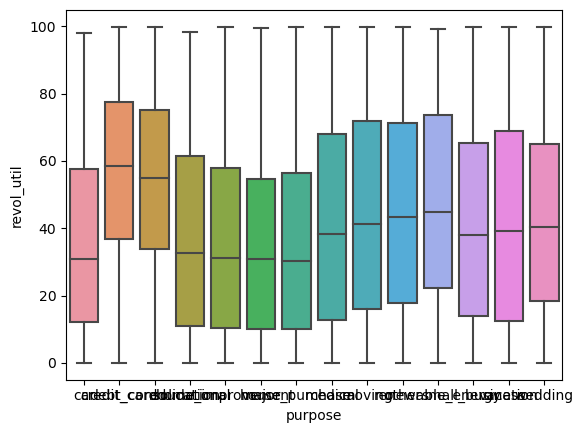

Median: 19.00
q1: 12.00
q3: 28.00
Median: 21.00
q1: 15.00
q3: 29.00
Median: 21.00
q1: 14.00
q3: 29.00
Median: 16.00
q1: 9.00
q3: 25.00
Median: 23.00
q1: 15.00
q3: 31.00
Median: 19.00
q1: 12.00
q3: 27.00
Median: 17.50
q1: 11.00
q3: 26.00
Median: 19.00
q1: 13.00
q3: 28.00
Median: 16.50
q1: 10.00
q3: 25.00
Median: 18.00
q1: 11.00
q3: 26.00
Median: 22.00
q1: 13.50
q3: 30.00
Median: 19.00
q1: 12.00
q3: 28.00
Median: 19.00
q1: 12.00
q3: 27.00
Median: 17.00
q1: 11.00
q3: 25.00


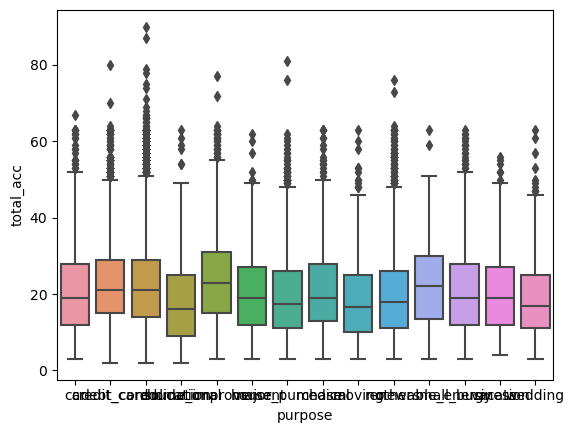

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


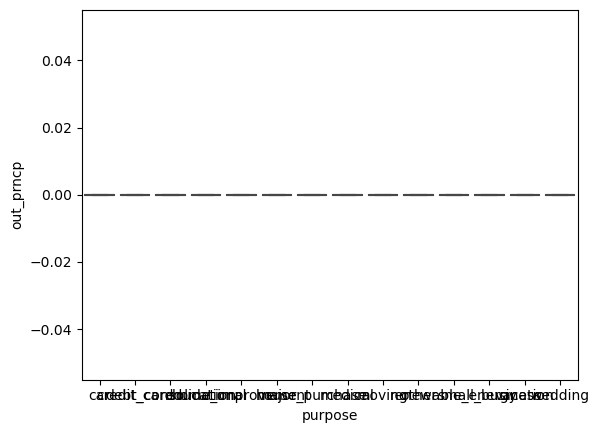

Median: 6319.65
q1: 4169.32
q3: 9491.15
Median: 10958.02
q1: 6593.26
q3: 16721.23
Median: 11460.26
q1: 6659.72
q3: 17901.01
Median: 5713.71
q1: 3025.55
q3: 9344.14
Median: 9388.26
q1: 5320.77
q3: 15619.42
Median: 11028.14
q1: 6216.08
q3: 17457.91
Median: 6622.24
q1: 4033.24
q3: 10864.60
Median: 6475.68
q1: 3686.22
q3: 11233.32
Median: 5044.84
q1: 2963.51
q3: 7966.85
Median: 6107.42
q1: 3387.85
q3: 10984.63
Median: 6039.47
q1: 3556.64
q3: 12608.24
Median: 10370.20
q1: 5406.31
q3: 17336.03
Median: 4729.28
q1: 2455.93
q3: 7404.12
Median: 8975.40
q1: 5684.60
q3: 13594.28


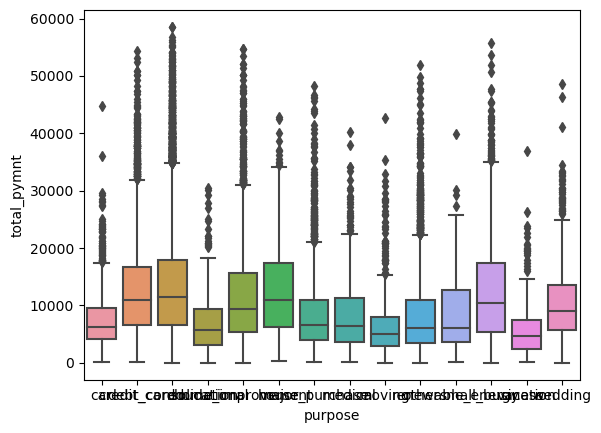

Median: 5266.75
q1: 3500.00
q3: 8000.00
Median: 9250.00
q1: 5500.00
q3: 14000.00
Median: 9999.99
q1: 5306.80
q3: 15000.00
Median: 5000.00
q1: 2500.00
q3: 7500.00
Median: 8000.00
q1: 4499.99
q3: 13000.00
Median: 10000.00
q1: 5000.00
q3: 15000.00
Median: 5725.00
q1: 3425.00
q3: 9725.00
Median: 5200.00
q1: 3000.00
q3: 9600.00
Median: 4198.09
q1: 2400.00
q3: 7000.00
Median: 5000.00
q1: 2700.00
q3: 9600.00
Median: 5000.00
q1: 2450.00
q3: 10487.50
Median: 8000.00
q1: 3959.76
q3: 14475.00
Median: 4000.00
q1: 2000.00
q3: 6000.00
Median: 7500.00
q1: 5000.00
q3: 11549.99


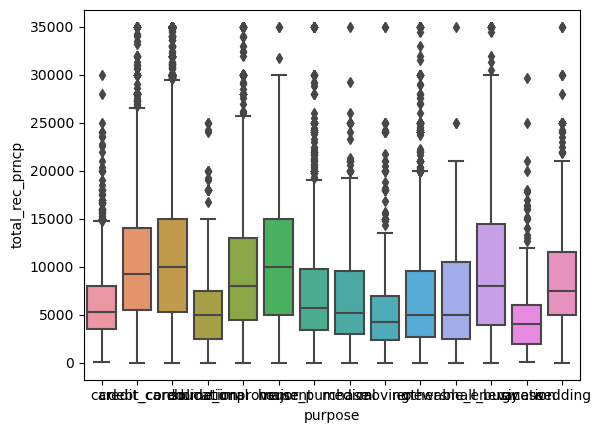

Median: 785.33
q1: 422.01
q3: 1420.57
Median: 1418.92
q1: 768.01
q3: 2704.48
Median: 1637.89
q1: 833.07
q3: 3169.06
Median: 757.12
q1: 380.77
q3: 1356.56
Median: 1127.87
q1: 557.03
q3: 2487.61
Median: 1294.22
q1: 672.79
q3: 2753.83
Median: 784.57
q1: 408.89
q3: 1525.27
Median: 808.07
q1: 423.37
q3: 1490.71
Median: 668.46
q1: 364.39
q3: 1205.02
Median: 833.94
q1: 413.25
q3: 1639.91
Median: 608.82
q1: 348.25
q3: 1643.29
Median: 1629.71
q1: 748.34
q3: 3393.41
Median: 571.29
q1: 273.51
q3: 1005.03
Median: 1189.89
q1: 656.46
q3: 2239.16


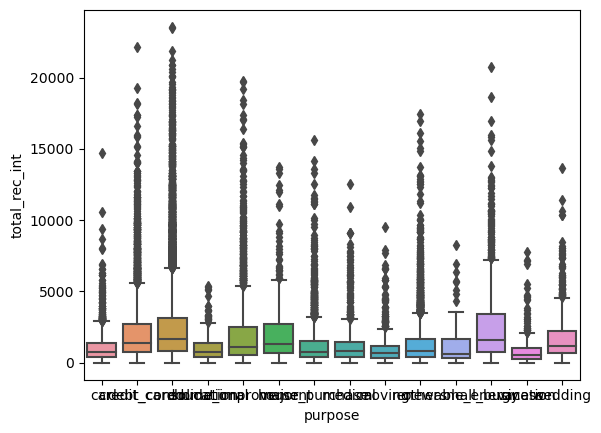

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


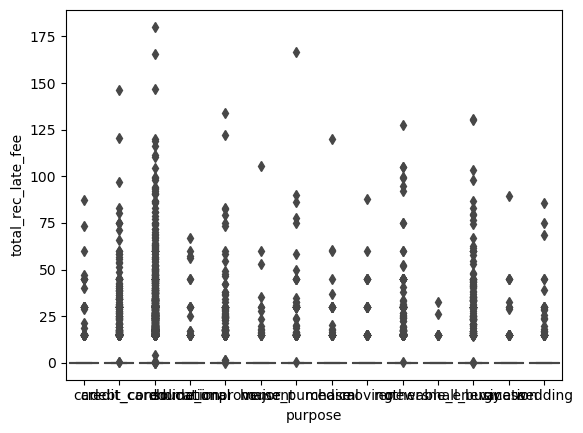

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


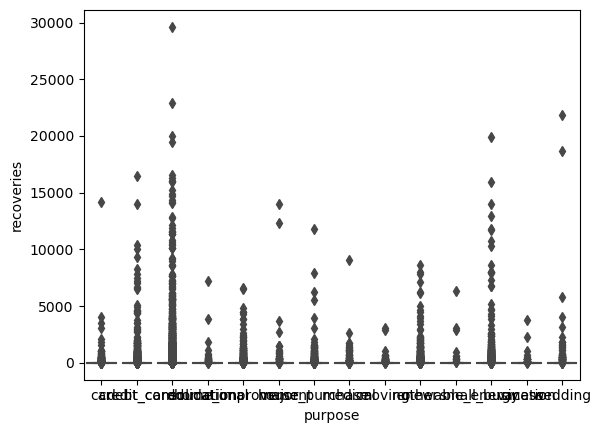

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


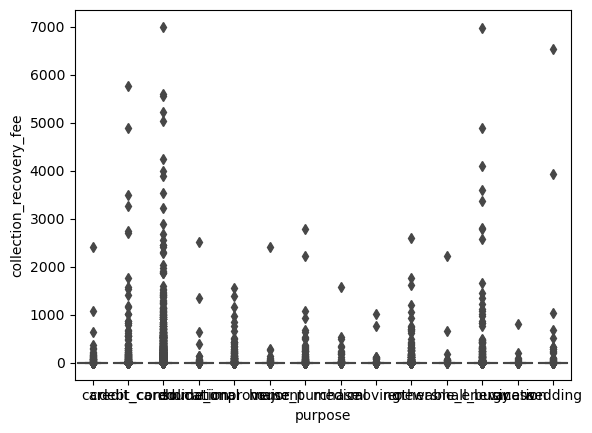

Median: 428.18
q1: 153.46
q3: 2390.53
Median: 586.89
q1: 246.62
q3: 3390.80
Median: 692.09
q1: 271.88
q3: 4379.35
Median: 247.84
q1: 100.97
q3: 1002.58
Median: 580.81
q1: 209.27
q3: 3733.02
Median: 901.73
q1: 242.03
q3: 5110.66
Median: 409.75
q1: 167.30
q3: 2423.24
Median: 350.07
q1: 139.62
q3: 2248.08
Median: 266.22
q1: 119.52
q3: 1374.86
Median: 346.45
q1: 146.10
q3: 1906.95
Median: 396.75
q1: 127.01
q3: 1552.76
Median: 516.81
q1: 219.06
q3: 2451.06
Median: 254.18
q1: 109.11
q3: 1399.22
Median: 534.25
q1: 204.06
q3: 2973.54


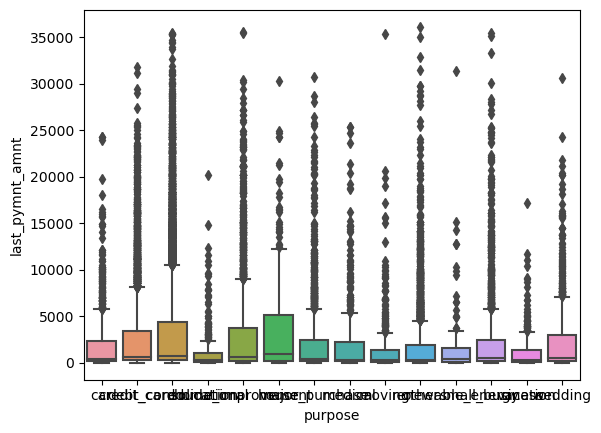

Median: 9700.00
q1: 5400.00
q3: 15000.00
Median: 8500.00
q1: 5000.00
q3: 14000.00
Median: 8000.00
q1: 5000.00
q3: 13000.00
Median: 8000.00
q1: 4800.00
q3: 13500.00
Median: 7500.00
q1: 4625.00
q3: 12000.00
Median: 7000.00
q1: 4200.00
q3: 10000.00
Median: 5250.00
q1: 2575.00
q3: 7875.00
Median: 5600.00
q1: 4300.00
q3: 7237.50
Median: 8100.00
q1: 6150.00
q3: 10050.00


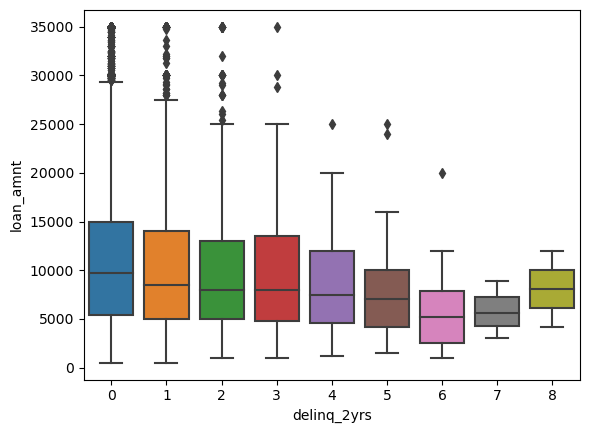

Median: 11.49
q1: 8.59
q3: 14.17
Median: 13.35
q1: 10.99
q3: 15.63
Median: 14.11
q1: 12.19
q3: 16.32
Median: 14.07
q1: 12.17
q3: 16.77
Median: 15.79
q1: 13.10
q3: 17.56
Median: 14.26
q1: 12.99
q3: 16.02
Median: 13.74
q1: 12.48
q3: 15.77
Median: 16.89
q1: 15.25
q3: 17.64
Median: 16.93
q1: 16.28
q3: 17.59


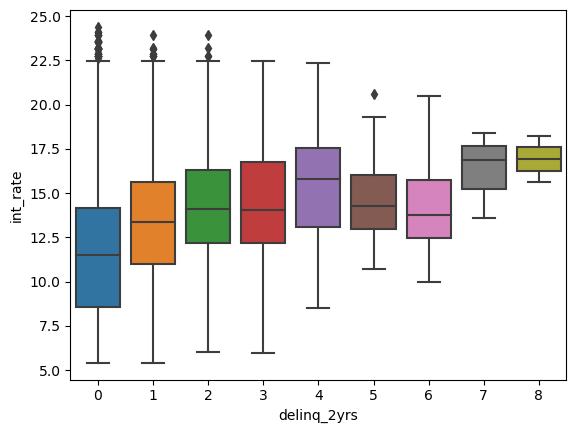

Median: 277.18
q1: 165.88
q3: 422.17
Median: 262.43
q1: 158.77
q3: 405.54
Median: 257.22
q1: 162.82
q3: 393.50
Median: 250.15
q1: 157.37
q3: 398.70
Median: 205.19
q1: 140.41
q3: 356.83
Median: 204.23
q1: 141.64
q3: 363.49
Median: 173.89
q1: 72.88
q3: 202.50
Median: 143.40
q1: 122.69
q3: 229.67
Median: 226.62
q1: 186.75
q3: 266.49


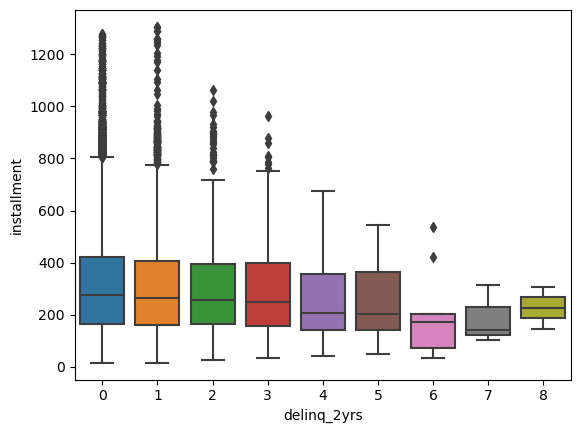

Median: 57000.00
q1: 40000.00
q3: 80000.00
Median: 60000.00
q1: 42000.00
q3: 85000.00
Median: 60000.00
q1: 42030.00
q3: 86850.00
Median: 55000.00
q1: 44400.00
q3: 80000.00
Median: 65500.00
q1: 46375.00
q3: 94650.00
Median: 78000.00
q1: 48960.00
q3: 105000.00
Median: 60315.00
q1: 50001.00
q3: 70625.00
Median: 60500.00
q1: 49250.00
q3: 63850.00
Median: 51100.00
q1: 43050.00
q3: 59150.00


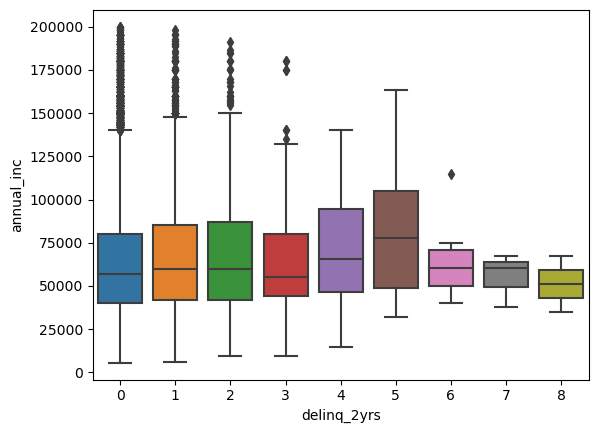

Median: 13.55
q1: 8.33
q3: 18.73
Median: 12.85
q1: 7.61
q3: 17.75
Median: 12.04
q1: 7.29
q3: 17.56
Median: 12.07
q1: 7.80
q3: 16.83
Median: 13.78
q1: 10.80
q3: 19.49
Median: 9.57
q1: 7.99
q3: 14.58
Median: 20.39
q1: 13.49
q3: 22.31
Median: 13.54
q1: 8.84
q3: 16.73
Median: 10.90
q1: 10.30
q3: 11.51


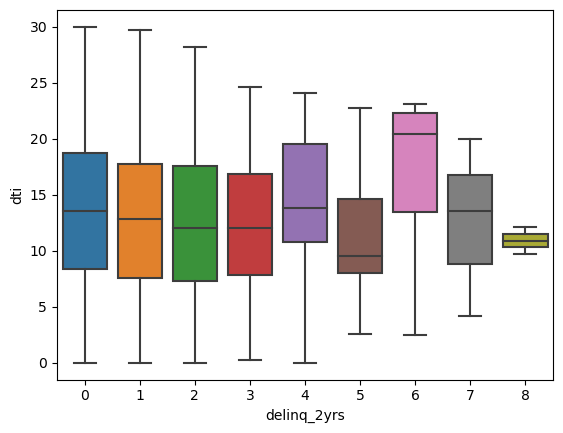

Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 6.00
q3: 12.00
Median: 8.50
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 14.50
q1: 12.00
q3: 16.75
Median: 8.00
q1: 6.50
q3: 8.50
Median: 8.50
q1: 7.75
q3: 9.25


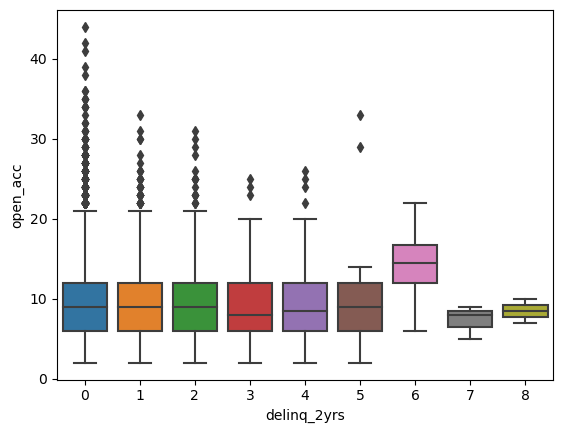

Median: 8944.00
q1: 3821.00
q3: 17014.50
Median: 6906.00
q1: 2698.75
q3: 13815.00
Median: 5766.50
q1: 1960.50
q3: 12435.25
Median: 3041.00
q1: 874.00
q3: 8034.00
Median: 2997.50
q1: 940.00
q3: 8947.25
Median: 1070.00
q1: 713.00
q3: 7483.00
Median: 3895.50
q1: 1301.50
q3: 8330.00
Median: 822.00
q1: 821.00
q3: 1074.00
Median: 1443.50
q1: 960.75
q3: 1926.25


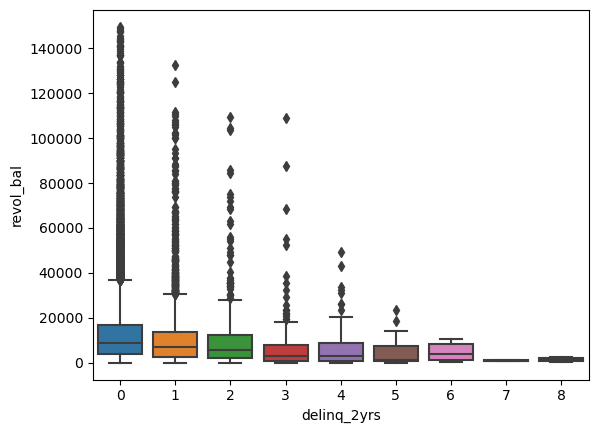

Median: 49.50
q1: 25.50
q3: 72.50
Median: 46.20
q1: 24.20
q3: 70.07
Median: 43.50
q1: 23.60
q3: 65.00
Median: 35.30
q1: 19.60
q3: 58.80
Median: 43.20
q1: 22.80
q3: 63.80
Median: 35.00
q1: 9.34
q3: 54.10
Median: 31.05
q1: 12.22
q3: 41.60
Median: 16.00
q1: 11.75
q3: 45.35
Median: 72.40
q1: 68.75
q3: 76.05


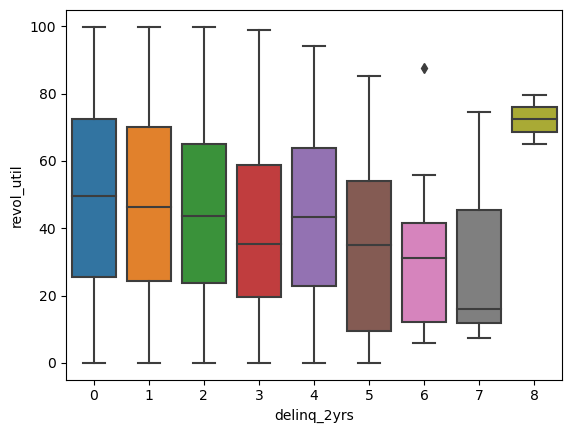

Median: 20.00
q1: 13.00
q3: 28.00
Median: 22.00
q1: 15.00
q3: 30.00
Median: 24.00
q1: 17.00
q3: 31.00
Median: 23.00
q1: 16.00
q3: 32.00
Median: 27.00
q1: 17.00
q3: 35.00
Median: 28.00
q1: 21.00
q3: 40.00
Median: 31.00
q1: 25.25
q3: 35.50
Median: 25.00
q1: 21.00
q3: 25.50
Median: 18.00
q1: 17.50
q3: 18.50


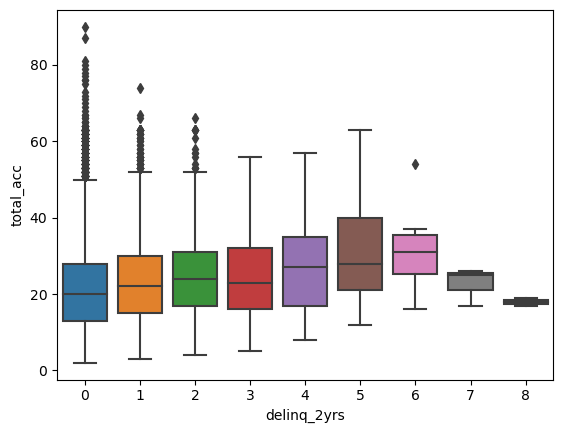

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


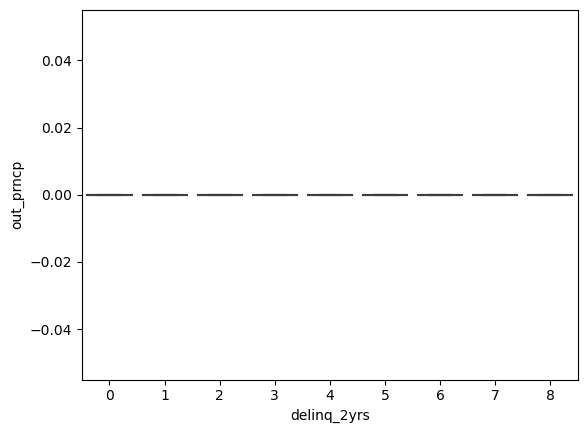

Median: 9676.10
q1: 5524.05
q3: 15987.08
Median: 8911.97
q1: 5097.79
q3: 14829.67
Median: 8488.20
q1: 4841.62
q3: 14241.95
Median: 8899.56
q1: 4486.93
q3: 15276.56
Median: 8058.10
q1: 4281.72
q3: 14162.56
Median: 7469.17
q1: 4743.73
q3: 10154.26
Median: 5944.64
q1: 3221.49
q3: 7575.85
Median: 3643.80
q1: 2323.12
q3: 7508.64
Median: 4112.63
q1: 3743.82
q3: 4481.45


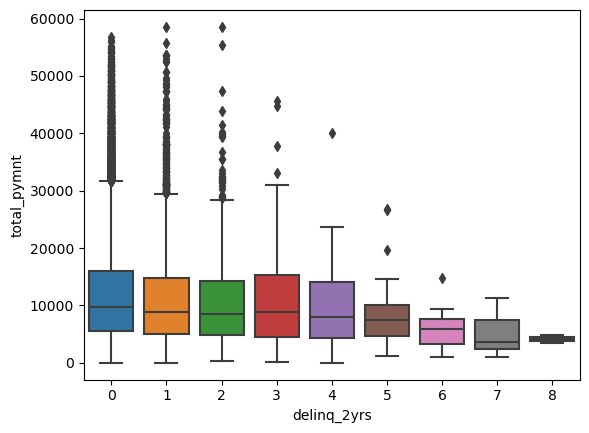

Median: 8000.00
q1: 4500.00
q3: 13000.00
Median: 7200.00
q1: 4000.00
q3: 12000.00
Median: 7000.00
q1: 3600.00
q3: 12000.00
Median: 7000.00
q1: 3300.00
q3: 12000.00
Median: 6000.00
q1: 2703.39
q3: 11799.99
Median: 6000.00
q1: 4000.00
q3: 10000.00
Median: 3650.00
q1: 1532.39
q3: 6000.00
Median: 3000.00
q1: 1669.71
q3: 5937.50
Median: 2690.15
q1: 1935.22
q3: 3445.07


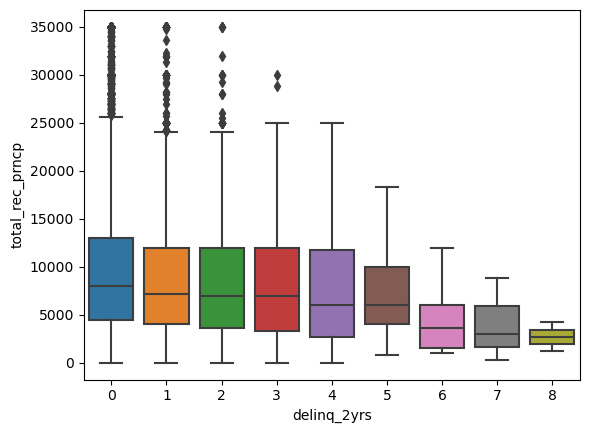

Median: 1267.15
q1: 632.61
q3: 2613.33
Median: 1389.07
q1: 677.19
q3: 2742.77
Median: 1396.07
q1: 688.85
q3: 2604.01
Median: 1505.29
q1: 708.13
q3: 3182.89
Median: 1703.39
q1: 963.77
q3: 2730.94
Median: 1302.59
q1: 743.73
q3: 2605.77
Median: 835.87
q1: 485.78
q3: 1047.94
Median: 663.03
q1: 653.41
q3: 1580.76
Median: 1108.11
q1: 879.18
q3: 1337.04


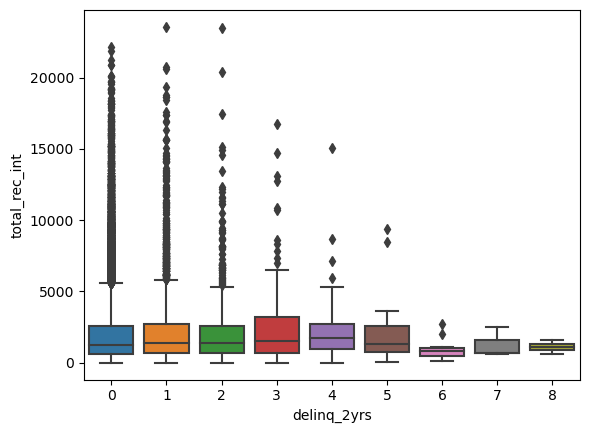

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


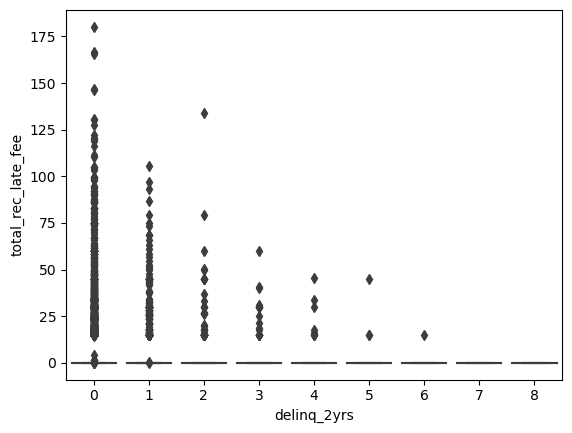

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 314.38
q1: 157.19
q3: 471.56


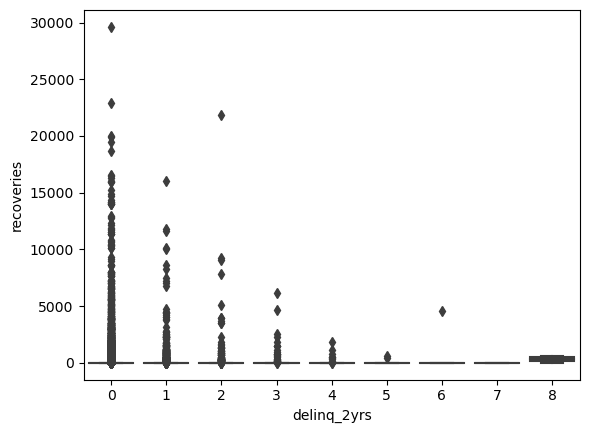

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 57.59
q1: 28.79
q3: 86.38


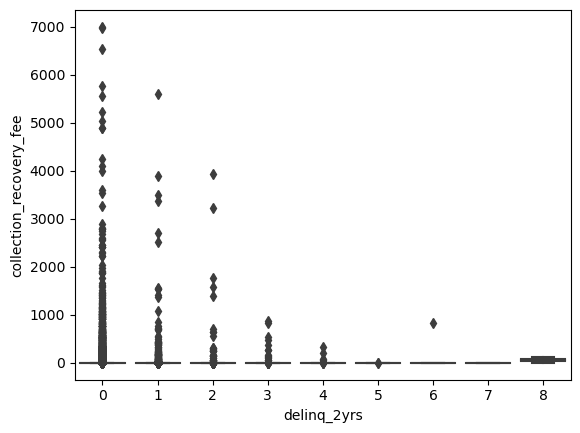

Median: 569.03
q1: 219.40
q3: 3429.18
Median: 499.11
q1: 194.60
q3: 3117.82
Median: 471.39
q1: 195.81
q3: 2921.78
Median: 466.61
q1: 179.11
q3: 2434.13
Median: 368.38
q1: 154.34
q3: 1872.95
Median: 449.09
q1: 205.87
q3: 2347.32
Median: 620.93
q1: 177.36
q3: 4273.84
Median: 352.34
q1: 319.57
q3: 419.91
Median: 1624.97
q1: 965.66
q3: 2284.27


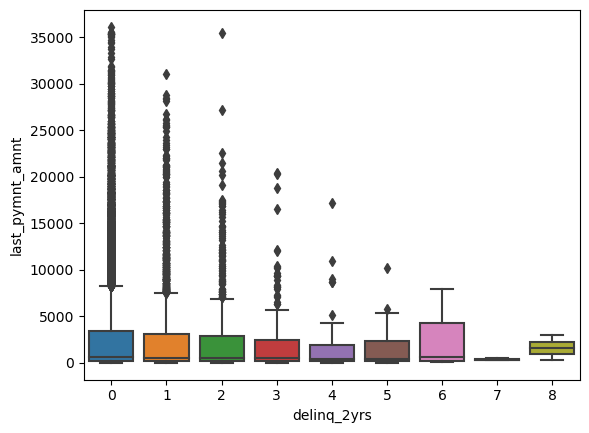

Median: 9600.00
q1: 5300.00
q3: 15000.00
Median: 9500.00
q1: 5043.75
q3: 15000.00
Median: 9600.00
q1: 5000.00
q3: 15000.00
Median: 9000.00
q1: 5000.00
q3: 14400.00
Median: 10150.00
q1: 6700.00
q3: 18000.00
Median: 11000.00
q1: 6000.00
q3: 18125.00
Median: 10000.00
q1: 7000.00
q3: 20000.00
Median: 10000.00
q1: 7750.00
q3: 16000.00
Median: 14000.00
q1: 5150.00
q3: 21250.00


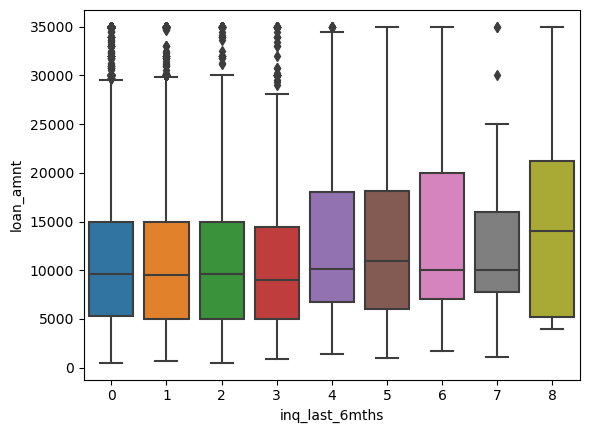

Median: 10.99
q1: 7.90
q3: 13.49
Median: 12.42
q1: 9.91
q3: 14.79
Median: 12.84
q1: 10.25
q3: 15.23
Median: 12.99
q1: 10.38
q3: 15.27
Median: 9.99
q1: 7.81
q3: 11.99
Median: 11.14
q1: 8.49
q3: 13.23
Median: 12.57
q1: 10.62
q3: 14.65
Median: 13.23
q1: 12.23
q3: 14.65
Median: 15.28
q1: 12.85
q3: 16.34


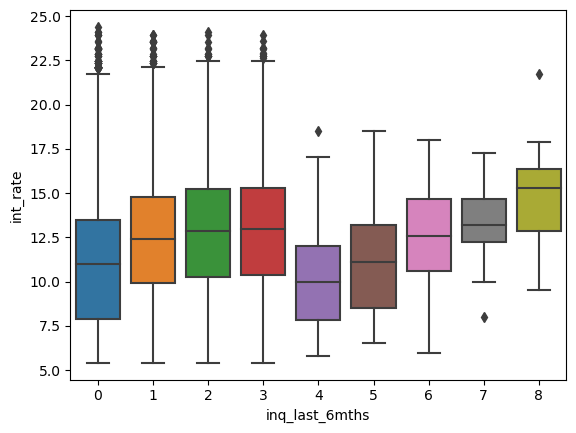

Median: 276.30
q1: 164.86
q3: 419.84
Median: 275.37
q1: 165.45
q3: 417.22
Median: 272.77
q1: 163.86
q3: 421.84
Median: 269.07
q1: 162.69
q3: 404.68
Median: 312.81
q1: 188.56
q3: 487.25
Median: 312.91
q1: 187.18
q3: 514.62
Median: 315.12
q1: 207.23
q3: 567.88
Median: 322.71
q1: 235.03
q3: 509.53
Median: 409.02
q1: 158.17
q3: 639.85


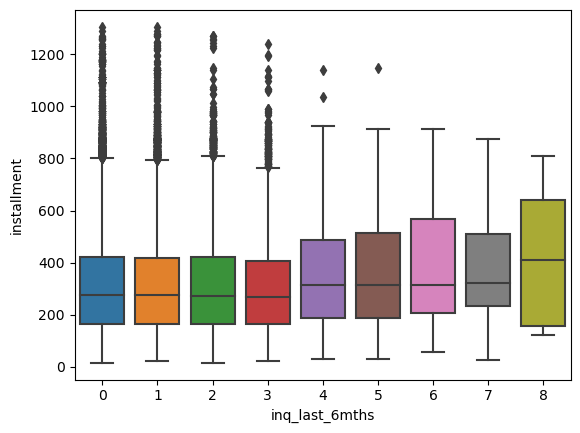

Median: 56787.50
q1: 40000.00
q3: 80000.00
Median: 57000.00
q1: 40000.00
q3: 80000.00
Median: 60000.00
q1: 41750.00
q3: 81528.00
Median: 60000.00
q1: 41100.00
q3: 82000.00
Median: 65000.00
q1: 47970.00
q3: 91000.00
Median: 64992.00
q1: 45000.00
q3: 89000.00
Median: 71802.00
q1: 45250.00
q3: 102000.00
Median: 69000.00
q1: 41000.00
q3: 81000.00
Median: 60000.00
q1: 34500.00
q3: 82100.00


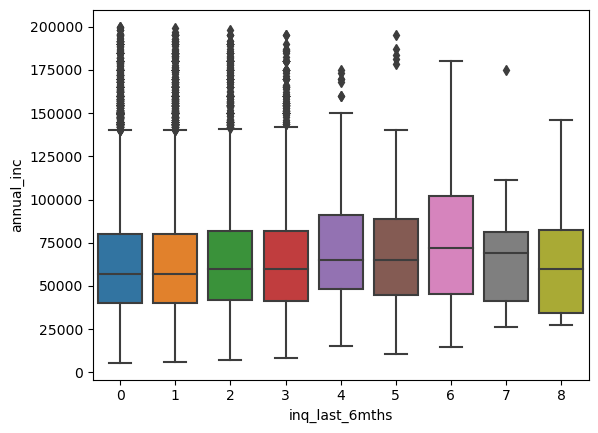

Median: 13.27
q1: 8.05
q3: 18.50
Median: 13.55
q1: 8.36
q3: 18.77
Median: 13.82
q1: 8.64
q3: 18.68
Median: 13.81
q1: 8.86
q3: 19.03
Median: 11.97
q1: 7.18
q3: 17.02
Median: 11.13
q1: 5.51
q3: 15.88
Median: 12.68
q1: 6.71
q3: 16.46
Median: 7.52
q1: 3.08
q3: 13.81
Median: 12.28
q1: 4.17
q3: 18.53


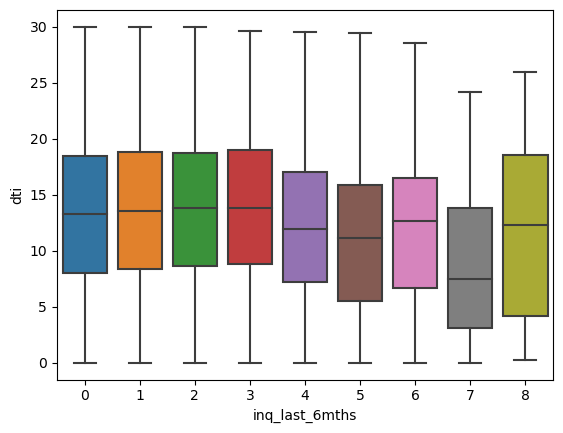

Median: 8.00
q1: 6.00
q3: 11.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 7.00
q3: 12.00
Median: 9.00
q1: 7.00
q3: 13.00
Median: 9.00
q1: 7.00
q3: 12.50
Median: 9.00
q1: 6.00
q3: 13.00
Median: 10.00
q1: 7.00
q3: 14.00
Median: 8.00
q1: 6.00
q3: 14.00
Median: 10.50
q1: 6.25
q3: 13.25


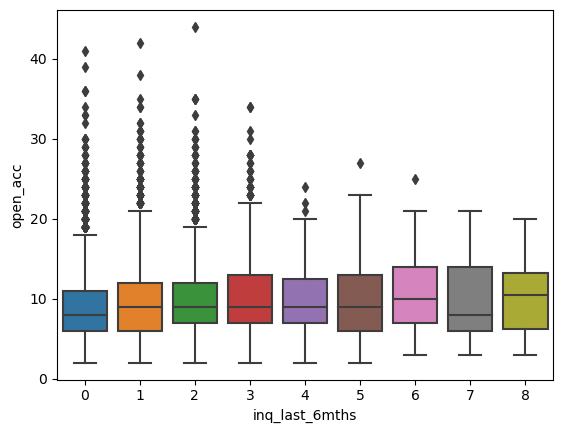

Median: 8879.00
q1: 3745.00
q3: 16810.75
Median: 8810.00
q1: 3742.50
q3: 16736.50
Median: 8370.00
q1: 3577.75
q3: 16658.75
Median: 7939.00
q1: 3124.00
q3: 15571.50
Median: 6204.00
q1: 1944.50
q3: 13883.00
Median: 5999.00
q1: 2166.50
q3: 12117.50
Median: 5158.00
q1: 432.00
q3: 16366.25
Median: 4938.00
q1: 1479.00
q3: 13631.00
Median: 6253.50
q1: 1652.75
q3: 30105.00


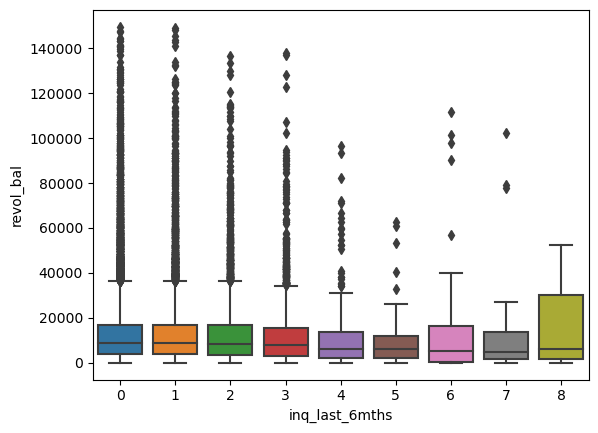

Median: 50.20
q1: 25.80
q3: 73.60
Median: 49.80
q1: 26.40
q3: 71.70
Median: 48.05
q1: 25.27
q3: 71.20
Median: 46.70
q1: 24.00
q3: 69.50
Median: 22.80
q1: 8.55
q3: 38.20
Median: 21.50
q1: 8.55
q3: 33.80
Median: 17.50
q1: 3.38
q3: 31.25
Median: 17.50
q1: 7.10
q3: 35.60
Median: 11.45
q1: 7.92
q3: 46.35


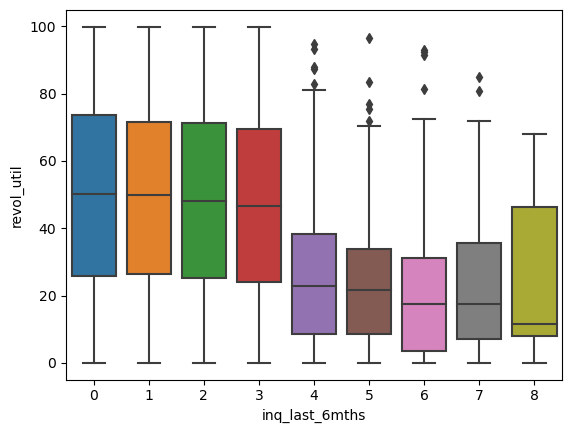

Median: 19.00
q1: 13.00
q3: 27.00
Median: 21.00
q1: 14.00
q3: 29.00
Median: 22.00
q1: 14.00
q3: 30.00
Median: 23.00
q1: 15.00
q3: 32.00
Median: 25.00
q1: 16.00
q3: 34.50
Median: 25.00
q1: 16.50
q3: 36.50
Median: 26.50
q1: 19.00
q3: 35.00
Median: 26.00
q1: 15.00
q3: 39.00
Median: 26.50
q1: 19.25
q3: 32.75


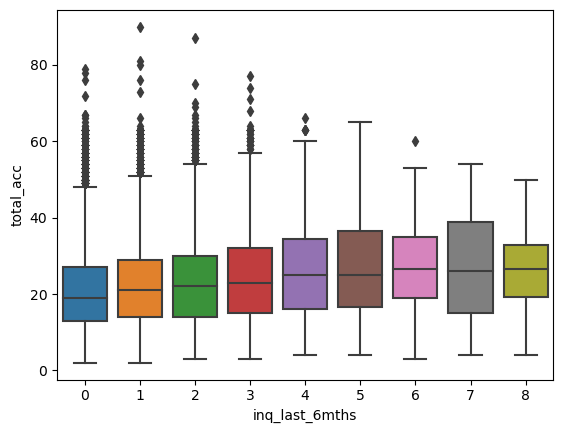

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


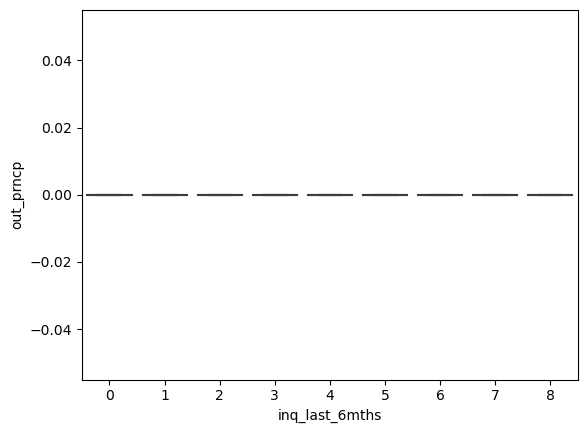

Median: 9815.99
q1: 5608.20
q3: 16089.82
Median: 9436.31
q1: 5405.49
q3: 15668.96
Median: 9249.91
q1: 5321.10
q3: 15794.30
Median: 8804.70
q1: 4801.44
q3: 14729.70
Median: 11163.54
q1: 6008.78
q3: 17775.64
Median: 10610.85
q1: 5801.88
q3: 16706.60
Median: 9881.77
q1: 5895.41
q3: 21223.06
Median: 9653.63
q1: 6488.94
q3: 15637.20
Median: 14486.11
q1: 5955.74
q3: 20012.68


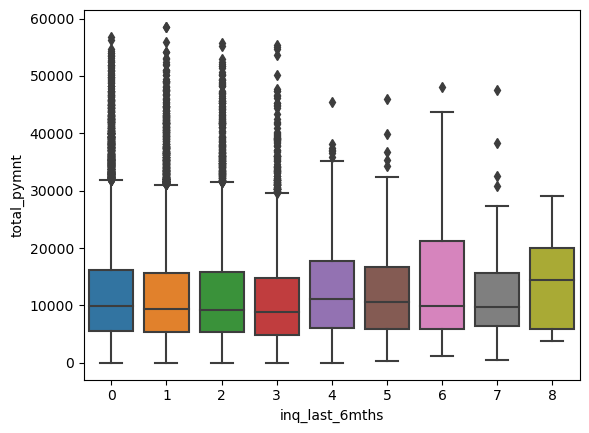

Median: 8000.00
q1: 4800.00
q3: 13250.00
Median: 8000.00
q1: 4200.00
q3: 12720.88
Median: 7750.00
q1: 4000.00
q3: 12800.00
Median: 7200.00
q1: 3643.02
q3: 12000.00
Median: 9700.00
q1: 5000.00
q3: 15000.00
Median: 8000.00
q1: 4950.00
q3: 14450.00
Median: 8529.83
q1: 4305.61
q3: 17904.37
Median: 8000.00
q1: 6000.00
q3: 12000.00
Median: 8418.01
q1: 5000.00
q3: 14250.00


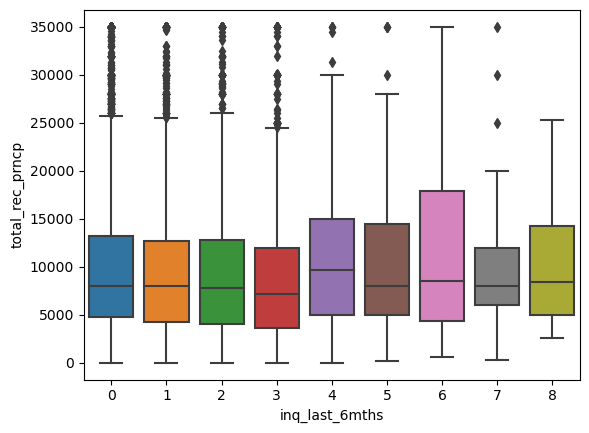

Median: 1254.02
q1: 622.52
q3: 2547.39
Median: 1306.49
q1: 657.44
q3: 2673.66
Median: 1346.80
q1: 656.88
q3: 2776.83
Median: 1282.84
q1: 630.62
q3: 2636.31
Median: 1241.09
q1: 612.26
q3: 2812.07
Median: 1275.10
q1: 649.66
q3: 2614.44
Median: 1462.37
q1: 660.42
q3: 3669.85
Median: 1433.43
q1: 1106.91
q3: 3092.00
Median: 2877.22
q1: 1207.81
q3: 4611.44


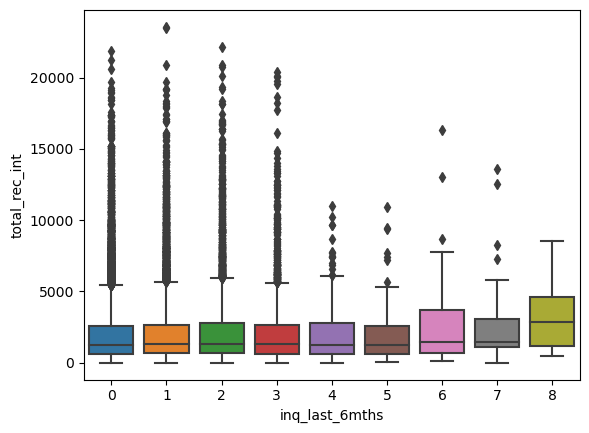

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


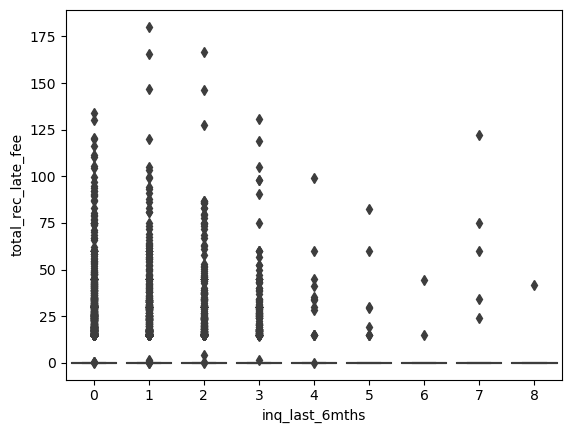

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


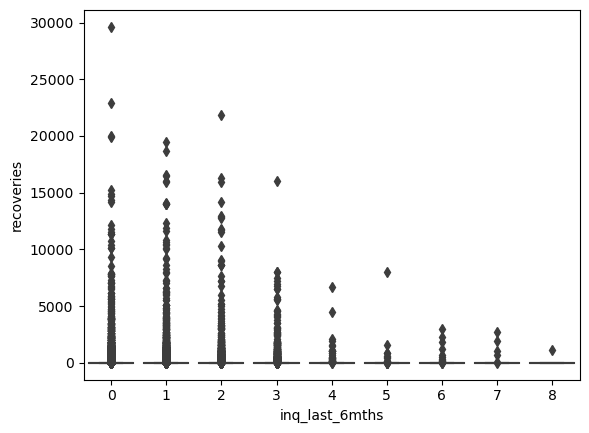

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


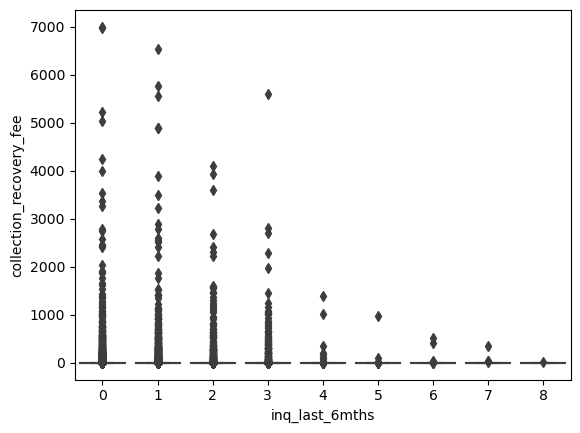

Median: 555.09
q1: 220.92
q3: 3183.43
Median: 561.08
q1: 209.86
q3: 3514.12
Median: 615.24
q1: 217.05
q3: 3776.96
Median: 509.42
q1: 200.75
q3: 3199.41
Median: 640.25
q1: 234.12
q3: 3830.49
Median: 945.98
q1: 344.91
q3: 5152.09
Median: 853.68
q1: 236.57
q3: 7338.13
Median: 1112.44
q1: 287.71
q3: 5318.99
Median: 741.57
q1: 264.03
q3: 2701.97


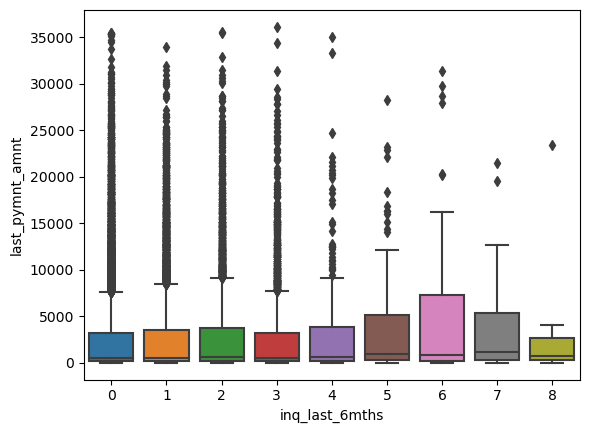

Median: 9600.00
q1: 5325.00
q3: 15000.00
Median: 8000.00
q1: 5000.00
q3: 12500.00


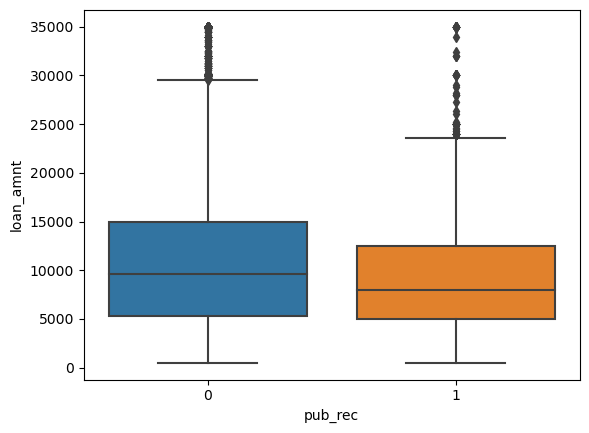

Median: 11.71
q1: 8.90
q3: 14.27
Median: 13.30
q1: 11.12
q3: 15.58


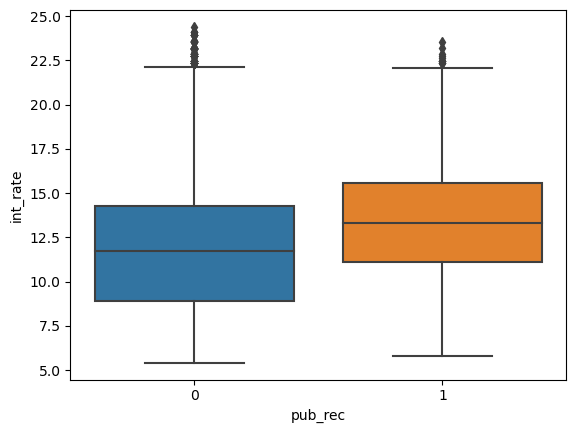

Median: 276.91
q1: 165.68
q3: 423.46
Median: 248.82
q1: 157.34
q3: 364.94


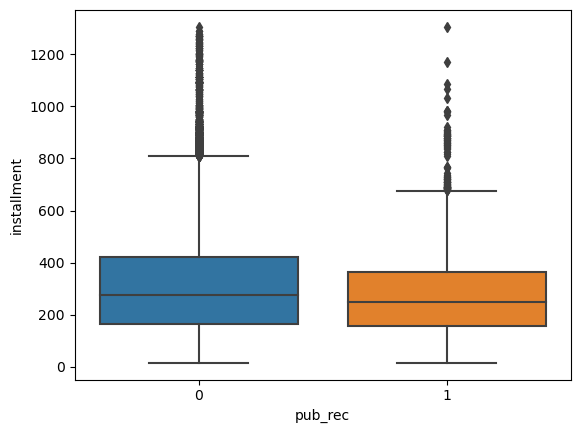

Median: 57996.00
q1: 40000.00
q3: 80000.00
Median: 56700.00
q1: 40000.00
q3: 76000.00


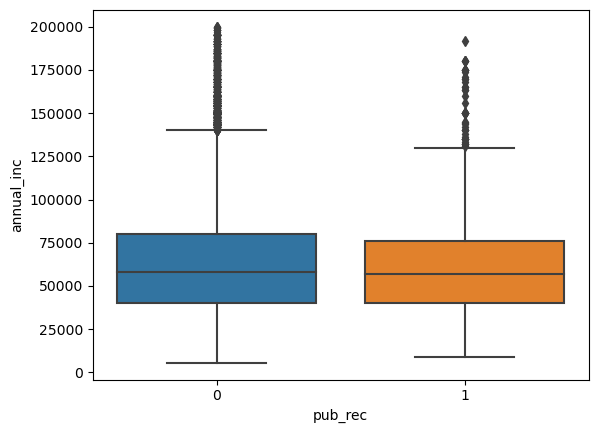

Median: 13.47
q1: 8.23
q3: 18.64
Median: 13.50
q1: 8.46
q3: 18.37


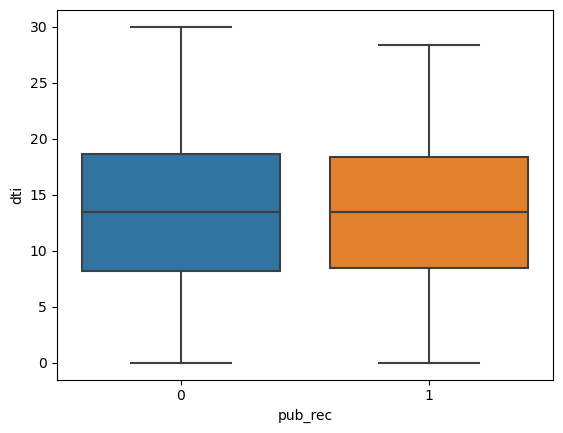

Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00


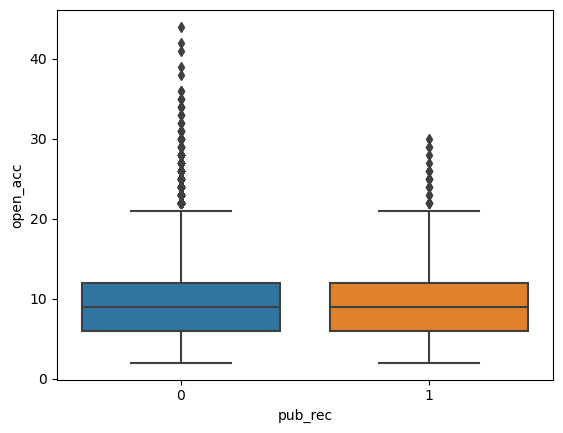

Median: 8794.00
q1: 3629.00
q3: 16941.00
Median: 7216.00
q1: 3623.00
q3: 12130.00


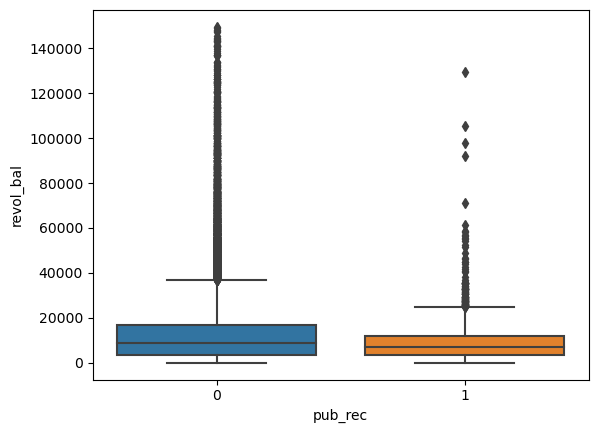

Median: 48.60
q1: 24.70
q3: 71.80
Median: 58.20
q1: 36.40
q3: 77.90


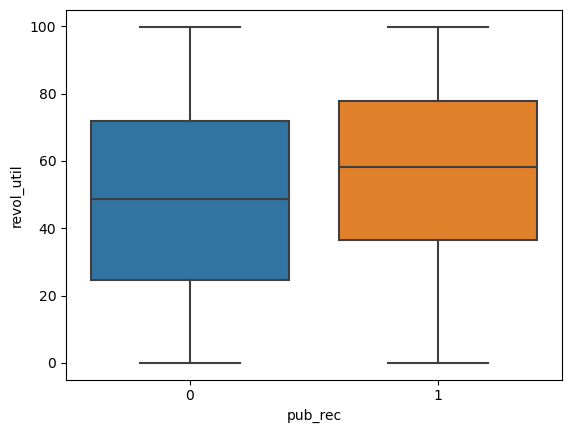

Median: 20.00
q1: 13.00
q3: 29.00
Median: 20.00
q1: 14.00
q3: 26.00


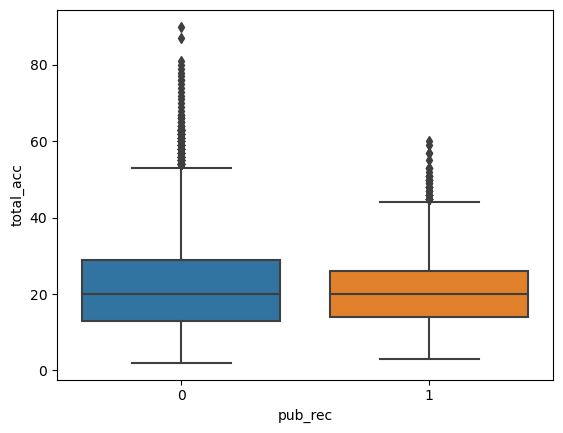

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


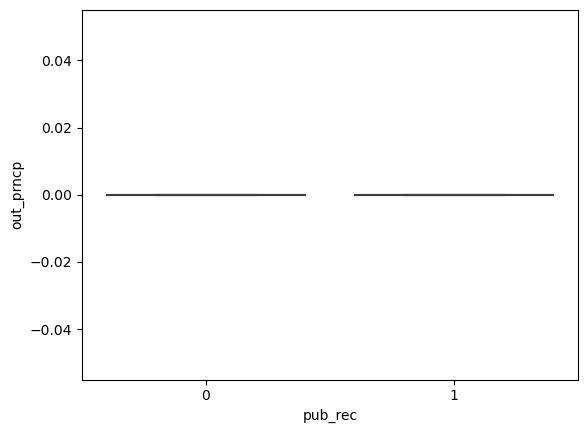

Median: 9663.91
q1: 5520.38
q3: 16006.45
Median: 7841.27
q1: 4660.54
q3: 13504.09


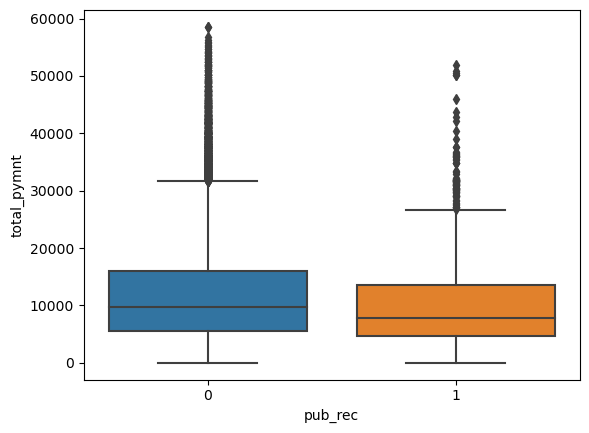

Median: 8000.00
q1: 4500.00
q3: 13000.00
Median: 6000.00
q1: 3434.51
q3: 10589.97


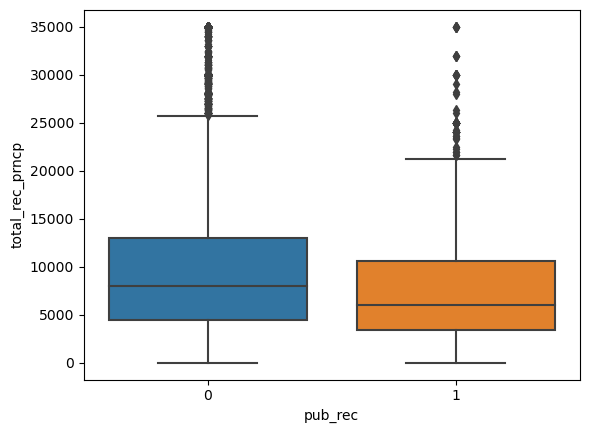

Median: 1282.78
q1: 635.27
q3: 2633.30
Median: 1311.70
q1: 679.68
q3: 2569.66


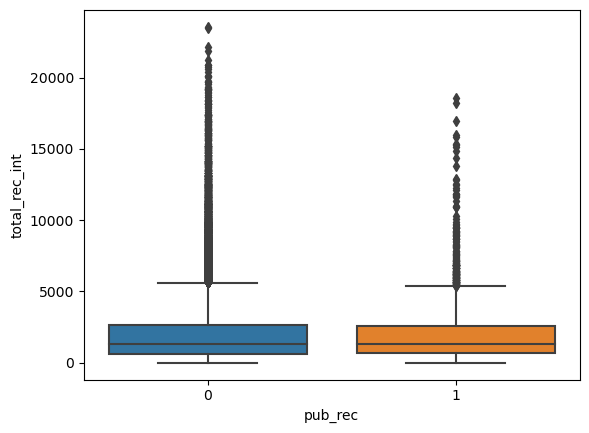

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


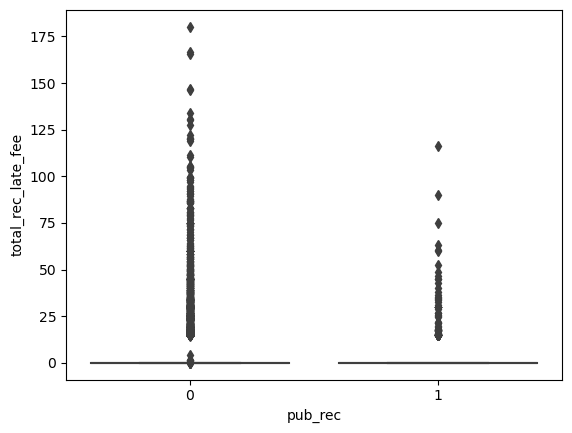

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


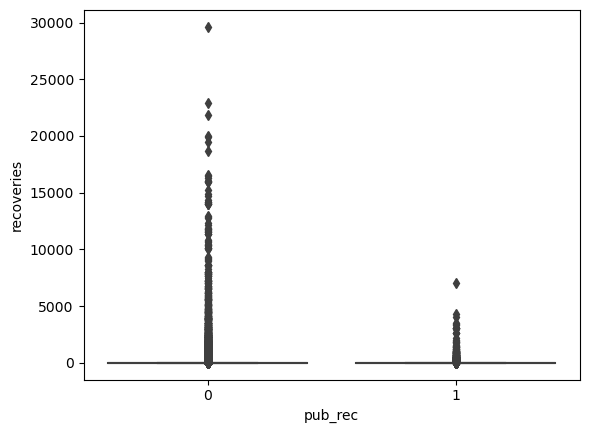

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


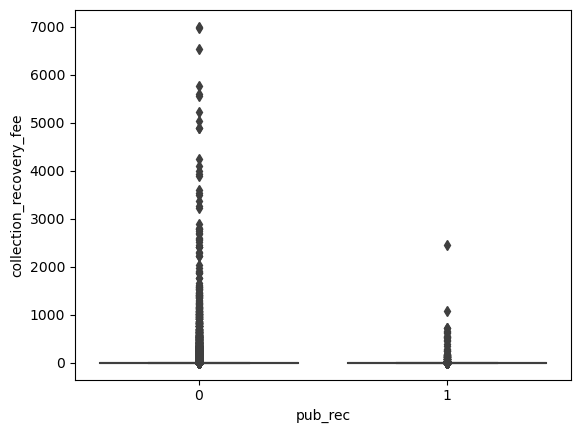

Median: 569.30
q1: 218.08
q3: 3423.95
Median: 404.68
q1: 180.95
q3: 2805.07


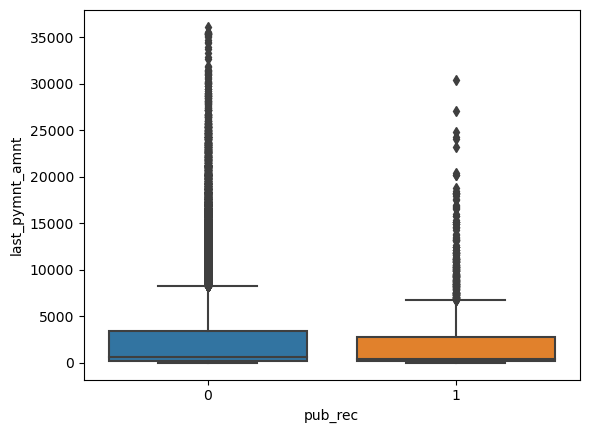

Median: 9600.00
q1: 5300.00
q3: 15000.00
Median: 8400.00
q1: 5000.00
q3: 13000.00


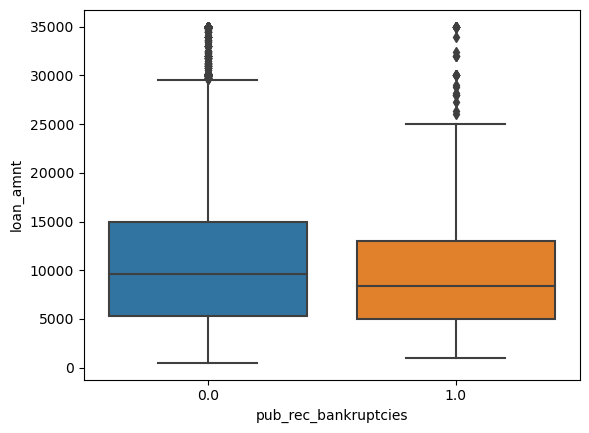

Median: 11.71
q1: 8.90
q3: 14.35
Median: 13.23
q1: 10.99
q3: 15.58


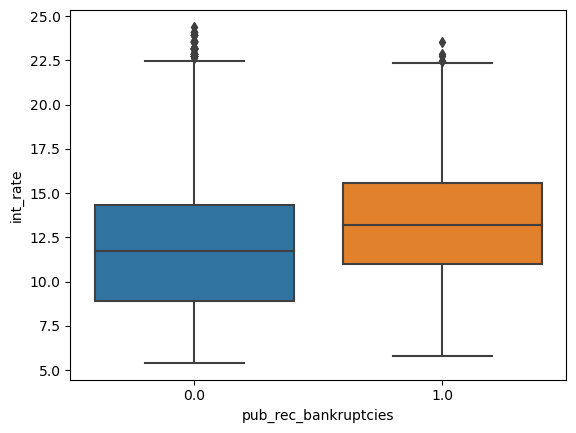

Median: 276.06
q1: 165.58
q3: 421.89
Median: 259.53
q1: 160.84
q3: 374.47


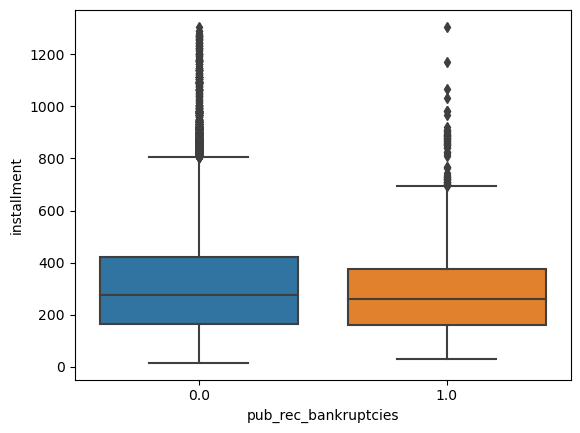

Median: 57996.00
q1: 40000.00
q3: 80000.00
Median: 57408.00
q1: 40800.00
q3: 77000.00


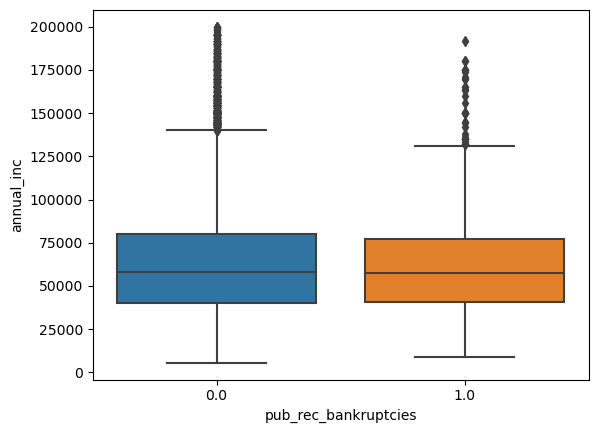

Median: 13.50
q1: 8.28
q3: 18.67
Median: 13.77
q1: 8.82
q3: 18.53


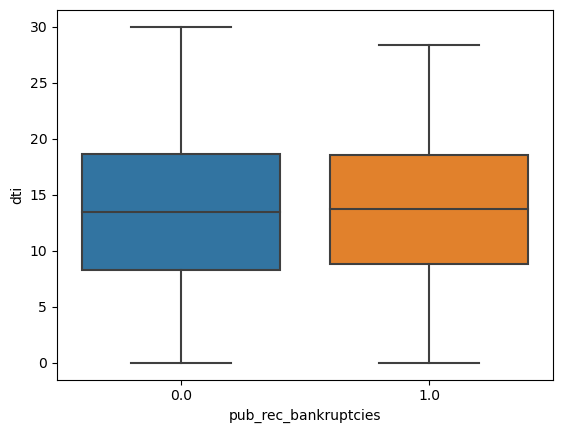

Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00


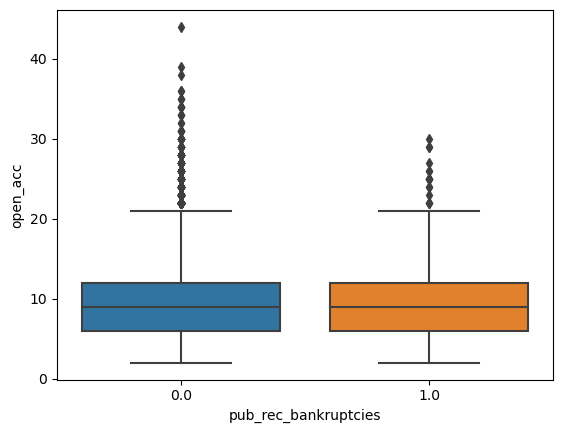

Median: 8764.00
q1: 3626.00
q3: 16879.00
Median: 7507.00
q1: 3970.00
q3: 12445.00


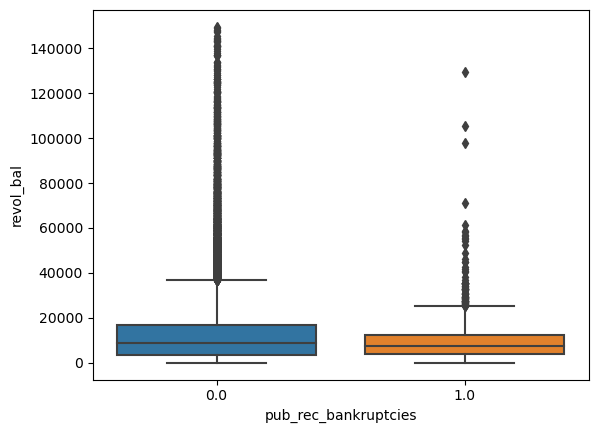

Median: 48.80
q1: 24.90
q3: 72.00
Median: 58.90
q1: 38.27
q3: 78.10


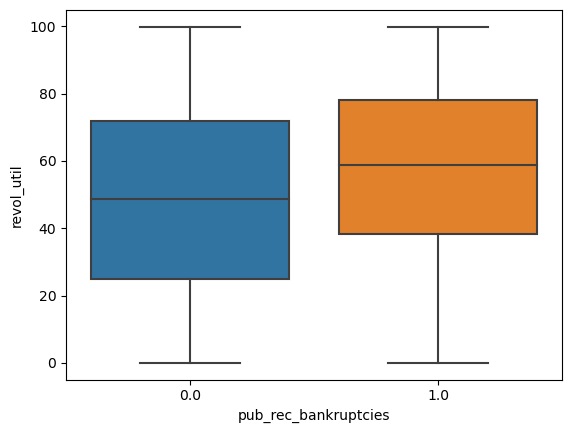

Median: 20.00
q1: 13.00
q3: 29.00
Median: 20.00
q1: 15.00
q3: 27.00


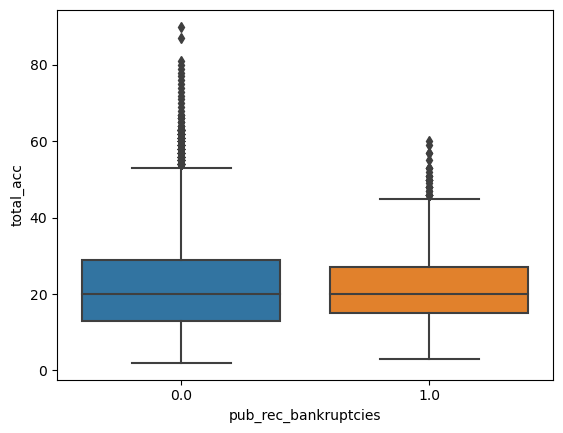

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


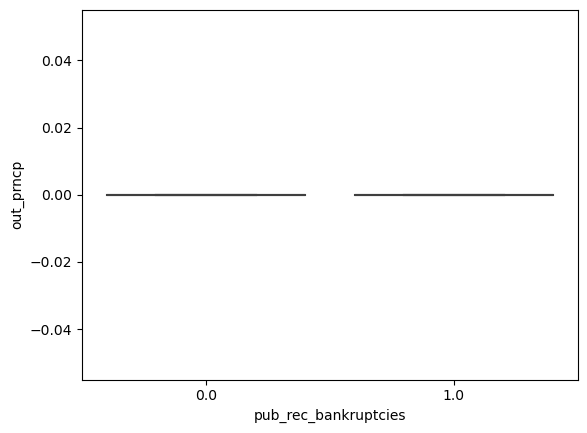

Median: 9654.22
q1: 5513.40
q3: 16015.86
Median: 8177.89
q1: 4747.83
q3: 13960.81


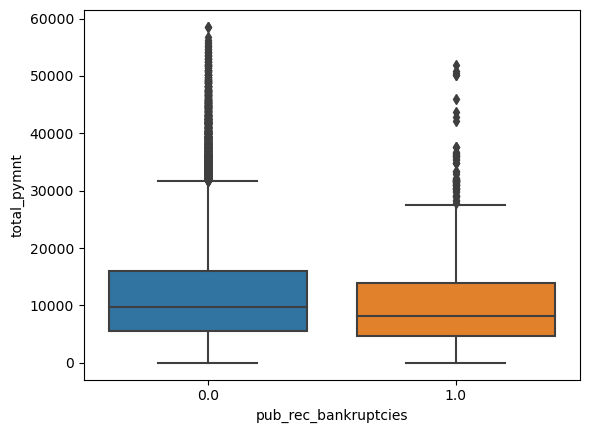

Median: 8000.00
q1: 4500.00
q3: 13000.00
Median: 6500.00
q1: 3500.00
q3: 11000.00


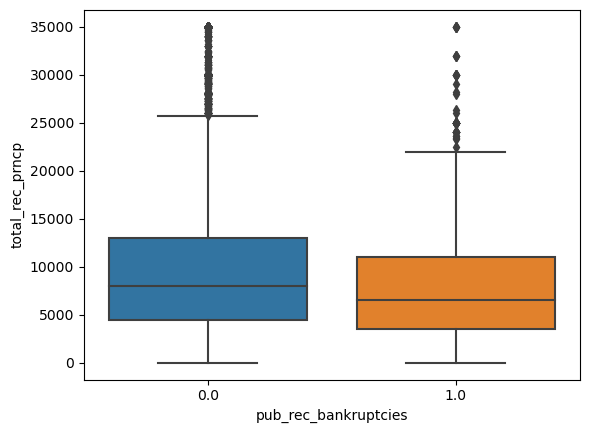

Median: 1283.96
q1: 637.30
q3: 2649.24
Median: 1335.09
q1: 687.98
q3: 2619.61


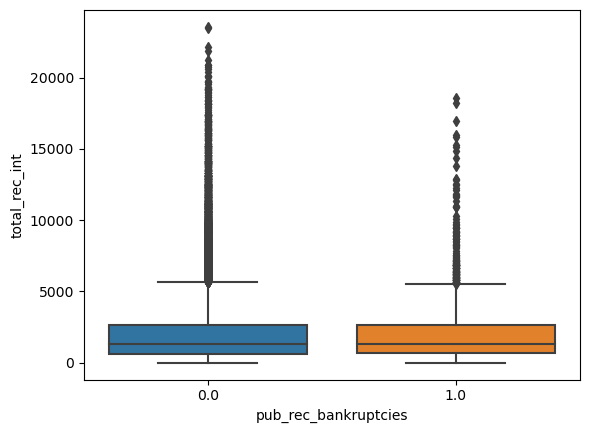

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


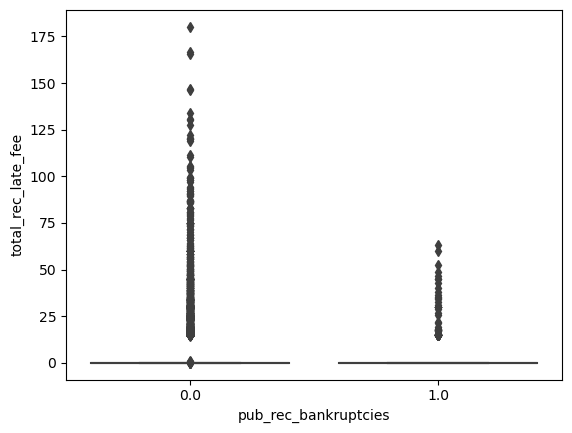

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


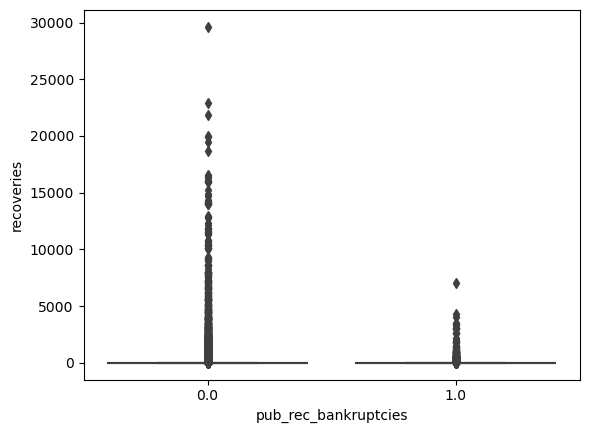

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


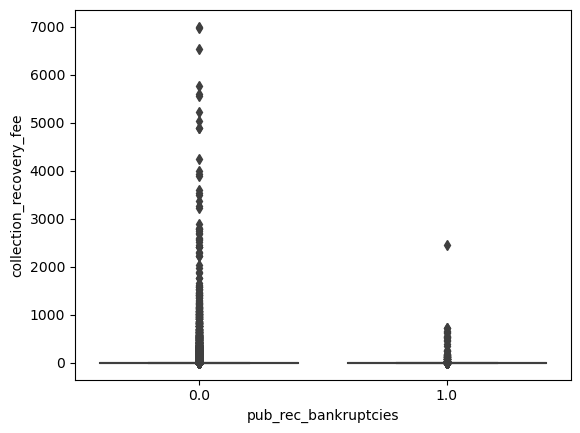

Median: 572.46
q1: 218.67
q3: 3450.56
Median: 429.12
q1: 183.80
q3: 3180.13


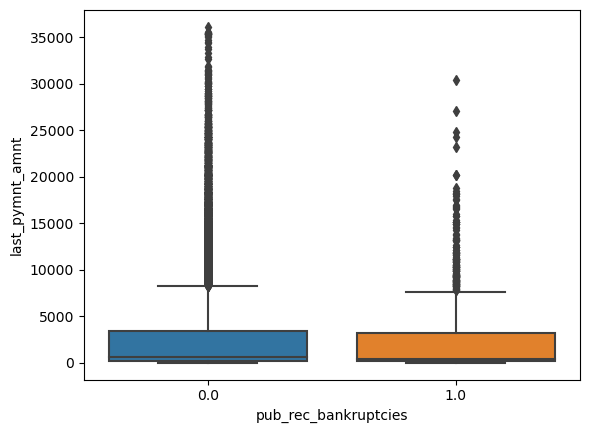

In [11]:
# categorical vs numerical column bivariate analysis
for col1 in cat_cols:
    df = df.sort_values(by=col1)
    for col2 in num_cols:
        sns.boxplot(x=df[col1], y=df[col2])
        
        # Calculate median and IQR
        medians = df.groupby([col1])[col2].median().values
        q1 = df.groupby([col1])[col2].quantile(0.25).values
        q3 = df.groupby([col1])[col2].quantile(0.75).values

        # Annotate plot with median and IQR values
        for i in range(len(medians)):
            print(f'Median: {medians[i]:.2f}\nq1: {q1[i]:.2f}\nq3: {q3[i]:.2f}')
        
        plt.show()

In [12]:
# function to plot default rate as percentage
def plot_relation_to_loan_status_in_percent(x, df, y = 'loan_status'):
    
    # Calculate percentage of loan status by x
    df1 = df.groupby(x)[y].value_counts(normalize=True)
    df1 = df1.mul(100)
    df1 = df1.rename('loan_status %').reset_index()

    # Plot bar plot
    #plt.figure(figsize=(12, 8))
    #g = sns.catplot(x=x, y='loan_status %', hue=y, kind='bar', data=df1)
    g = sns.catplot(x=x, y='loan_status %', hue=y, kind='bar', data=df1, aspect=1.35, height=8)
    g.ax.set_ylim(0, 100)
    
    # Plot trend line for each category
    means = df1.groupby([x, y]).mean().reset_index()
    for cat in means[y].unique():
        if cat == 'Charged Off':
            subset = means[means[y] == cat]
            x2 = np.arange(len(subset[x]))
            z = np.polyfit(x2, subset['loan_status %'], 1)
            p = np.poly1d(z)
            plt.plot(x2, p(x2), linestyle='--', color='gray')  # Overlay trend line

    # Add percentage labels
    for p in g.ax.patches:
        txt = f'{p.get_height() : .2f}%'
        txt_x = p.get_x() 
        txt_y = p.get_height()
        if np.isfinite(txt_x) and np.isfinite(txt_y):  # Check if position is finite
            g.ax.text(txt_x, txt_y, txt)
        
    plt.show()

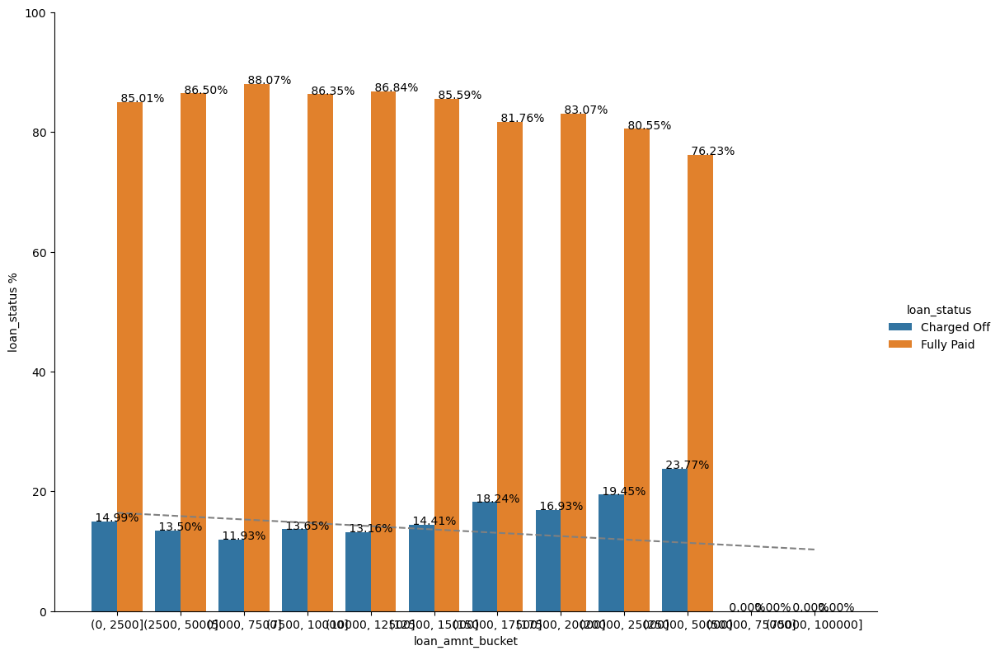

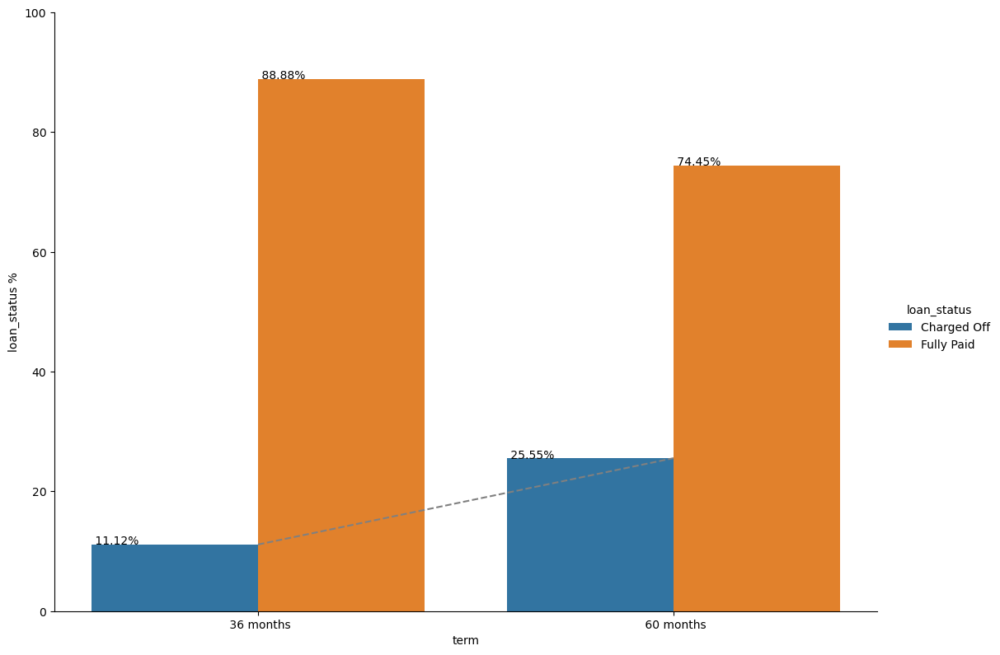

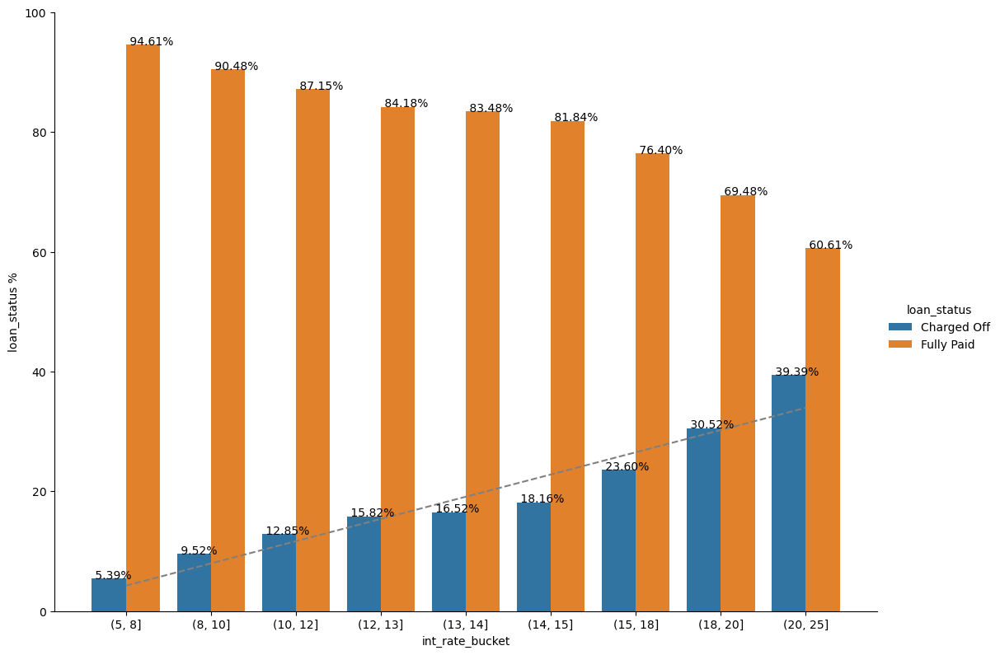

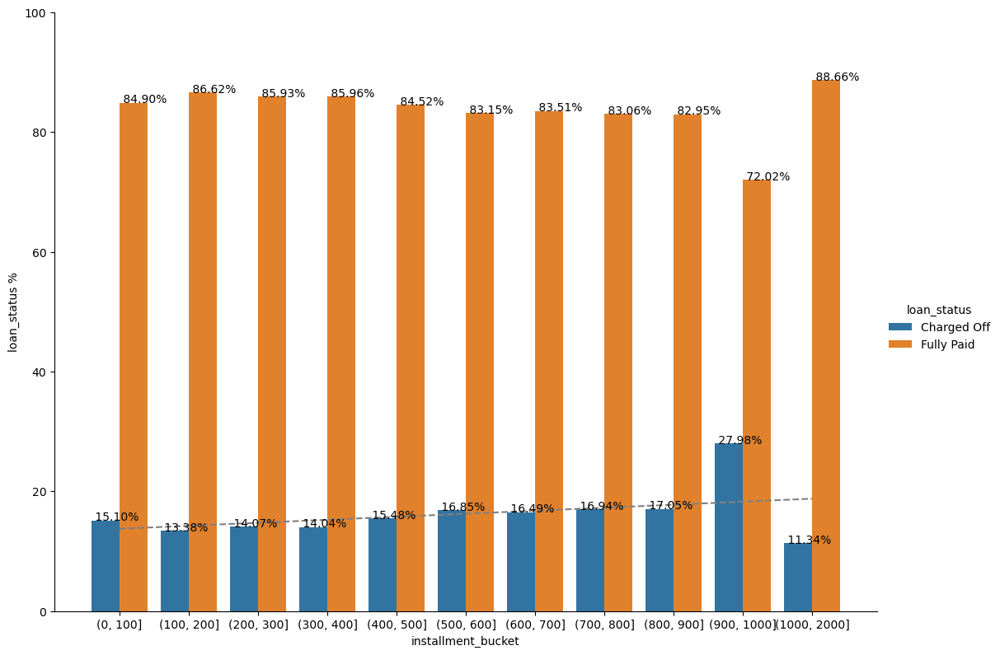

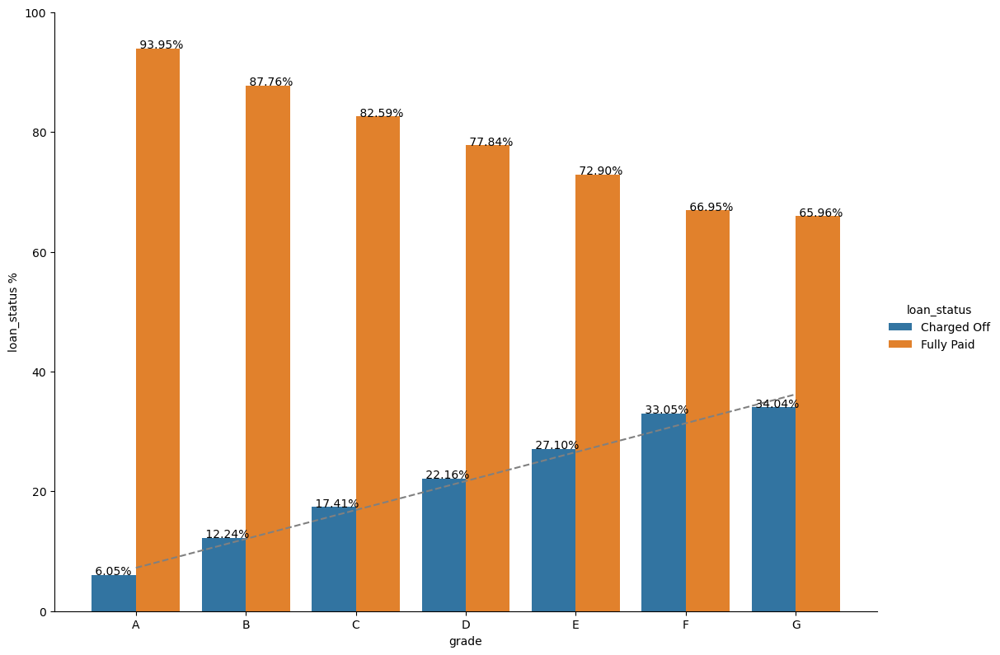

...

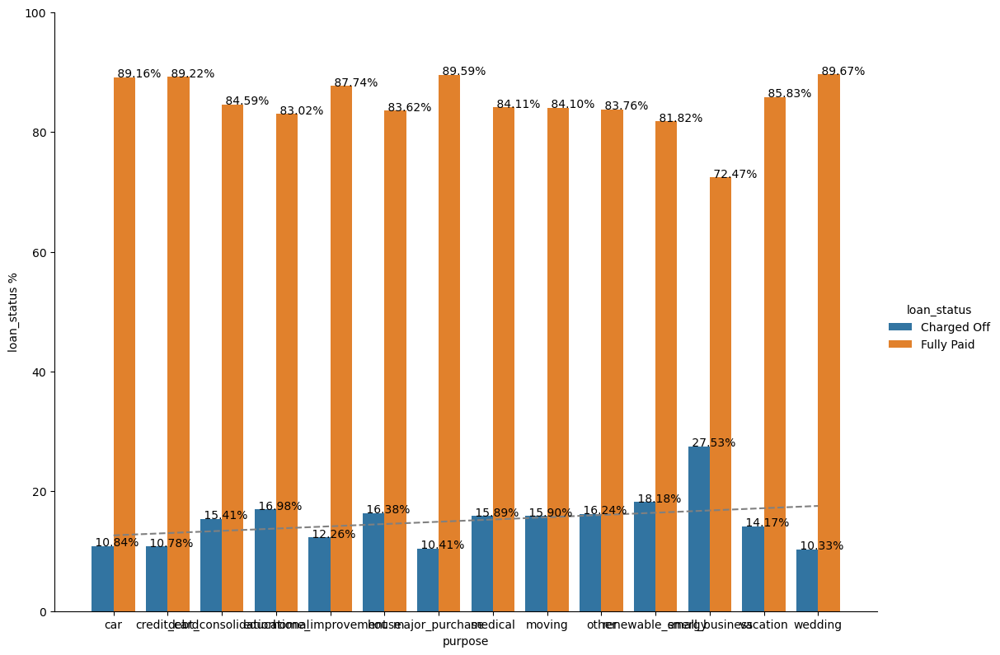

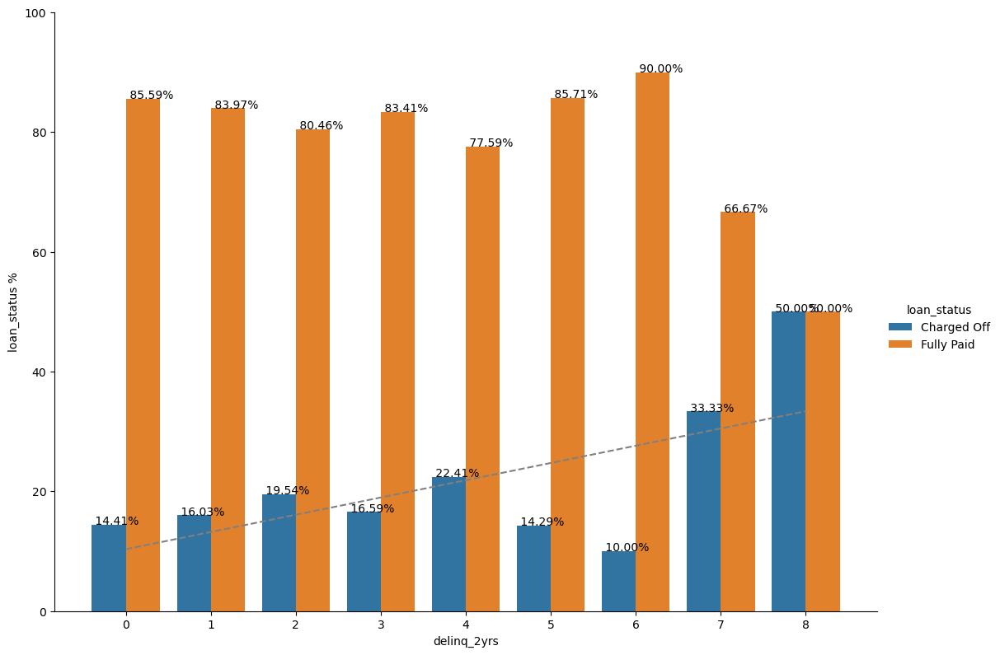

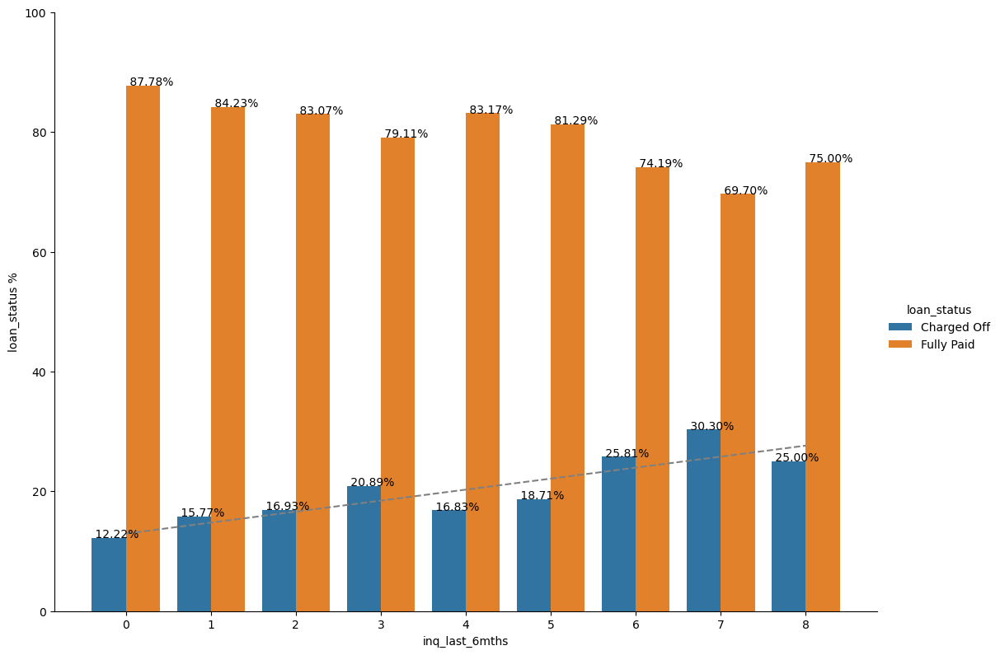

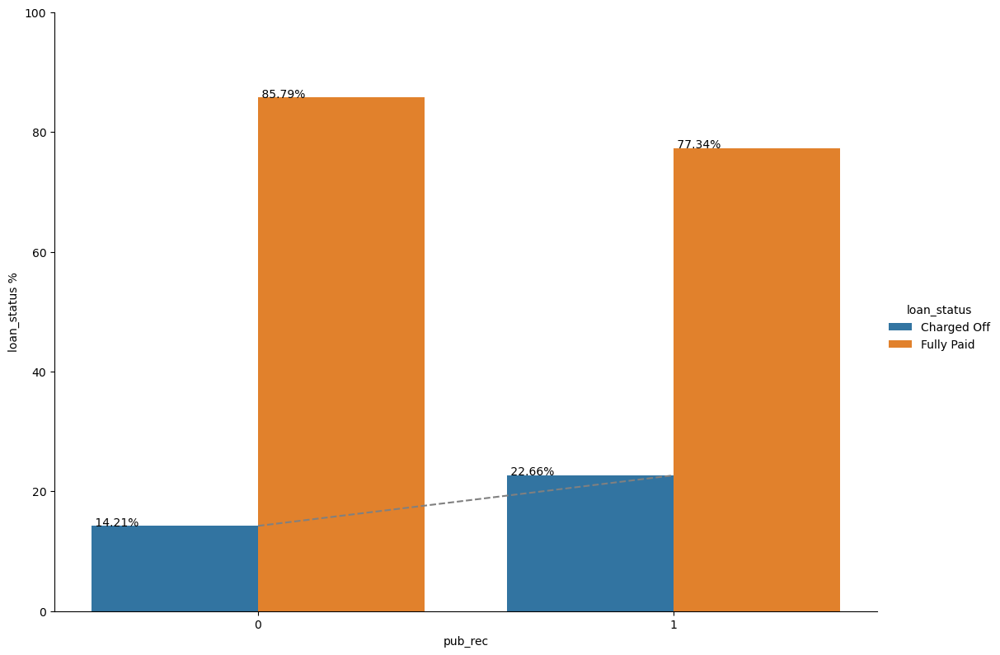

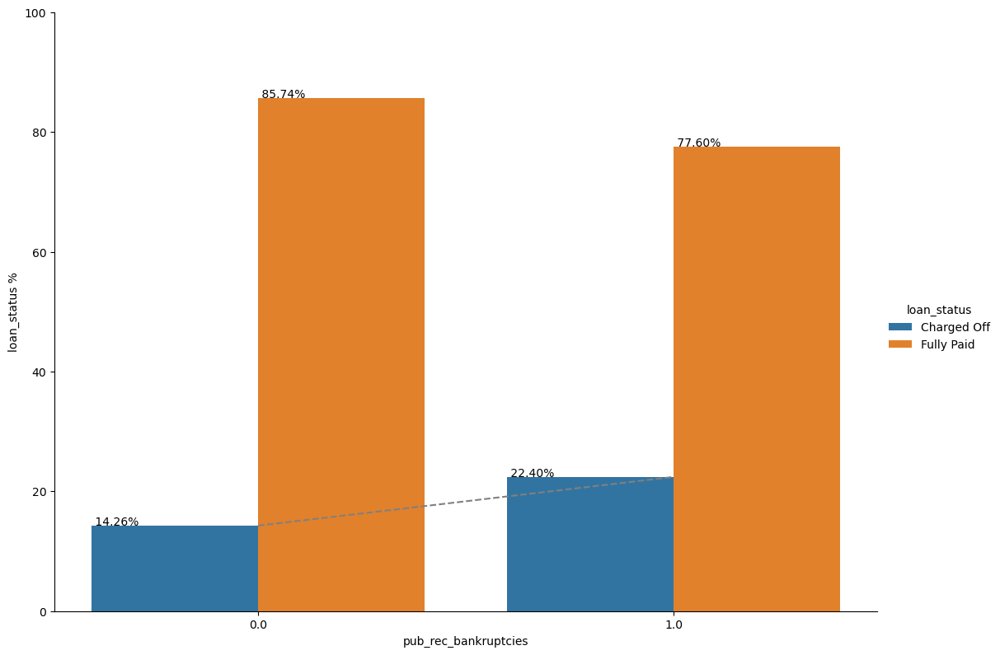

In [13]:
# plot default rate trend against each column
# 28 columns
cols_considered = ['loan_amnt_bucket', 'term', 'int_rate_bucket', 'installment_bucket', 'grade', 'sub_grade', 'emp_length', 
              'home_ownership', 'annual_inc_bucket', 'dti_bucket', 'open_acc_bucket', 'revol_bal_bucket', 
              'revol_util_bucket', 'total_acc_bucket', 'out_prncp_bucket', 'total_pymnt_bucket', 'total_rec_prncp_bucket', 
              'total_rec_int_bucket', 'total_rec_late_fee_bucket', 'recoveries_bucket', 'collection_recovery_fee_bucket', 
              'last_pymnt_amnt_bucket', 'verification_status', 'purpose', 'delinq_2yrs', 'inq_last_6mths', 'pub_rec', 
              'pub_rec_bankruptcies']
# 16 columns
cols_ignored = ['id', 'member_id', 'emp_title', 'url', 'desc', 'title', 'funded_amnt', 'funded_amnt_inv', 'out_prncp_inv', 
                'total_pymnt_inv', 'zip_code', 'addr_state', 'issue_d', 'earliest_cr_line', 'last_pymnt_d', 
                'last_credit_pull_d']

# converted all numeric columns into buckets/categories to ease up analysis
df['loan_amnt_bucket'] = pd.cut(df['loan_amnt'], bins=[0, 2500, 5000, 7500, 10000, 12500, 15000, 17500, 20000, 25000, 50000, 75000, 100000])
df['int_rate_bucket'] = pd.cut(df['int_rate'], bins=[5, 8, 10, 12, 13, 14, 15, 18, 20, 25])
df['installment_bucket'] = pd.cut(df['installment'], bins=[0, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 2000])
df['annual_inc_bucket'] = pd.cut(df['annual_inc'], bins=[10000, 20000, 30000, 40000, 50000, 60000, 70000, 80000, 90000, 100000, 115000, 130000, 150000, 200000, 500000])
df['dti_bucket'] = pd.cut(df['dti'], bins=[0, 5, 8, 10, 12, 13, 14, 15, 18, 20, 25])
df['open_acc_bucket'] = pd.cut(df['open_acc'], 10)
df['revol_bal_bucket'] = pd.cut(df['revol_bal'], bins=[0, 3000, 5000, 7500, 10000, 12500, 15000, 17500, 20000, 25000, 50000, 75000, 100000])
df['revol_util_bucket'] = pd.cut(df['revol_util'], bins=[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100])
df['total_acc_bucket'] = pd.cut(df['total_acc'], bins=[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100])
df['out_prncp_bucket'] = pd.cut(df['out_prncp'], 10)
df['total_pymnt_bucket'] = pd.cut(df['total_pymnt'], 10)
df['total_rec_prncp_bucket'] = pd.cut(df['total_rec_prncp'], 10)
df['total_rec_int_bucket'] = pd.cut(df['total_rec_int'], 10)
df['total_rec_late_fee_bucket'] = pd.cut(df['total_rec_late_fee'], bins=[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200])
df['recoveries_bucket'] = pd.cut(df['recoveries'], bins=[1, 5000, 10000, 15000, 20000, 25000, 50000])
df['collection_recovery_fee_bucket'] = pd.cut(df['collection_recovery_fee'], 10)
df['last_pymnt_amnt_bucket'] = pd.cut(df['last_pymnt_amnt'], bins=[0, 100, 250, 400, 600, 800, 1000, 2000, 3000, 4000, 5000, 10000, 20000, 30000, 40000, 50000, 100000])

for col in cols_considered:
    plot_relation_to_loan_status_in_percent(col, df)

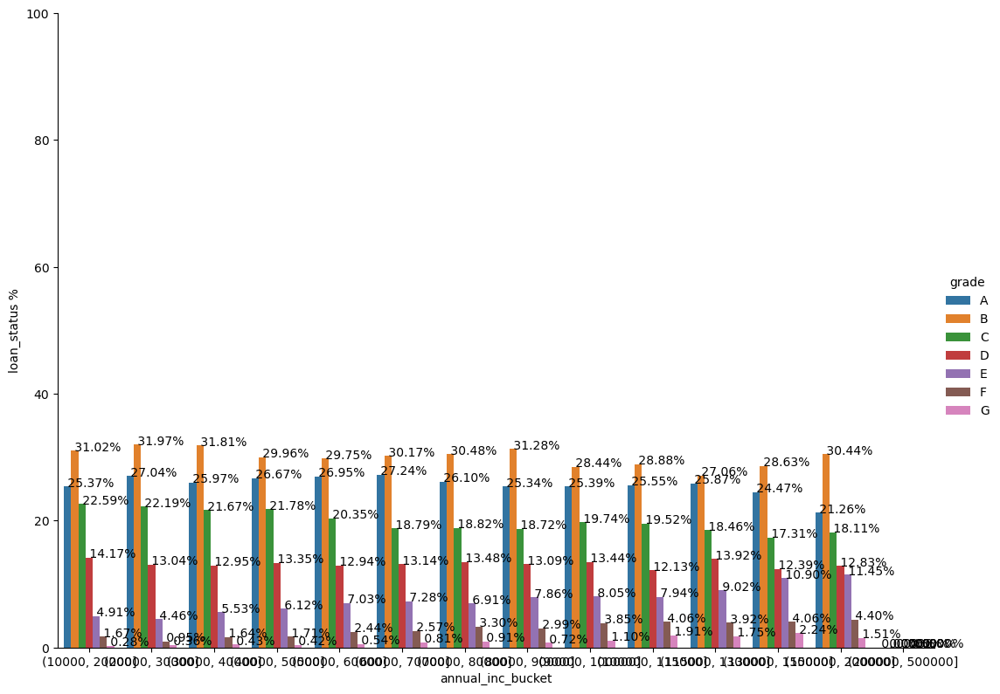

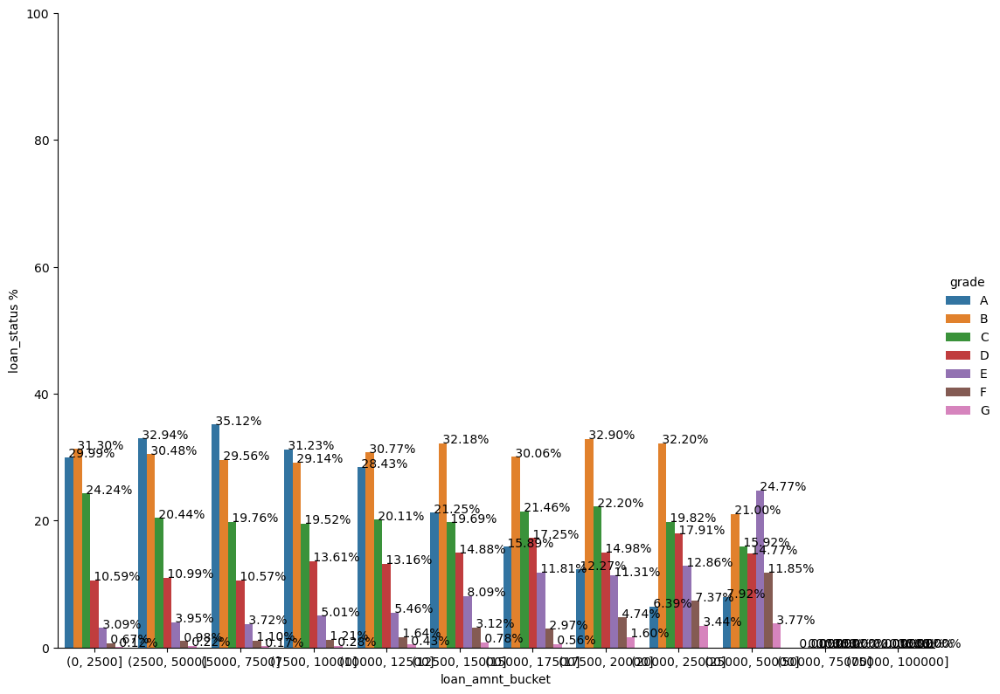

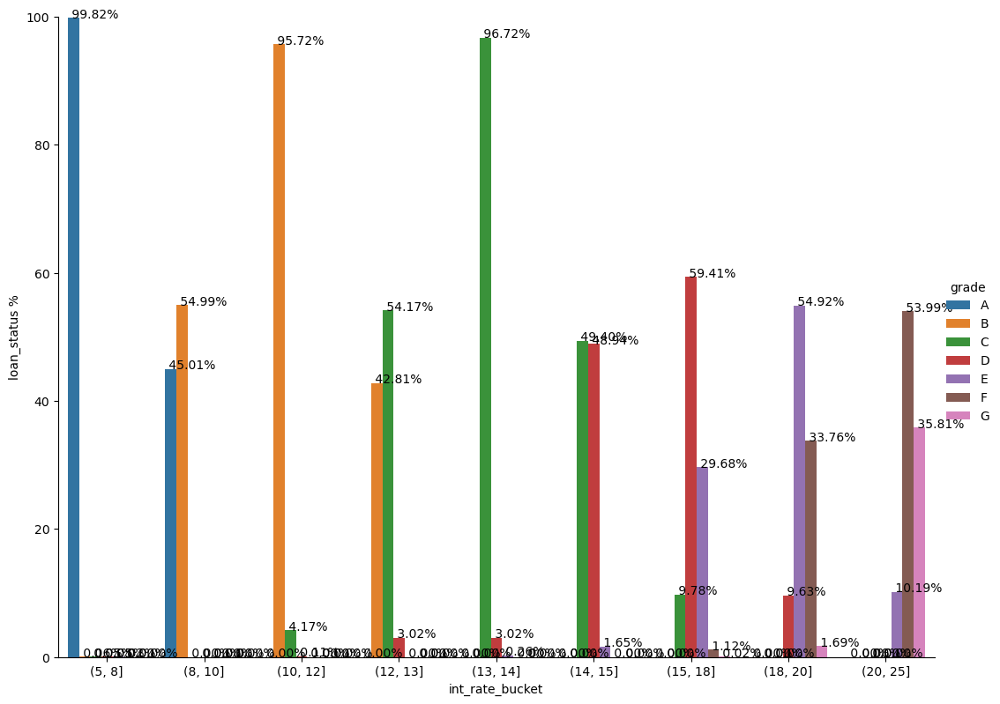

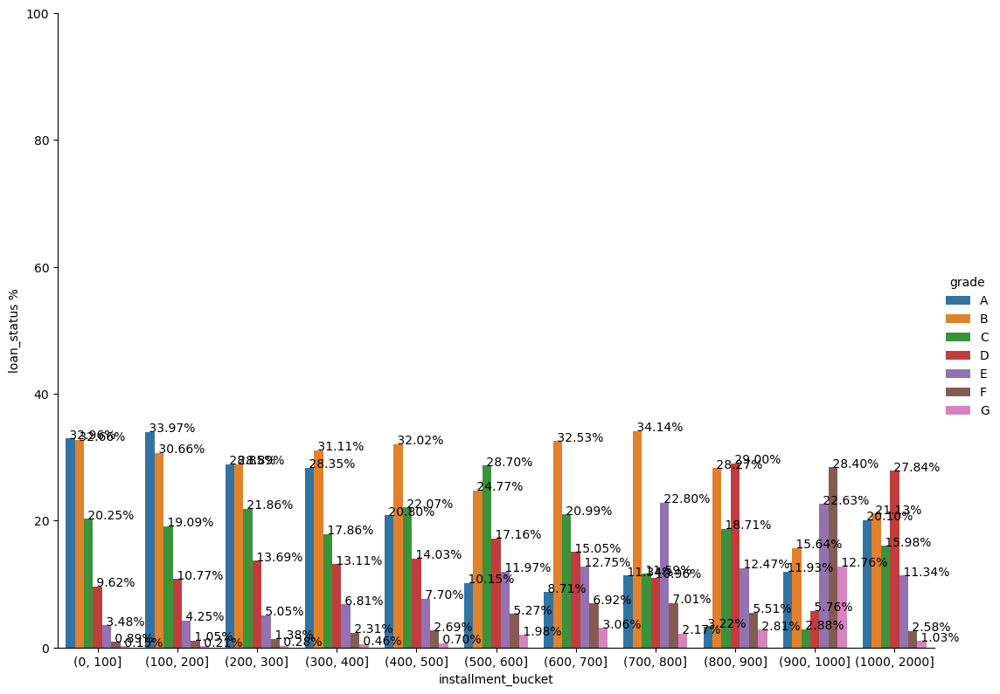

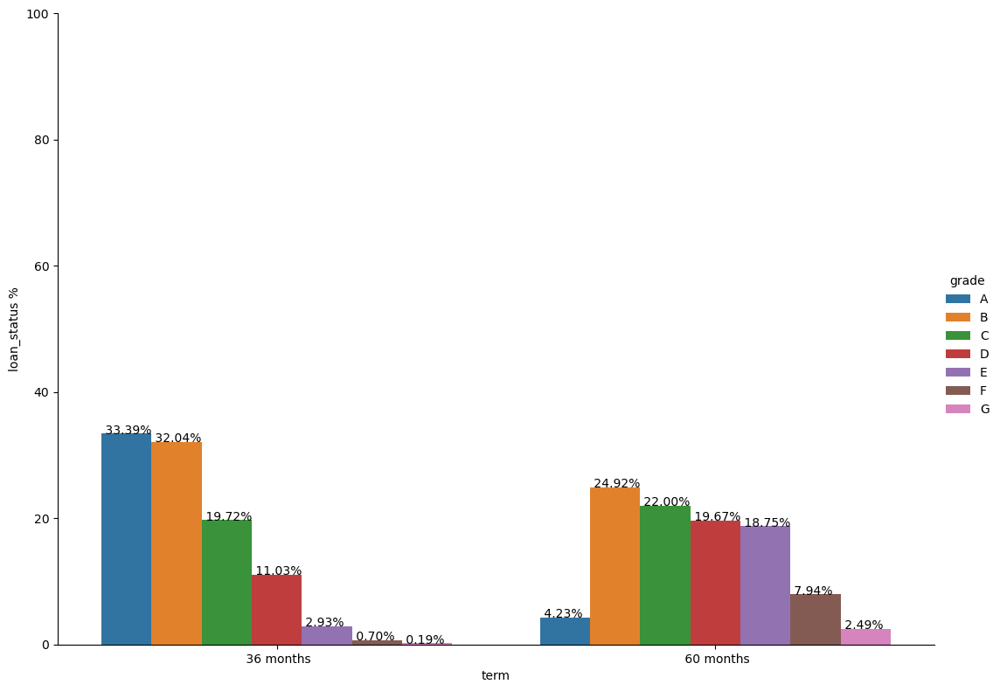

...

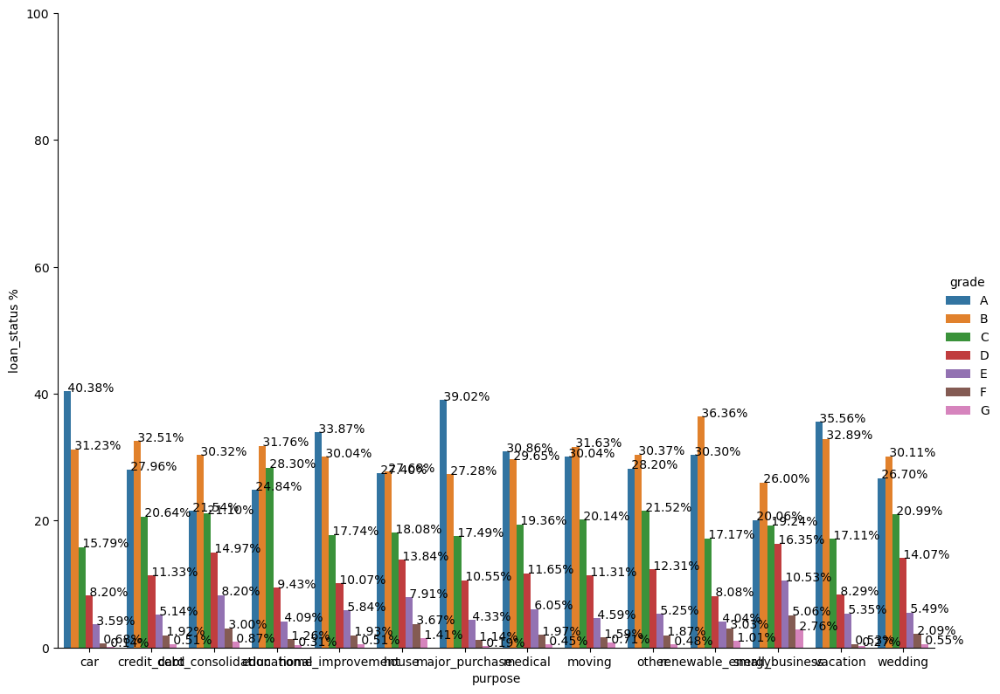

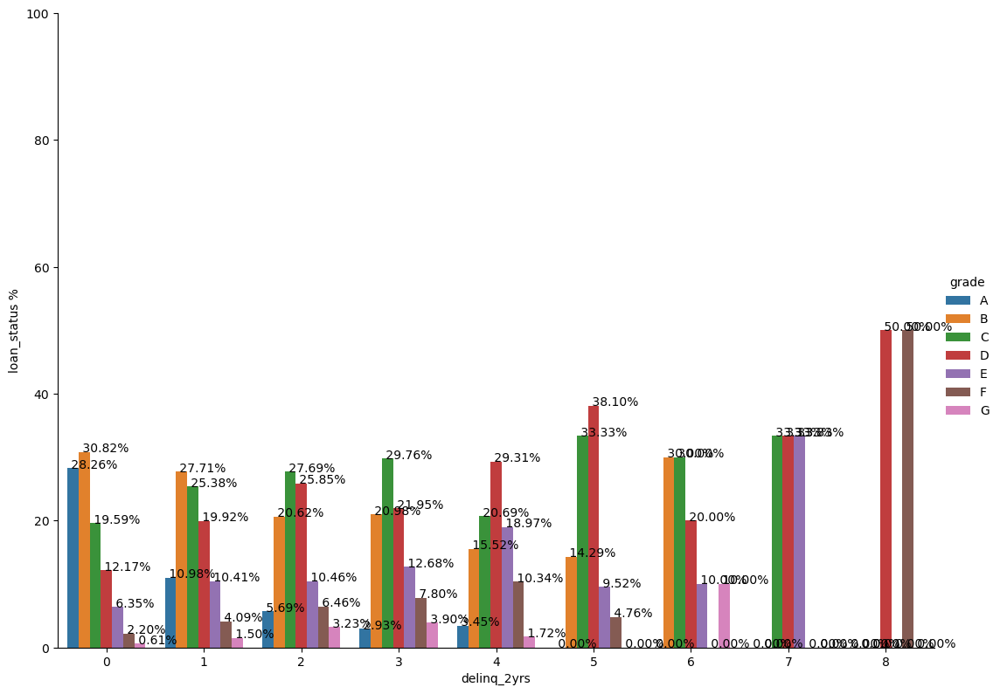

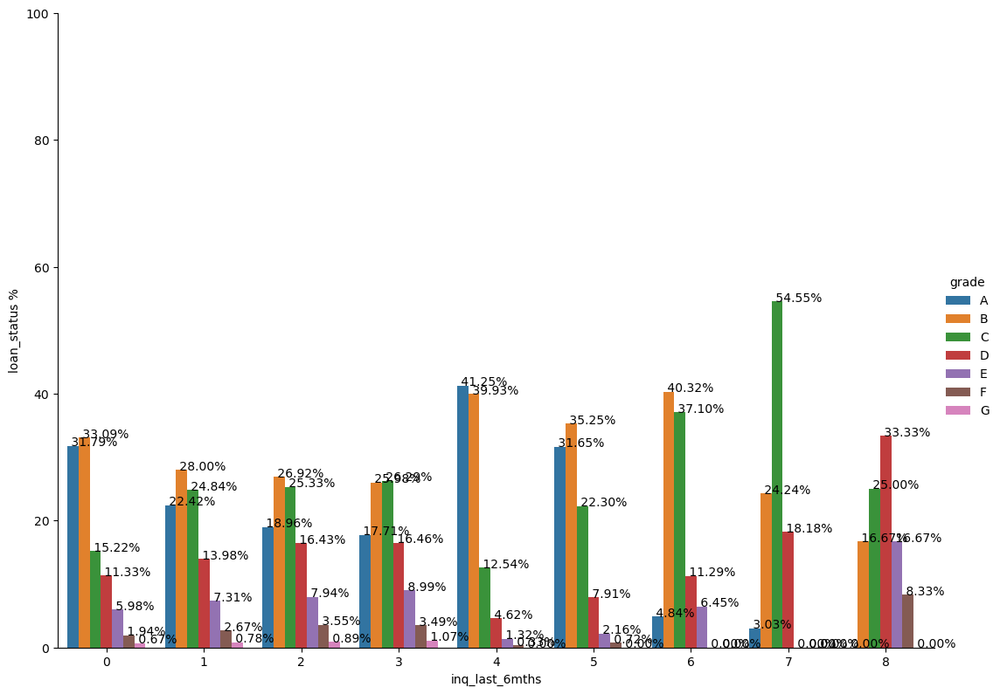

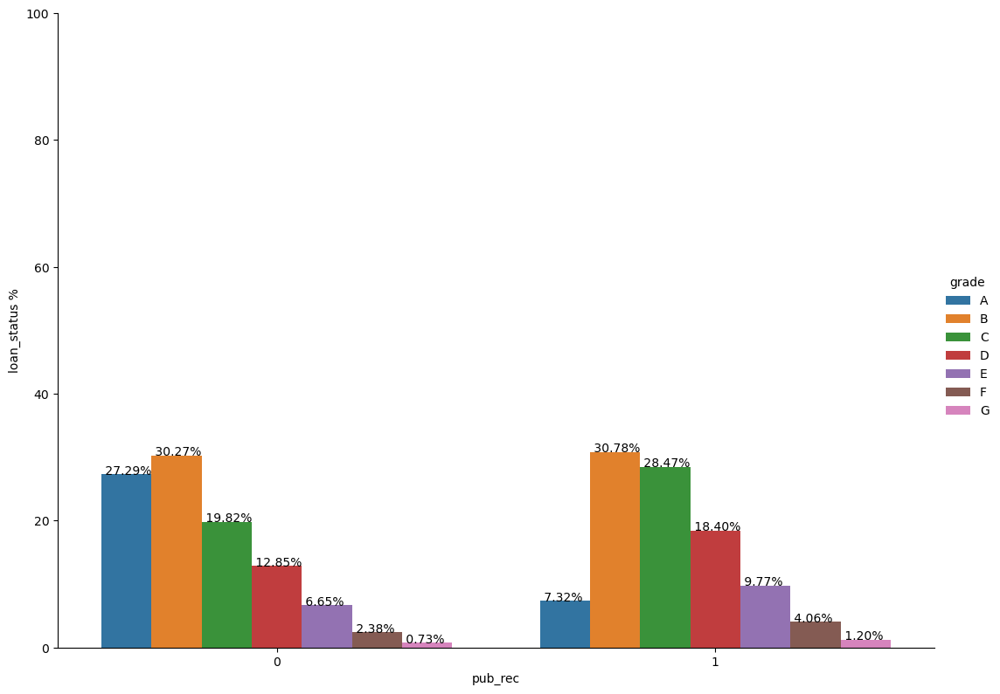

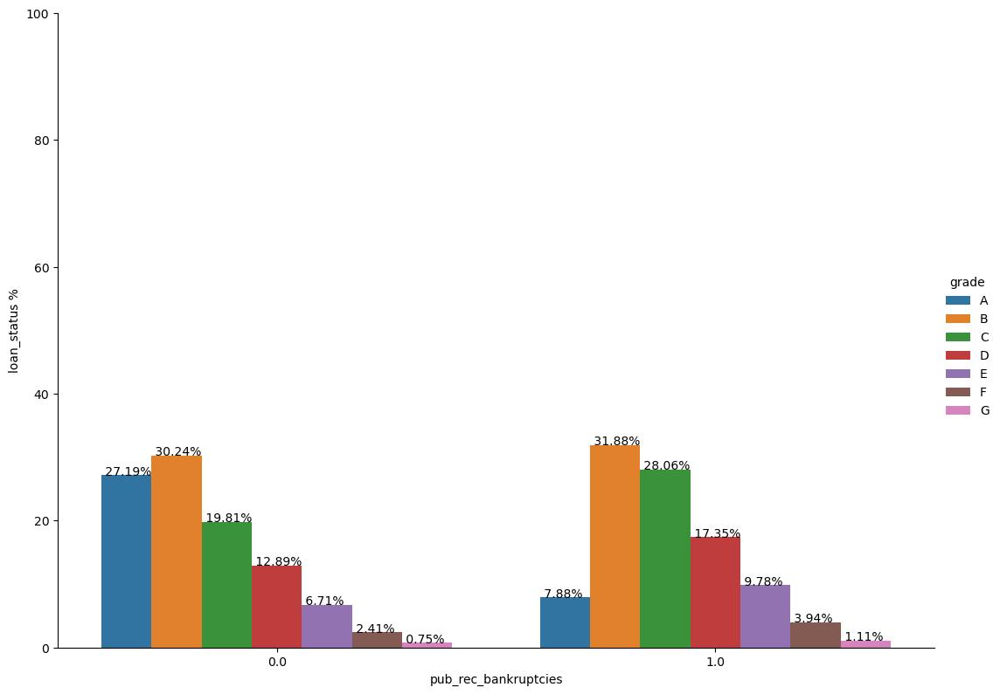

In [14]:
# plot relation between grade and other columns to get additional insights
x_cols = ['annual_inc_bucket', 'loan_amnt_bucket', 'int_rate_bucket', 'installment_bucket', 'term', 'home_ownership', 'dti_bucket',
            'revol_bal_bucket', 'revol_util_bucket', 'total_rec_late_fee_bucket', 'recoveries_bucket', 'collection_recovery_fee_bucket', 
            'verification_status', 'purpose', 'delinq_2yrs', 'inq_last_6mths', 'pub_rec', 'pub_rec_bankruptcies']
for col in x_cols:
    plot_relation_to_loan_status_in_percent(col, df, 'grade')
